In [1]:
# Import necessary libraries
import mplfinance as mpf
import pandas as pd
from alpha_vantage.timeseries import TimeSeries
import matplotlib.pyplot as plt
import numpy as np
import random
import seaborn as sns
import time

In [2]:
# Runs through stock data and calls strategies and graphs
def algorithms(ticker,cash,show_transactions,show_graphs):
    # Loads in dataframe and renames columns
    API_key = 'MCO3JQL81ATB1YZ0'
    time = TimeSeries(key = API_key,output_format='pandas')
    data = time.get_intraday(symbol=ticker,interval='1min',outputsize='full')[0].rename(columns={"1. open":"Open","2. high":"High","3. low":"Low","4. close":"Close","5. volume":"Volume"})
    data = data.sort_index()
    # Splits dataframe into a list of dataframes of each day
    days = [group[1] for group in data.groupby(data.index.dayofyear)]
    num_days = len(days) 
    # Initialize returns for strategies
    strategy1_returns = np.empty(0)
    strategy2_returns = np.empty(0)
    strategy3_returns = np.empty(0)
    strategy4_returns = np.empty(0)
    market_returns = np.empty(0)
    # Loops through dataframes and performs strategies and graphs
    for df in days:
        # Limits data to only during trading hours
        df = df.loc[(df.index >= f'{df.index.date[0]} 9:30:00')]
        df = df.loc[(df.index <= f'{df.index.date[0]} 16:00:00')]   
        # Aggregates one minute period into 5 minute periods
        df = df.resample('5T').agg({'Open':'first','High':'max','Low':'min','Close':'last','Volume':'sum'}) 
        # Add calculated columns for desired indicators 
        df['VWAP'] = (((df['High']+df['Low']+df['Close'])*df['Volume']/3).cumsum())/df['Volume'].cumsum()
        df['percent'] = ((df['Close'])-df['VWAP'])/df['VWAP']
        df['TWAP'] = ((df['Open'] + df['High'] + df['Low'] + df['Close'])/4).expanding().mean()
        df["EMA10"] = df['Close'].ewm(span=10).mean() #50 minutes because 5 minutes per data point
        df["EMA30"] = df['Close'].ewm(span=30).mean() #150 minutes
        df = df.dropna()
        # Plot indicators and price
        if show_graphs:
            title = f'{ticker}\n{df.index[0].month_name()} {df.index[0].day}, {data.index[0].year}'
            vwap = mpf.make_addplot(df['VWAP'])
            twap = mpf.make_addplot(df['TWAP'])
            ema10 = mpf.make_addplot(df['EMA10'])
            ema30 = mpf.make_addplot(df['EMA30'])
            fig, axes = mpf.plot(df,addplot=[vwap,twap,ema10,ema30],type='candle',style='yahoo',volume=True,title=title,returnfig=True)
            axes[0].legend( ['VWAP','TWAP','EMA50','EMA150'] )
            plt.show()
        # Run strategies and add up returns and transatcions using numpy arrays
        strategy1_returns = np.append(strategy1_returns,strategy1(df,ticker,cash/num_days,show_transactions))
        strategy2_returns = np.append(strategy2_returns,strategy2(df,ticker,cash/num_days,show_transactions))
        strategy3_returns = np.append(strategy3_returns,strategy3(df,ticker,cash/num_days,show_transactions))
        strategy4_returns = np.append(strategy4_returns,strategy4(df,ticker,cash/num_days,show_transactions))
        market_returns = np.append(market_returns,market(df,ticker,cash/num_days))
    # Plots the price of the stock over the period
    if show_graphs:
        title = f'{ticker}\n{data.index[0].month_name()} {data.index[0].day}, {data.index[0].year}-{data.index[-1].month_name()} {data.index[-1].day}, {data.index[-1].year}'
        mpf.plot(data,type='line',style='yahoo',title=title)
    returns = np.array([strategy1_returns,strategy2_returns,strategy3_returns,strategy4_returns,market_returns])
    return returns

In [3]:
# VWAP Cross:
# Long when price crosses above VWAP and short when VWAP goes below
def strategy1(df,ticker,cash,show_transactions):
    # Prints which day this is
    date = df.index.date[0]
    if show_transactions:
        print(f'{date}: Starting VWAP Cross strategy with ${cash:.2f} USD')
    # Initialize variables
    i = 0
    cash0 = cash
    shares = 0
    shorts = 0
    transactions = 0
    for index,row in df.iterrows():
        if (not i): 
            # sets initial position based on inital VWAP and price
            long = row['VWAP'] < row['Close'] 
            short = not long
            transactions += 1
            i += 1
            if long:
                shares = cash/row['Close']
                cash = 0
                if show_transactions:
                    print(f"{index.time()}: Buy {shares:.3f} {ticker} shares at {row['Close']} per share")
            if short:
                shorts = cash/row['Close']
                cash = cash0*2
                if show_transactions:
                    print(f"{index.time()}: Open {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")
        # Long position 
        if ((row['VWAP'] < row['Open']) and (row['VWAP'] < row['Close']) and short):
            if show_transactions:
                print(f"{index.time()}: Close {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")
            cash -= shorts*row['Close']
            shares = cash/row['Close']
            shorts = 0
            long = True   
            short = not long
            if show_transactions:
                print(f"{index.time()}: Buy {shares:.3f} {ticker} shares at {row['Close']} per share")
            transactions += 2
        # Short position
        if ((row['VWAP'] > row['Open']) and (row['VWAP'] > row['Close']) and long):
            if show_transactions:
                print(f"{index.time()}: Sell {shares:.3f} {ticker} shares at {row['Close']} per share")
            cash = shares*row['Close']*2
            shorts = shares
            shares = 0       
            short = True
            long = not short
            if show_transactions:
                print(f"{index.time()}: Open {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")
            transactions += 2
        price = row['Close']
    # Exit position and calculate returns
    if short: 
        if show_transactions:
            print(f"{index.time()}: Close {shorts:.3f} {ticker} short contracts at {price} per contract")
        cash -= shorts*price
    if long:
        if show_transactions:
            print(f"{index.time()}: Sell {shares:.3f} {ticker} shares at {row['Close']} per share")
        cash = shares*price
    transactions += 1
    returns = (cash - cash0)/cash0
    if show_transactions:
        print(f'Cash: ${cash:.2f} USD')
        print(f'Return: {returns*100:.2f}%')
        print(f'Transactions: {transactions}')
        print('-'*70)
    return cash

In [4]:
# VWAP Mean Reversion: 
# Long at troughs and short at peaks with assumption that price will return to VWAP
def strategy2(df,ticker,cash,show_transactions):
    # Prints which day this is
    date = df.index.date[0]
    if show_transactions:
        print(f'{date}: Starting VWAP Mean reversion with ${cash:.2f} USD')
    # Initialize variables
    i = 0
    cash0 = cash
    shares = 0
    shorts = 0
    transactions = 0
    percent_from_mean = 0.01
    for index,row in df.iterrows():
        if (not i): 
            # sets initial position based on inital VWAP and price
            long = row['VWAP'] > row['Close'] 
            short = not long
            transactions += 1
            i += 1
            if long:
                shares = cash/row['Close']
                cash = 0
                if show_transactions:
                    print(f"{index.time()}: Buy {shares:.3f} {ticker} shares at {row['Close']} per share")
            if short:
                shorts = cash/row['Close']
                cash = cash0*2
                if show_transactions:
                    print(f"{index.time()}: Open {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")
        # Long position 
        if ((row['percent'] < -(percent_from_mean)) and short):
            if show_transactions:
                print(f"{index.time()}: Close {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")
            cash -= shorts*row['Close']
            shares = cash/row['Close']
            shorts = 0
            long = True   
            short = not long
            if show_transactions:
                print(f"{index.time()}: Buy {shares:.3f} {ticker} shares at {row['Close']} per share")
            transactions += 2
        # Short position
        if ((row['percent'] > percent_from_mean) and long):
            if show_transactions:
                print(f"{index.time()}: Sell {shares:.3f} {ticker} shares at {row['Close']} per share")
            cash = shares*row['Close']*2
            shorts = shares
            shares = 0       
            short = True
            long = not short
            if show_transactions:
                print(f"{index.time()}: Open {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")
            transactions += 2
        price = row['Close']
    # Exit position and calculate returns
    if short: 
        if show_transactions:
            print(f"{index.time()}: Close {shorts:.3f} {ticker} short contracts at {price} per contract")
        cash -= shorts*price
    if long:
        if show_transactions:
            print(f"{index.time()}: Sell {shares:.3f} {ticker} shares at {row['Close']} per share")
        cash = shares*price
    transactions += 1
    returns = (cash - cash0)/cash0
    if show_transactions:
        print(f'Cash: ${cash:.2f} USD')
        print(f'Return: {returns*100:.2f}%')
        print(f'Transactions: {transactions}')
        print('-'*70)
    return cash

In [5]:
# EMA
# Uses the cross of a fast (50 minutes) and slow (100 Minute) moving as a signal to buy or sell
def strategy3(df,ticker,cash,show_transactions):
    # Prints which day this is
    date = df.index.date[0]
    df = df.loc[(df.index >= f'{df.index.date[0]} 11:50:00')]
    if show_transactions:
        print(f'{date}: Starting EMA Cross strategy with ${cash:.2f} USD')
    # Initialize variables
    cash0 = cash
    shares = 0
    transactions = 0
    for index,row in df.iterrows():
        # Buy position 
        if ( ( row['EMA10'] < row['EMA30'] ) and cash ):
            shares = cash/row['Close']
            cash = 0
            if show_transactions:
                print(f"{index.time()}: Buy {shares:.3f} {ticker} shares at {row['Close']} per share")
            transactions += 1
        # Sell position
        if ( ( row['EMA10'] > row['EMA30'] ) and not cash):
            cash = shares*row['Close']
            if show_transactions:
                print(f"{index.time()}: Sell {shares:.3f} {ticker} shares at {row['Close']} per share") 
            shares = 0
            transactions += 1
        price = row['Close']
    # Exit position and calculate returns
    if show_transactions and not cash:
        print(f"{index.time()}: Sell {shares:.3f} {ticker} shares at {row['Close']} per share")
        transactions += 1
    cash += shares*price
    returns = (cash - cash0)/cash0
    if show_transactions:
        print(f'Cash: ${cash:.2f} USD')
        print(f'Return: {returns*100:.2f}%')
        print(f'Transactions: {transactions}')
        print('-'*70)
    return cash

In [6]:
# TWAP + VWAP strategy
# Long when price is greater than VWAP and TWAP and VWAP > TWAP
# Short when price is less than VWAP and TWAP and VWAP < TWAP
def strategy4(df,ticker,cash,show_transactions):
    # Prints which day this is
    date = df.index.date[0]
    if show_transactions:
        print(f'{date}: Starting VWAP + TWAP strategy with ${cash:.2f} USD')
    # Initialize variables
    i = 0
    cash0 = cash
    shares = 0
    shorts = 0
    transactions = 0
    for index,row in df.iterrows():
        if (not i): 
            # sets initial position based on inital VWAP and price
            long = row['VWAP'] < row['Close']
            short = not long
            transactions += 1
            i += 1
            if long:
                shares = cash/row['Close']
                cash = 0
                if show_transactions:
                    print(f"{index.time()}: Buy {shares:.3f} {ticker} shares at {row['Close']} per share")
            if short:
                shorts = cash/row['Close']
                cash = cash0*2
                if show_transactions:
                    print(f"{index.time()}: Open {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")  
        # Long position 
        if ((row['VWAP'] < row['Open']) and (row['VWAP'] < row['Close']) and short and (row['VWAP'] > row['TWAP'])):
            if show_transactions:
                print(f"{index.time()}: Close {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")
            cash -= shorts*row['Close']
            shares = cash/row['Close']
            shorts = 0
            long = True   
            short = not long
            if show_transactions:
                print(f"{index.time()}: Buy {shares:.3f} {ticker} shares at {row['Close']} per share")
            transactions += 2
        # Short position
        if ((row['VWAP'] > row['Open']) and (row['VWAP'] > row['Close']) and long and (row['VWAP'] < row['TWAP'])):
            if show_transactions:
                print(f"{index.time()}: Sell {shares:.3f} {ticker} shares at {row['Close']} per share")
            cash = shares*row['Close']*2
            shorts = shares
            shares = 0       
            short = True
            long = not short
            if show_transactions:
                print(f"{index.time()}: Open {shorts:.3f} {ticker} short contracts at {row['Close']} per contract")
            transactions += 2
        price = row['Close']
    # Exit position and calculate returns
    if short: 
        if show_transactions:
            print(f"{index.time()}: Close {shorts:.3f} {ticker} short contracts at {price} per contract")
        cash -= shorts*price
    if long:
        if show_transactions:
            print(f"{index.time()}: Sell {shares:.3f} {ticker} shares at {row['Close']} per share")
        cash = shares*price
    transactions += 1
    returns = (cash - cash0)/cash0
    if show_transactions:
        print(f'Cash: ${cash:.2f} USD')
        print(f'Return: {returns*100:.2f}%')
        print(f'Transactions: {transactions}')
        print('-'*70)
    return cash

In [7]:
# Market Performance:
# Returns if you bought at open and sold at close
def market(df,ticker,cash):
    open_price = df['Open'].loc[f'{df.index.date[0]} 9:30:00']
    shares = cash/open_price
    close_price = df['Close'].loc[f'{df.index.date[0]} 16:00:00']
    return shares*close_price

In [8]:
# Prints returns for each strategy for one stock at a time
def print_stock_returns(ticker,returns,cash_per_stock):
    print(f'{ticker} Returns')
    for i in range(0,returns.shape[0]-1):
        print(f'Strategy {i+1}: {(np.sum(returns[i]) - cash_per_stock)*100/cash_per_stock:6.3f}%')
    print(f'Market    : {(np.sum(returns[-1]) - cash_per_stock)*100/cash_per_stock:6.3f}%')
    print('-'*70)

In [9]:
# Prints returns for each strategy overall
def print_summary_returns(all_returns,cash,show_graphs):
    # Initialize lists for returns
    strat1 = []
    strat2 = []
    strat3 = []
    strat4 = []
    market = []
    # converts the numpy rows into a longer list 
    for i in range(0,all_returns.shape[0]):
        if i % 5 == 0:
            strat1 = strat1 + all_returns[i].tolist()
        if i % 5 == 1:
            strat2 = strat2 + all_returns[i].tolist()
        if i % 5 == 2:
            strat3 = strat3 + all_returns[i].tolist()
        if i % 5 == 3:
            strat4 = strat4 + all_returns[i].tolist()
        if i % 5 == 4:
            market = market + all_returns[i].tolist()
    # Add lists to dataframe as columns
    df_returns = pd.DataFrame()
    df_returns['VWAP Cross']     = strat1
    df_returns['VWAP Reversion'] = strat2
    df_returns['EMA Cross']      = strat3
    df_returns['VWAP-TWAP']      = strat4
    df_returns['Market']         = market
    # Print returns for the portfolio
    print('Portfolio Returns')
    print(f"Strategy 1: {(df_returns['VWAP Cross'].sum()-cash)*100/cash:6.3f}%")
    print(f"Strategy 2: {(df_returns['VWAP Reversion'].sum()-cash)*100/cash:6.3f}%")
    print(f"Strategy 3: {(df_returns['EMA Cross'].sum()-cash)*100/cash:6.3f}%")
    print(f"Strategy 4: {(df_returns['VWAP-TWAP'].sum()-cash)*100/cash:6.3f}%")
    print(f"Market    : {(df_returns['Market'].sum()-cash)*100/cash:6.3f}%")
    print('-'*70)
    # Calculate and displays correlations between market and strategies
    if show_graphs:
        sns.heatmap(df_returns.corr(), annot = True)
        plt.title("How Correlated are the Strategies to Eachother?")
        plt.xlabel("Strategies")
        plt.ylabel("Strategies")
        plt.show()
    else:
        print(df_returns.corr())

In [10]:
# Calls algorithms function and prints returns using print functions
def main(stocks,cash,show_transactions=False,show_graphs=False):
    begin_time = time.time()
    # Initializes numpy arrays for returns
    returns = np.empty((0,0))
    all_returns = np.empty((0,10))
    # Splits up cash to give same amount to each stock
    cash_per_stock = cash/len(stocks)
    # Loops through stocks and calls functions and aggregates returns
    for i,ticker in enumerate(stocks):
        if (i % 5 == 0):
            start_time = time.time()
        returns = algorithms(ticker,cash_per_stock,show_transactions,show_graphs)
        all_returns = np.append(all_returns,returns,axis=0)
        print_stock_returns(ticker,returns,cash_per_stock)
        # Only get 5 calls per minute on API so this calculation waits
        if (i % 5 == 4 and (time.time()-start_time) < 61):
            wait_time = 61 - time.time() + start_time
            print(f'Waiting {wait_time:.2f} seconds for API ... ')
            time.sleep(wait_time)
    print_summary_returns(all_returns,cash,show_graphs)
    print(f'Program time: {time.time() - begin_time:.2f} seconds')

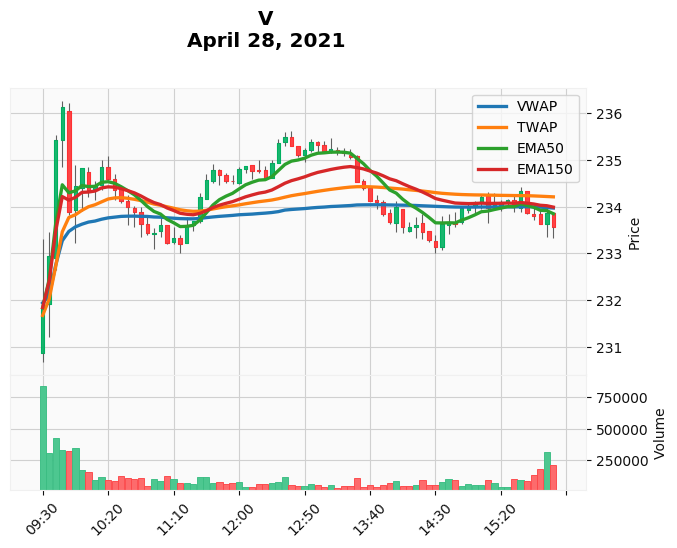

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 3.594 V short contracts at 231.84 per contract
09:40:00: Close 3.594 V short contracts at 235.43 per contract
09:40:00: Buy 3.485 V shares at 235.43 per share
10:50:00: Sell 3.485 V shares at 233.43 per share
10:50:00: Open 3.485 V short contracts at 233.43 per contract
11:35:00: Close 3.485 V short contracts at 234.565 per contract
11:35:00: Buy 3.451 V shares at 234.565 per share
13:55:00: Sell 3.451 V shares at 233.678 per share
13:55:00: Open 3.451 V short contracts at 233.678 per contract
15:05:00: Close 3.451 V short contracts at 234.2 per contract
15:05:00: Buy 3.436 V shares at 234.2 per share
15:45:00: Sell 3.436 V shares at 233.81 per share
15:45:00: Open 3.436 V short contracts at 233.81 per contract
16:00:00: Close 3.436 V short contracts at 233.56 per contract
Cash: $804.16 USD
Return: -3.50%
Transactions: 14
----------------------------------------------------------------------
2021-04-28: Starting V

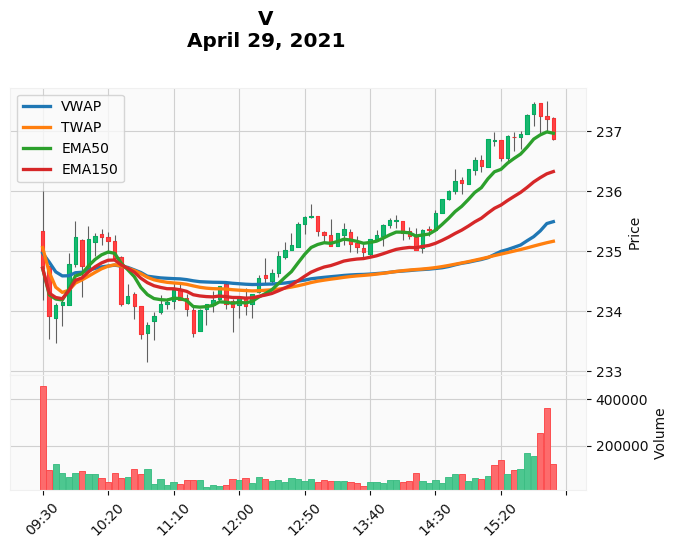

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 3.550 V short contracts at 234.71 per contract
09:55:00: Close 3.550 V short contracts at 235.23 per contract
09:55:00: Buy 3.535 V shares at 235.23 per share
10:35:00: Sell 3.535 V shares at 234.245 per share
10:35:00: Open 3.535 V short contracts at 234.245 per contract
12:20:00: Close 3.535 V short contracts at 234.55 per contract
12:20:00: Buy 3.526 V shares at 234.55 per share
16:00:00: Sell 3.526 V shares at 236.86 per share
Cash: $835.07 USD
Return: 0.21%
Transactions: 8
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 3.550 V shares at 234.71 per share
16:00:00: Sell 3.550 V shares at 236.86 per share
Cash: $840.97 USD
Return: 0.92%
Transactions: 2
----------------------------------------------------------------------
2021-04-29: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 3.560 V shares at 234.11 p

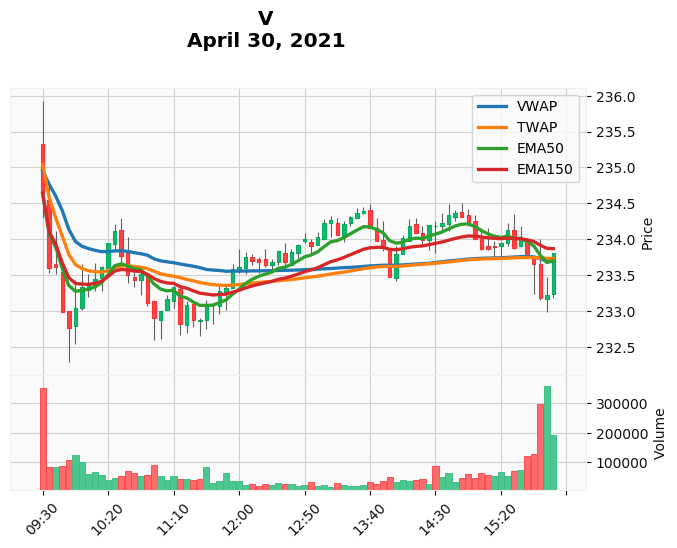

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 3.552 V short contracts at 234.64 per contract
10:25:00: Close 3.552 V short contracts at 234.12 per contract
10:25:00: Buy 3.567 V shares at 234.12 per share
10:35:00: Sell 3.567 V shares at 233.5 per share
10:35:00: Open 3.567 V short contracts at 233.5 per contract
12:00:00: Close 3.567 V short contracts at 233.62 per contract
12:00:00: Buy 3.564 V shares at 233.62 per share
15:50:00: Sell 3.564 V shares at 233.18 per share
15:50:00: Open 3.564 V short contracts at 233.18 per contract
16:00:00: Close 3.564 V short contracts at 233.81 per contract
Cash: $828.73 USD
Return: -0.55%
Transactions: 10
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 3.552 V shares at 234.64 per share
16:00:00: Sell 3.552 V shares at 233.81 per share
Cash: $830.39 USD
Return: -0.35%
Transactions: 2
--------------------------------------------

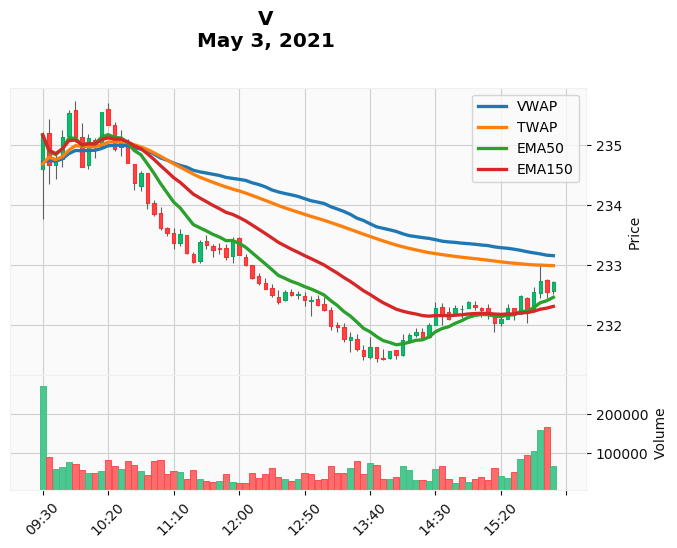

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 3.544 V shares at 235.17 per share
10:40:00: Sell 3.544 V shares at 234.37 per share
10:40:00: Open 3.544 V short contracts at 234.37 per contract
16:00:00: Close 3.544 V short contracts at 232.72 per contract
Cash: $836.35 USD
Return: 0.36%
Transactions: 4
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 3.544 V short contracts at 235.17 per contract
16:00:00: Close 3.544 V short contracts at 232.72 per contract
Cash: $842.01 USD
Return: 1.04%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 3.574 V shares at 233.135 per share
15:35:00: Sell 3.574 V shares at 232.48 per share
Cash: $830.99 USD
Return: -0.28%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting

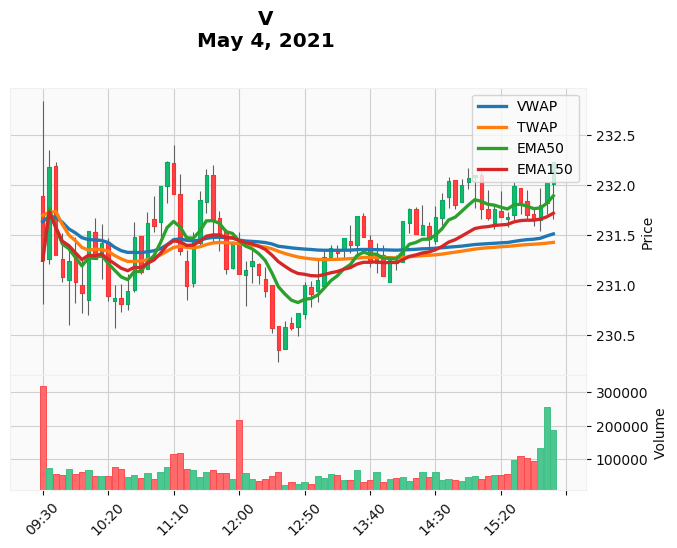

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 3.604 V short contracts at 231.245 per contract
10:55:00: Close 3.604 V short contracts at 231.59 per contract
10:55:00: Buy 3.593 V shares at 231.59 per share
11:20:00: Sell 3.593 V shares at 230.99 per share
11:20:00: Open 3.593 V short contracts at 230.99 per contract
11:35:00: Close 3.593 V short contracts at 232.1 per contract
11:35:00: Buy 3.559 V shares at 232.1 per share
11:55:00: Sell 3.559 V shares at 231.43 per share
11:55:00: Open 3.559 V short contracts at 231.43 per contract
13:20:00: Close 3.559 V short contracts at 231.47 per contract
13:20:00: Buy 3.557 V shares at 231.47 per share
13:45:00: Sell 3.557 V shares at 231.3 per share
13:45:00: Open 3.557 V short contracts at 231.3 per contract
14:10:00: Close 3.557 V short contracts at 231.76 per contract
14:10:00: Buy 3.543 V shares at 231.76 per share
16:00:00: Sell 3.543 V shares at 232.23 per share
Cash: $822.84 USD
Return: -1.26%
Transactions: 16

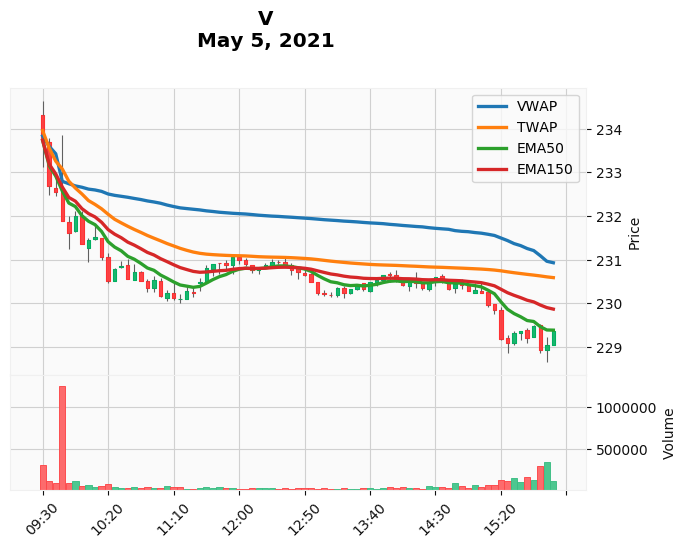

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 3.565 V short contracts at 233.73 per contract
16:00:00: Close 3.565 V short contracts at 229.37 per contract
Cash: $848.88 USD
Return: 1.87%
Transactions: 2
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 3.565 V shares at 233.73 per share
16:00:00: Sell 3.565 V shares at 229.37 per share
Cash: $817.79 USD
Return: -1.87%
Transactions: 2
----------------------------------------------------------------------
2021-05-05: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 3.610 V shares at 230.87 per share
12:05:00: Sell 3.610 V shares at 230.91 per share
12:10:00: Buy 3.612 V shares at 230.76 per share
12:20:00: Sell 3.612 V shares at 230.87 per share
12:50:00: Buy 3.615 V shares at 230.65 per share
16:00:00: Sell 3.615 V shares at 229.37 per share
Cash: $829.25 USD
Return: -0.49%
Transactions: 6
------------------

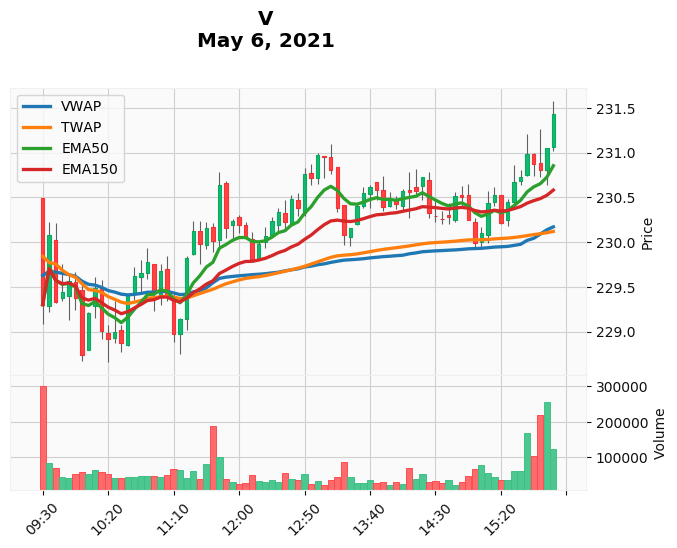

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 3.634 V short contracts at 229.3 per contract
10:40:00: Close 3.634 V short contracts at 229.625 per contract
10:40:00: Buy 3.624 V shares at 229.625 per share
11:10:00: Sell 3.624 V shares at 228.97 per share
11:10:00: Open 3.624 V short contracts at 228.97 per contract
11:25:00: Close 3.624 V short contracts at 230.12 per contract
11:25:00: Buy 3.588 V shares at 230.12 per share
16:00:00: Sell 3.588 V shares at 231.43 per share
Cash: $830.31 USD
Return: -0.36%
Transactions: 8
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 3.634 V shares at 229.3 per share
16:00:00: Sell 3.634 V shares at 231.43 per share
Cash: $841.07 USD
Return: 0.93%
Transactions: 2
----------------------------------------------------------------------
2021-05-06: Starting EMA Cross strategy with $833.33 USD
15:00:00: Buy 3.623 V shares at 229.9901 

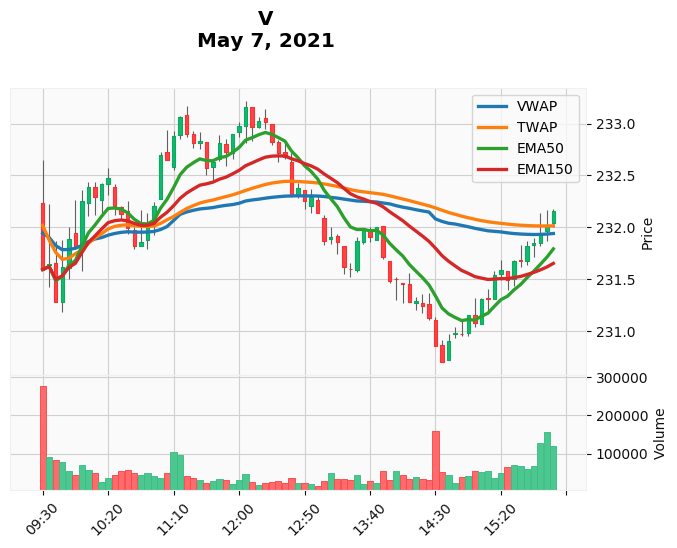

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 3.598 V short contracts at 231.595 per contract
09:55:00: Close 3.598 V short contracts at 231.82 per contract
09:55:00: Buy 3.591 V shares at 231.82 per share
10:45:00: Sell 3.591 V shares at 231.86 per share
10:45:00: Open 3.591 V short contracts at 231.86 per contract
10:55:00: Close 3.591 V short contracts at 232.21 per contract
10:55:00: Buy 3.580 V shares at 232.21 per share
12:55:00: Sell 3.580 V shares at 232.29 per share
12:55:00: Open 3.580 V short contracts at 232.29 per contract
15:55:00: Close 3.580 V short contracts at 232.02 per contract
15:55:00: Buy 3.589 V shares at 232.02 per share
16:00:00: Sell 3.589 V shares at 232.16 per share
Cash: $833.17 USD
Return: -0.02%
Transactions: 12
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 3.598 V shares at 231.595 per share
16:00:00: Sell 3.598 V shares at 232.16 

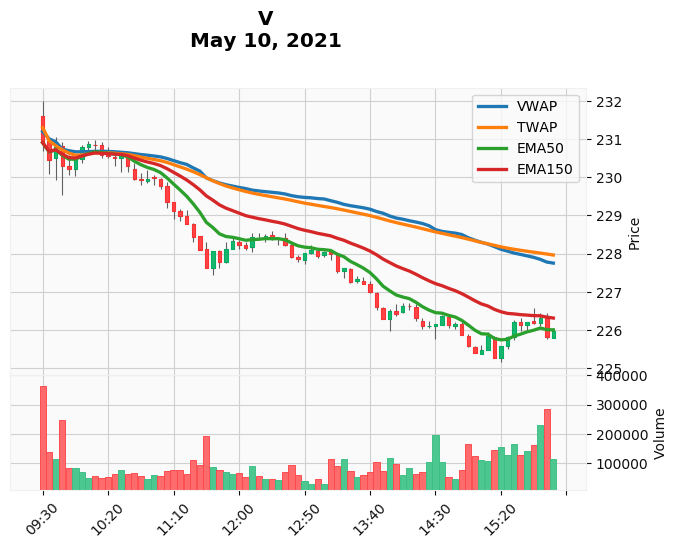

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 3.609 V short contracts at 230.9 per contract
10:05:00: Close 3.609 V short contracts at 230.8595 per contract
10:05:00: Buy 3.610 V shares at 230.8595 per share
10:20:00: Sell 3.610 V shares at 230.5517 per share
10:20:00: Open 3.610 V short contracts at 230.5517 per contract
16:00:00: Close 3.610 V short contracts at 225.97 per contract
Cash: $848.91 USD
Return: 1.87%
Transactions: 6
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 3.609 V shares at 230.9 per share
16:00:00: Sell 3.609 V shares at 225.97 per share
Cash: $815.54 USD
Return: -2.14%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 3.653 V shares at 228.13 per share
16:00:00: Sell 3.653 V shares at 225.97 per share
Cash: $825.44 USD
Return: -0.95%
Tr

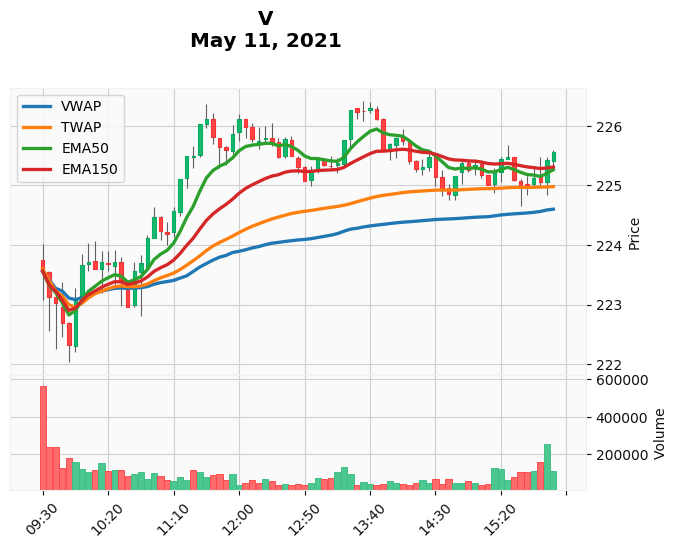

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 3.728 V shares at 223.56 per share
09:40:00: Sell 3.728 V shares at 223.0191 per share
09:40:00: Open 3.728 V short contracts at 223.0191 per contract
10:05:00: Close 3.728 V short contracts at 223.705 per contract
10:05:00: Buy 3.705 V shares at 223.705 per share
16:00:00: Sell 3.705 V shares at 225.56 per share
Cash: $835.63 USD
Return: 0.28%
Transactions: 6
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 3.728 V short contracts at 223.56 per contract
16:00:00: Close 3.728 V short contracts at 225.56 per contract
Cash: $825.88 USD
Return: -0.89%
Transactions: 2
----------------------------------------------------------------------
2021-05-11: Starting EMA Cross strategy with $833.33 USD
14:30:00: Buy 3.701 V shares at 225.14 per share
16:00:00: Sell 3.701 V shares at 225.56 per share
Cash: $834.89 USD
Return: 0.19%
Tra

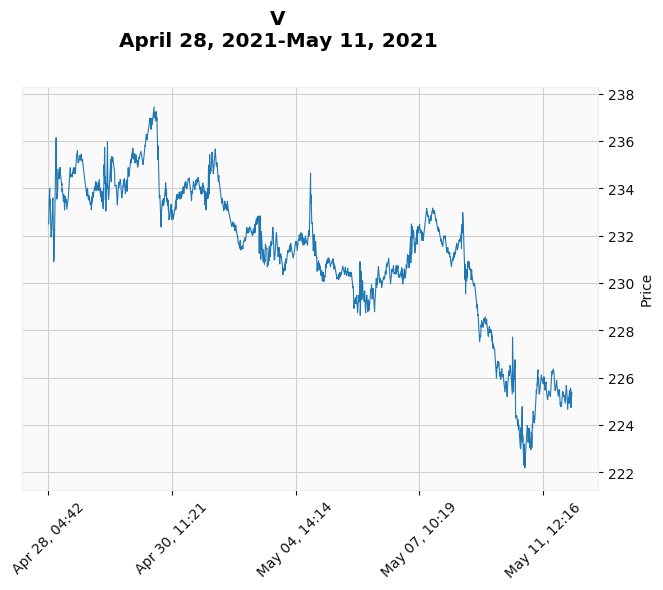

V Returns
Strategy 1: -0.111%
Strategy 2:  0.066%
Strategy 3: -0.115%
Strategy 4:  0.060%
Market    : -0.283%
----------------------------------------------------------------------


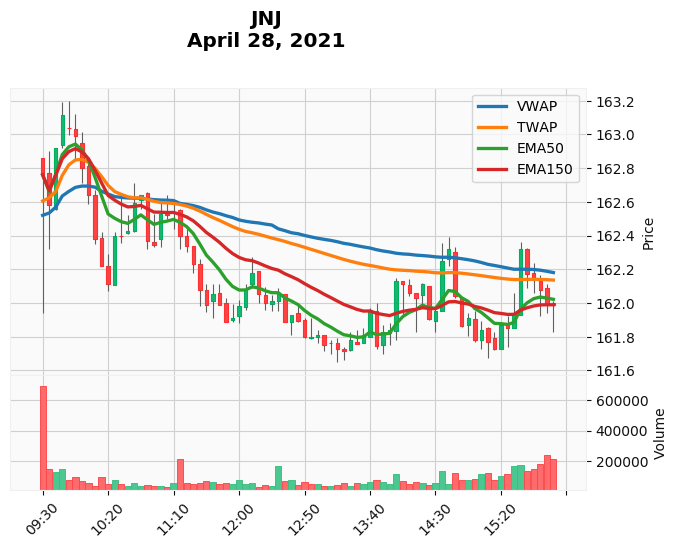

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 5.120 JNJ shares at 162.76 per share
10:10:00: Sell 5.120 JNJ shares at 162.38 per share
10:10:00: Open 5.120 JNJ short contracts at 162.38 per contract
16:00:00: Close 5.120 JNJ short contracts at 161.99 per contract
Cash: $833.38 USD
Return: 0.01%
Transactions: 4
----------------------------------------------------------------------
2021-04-28: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 5.120 JNJ short contracts at 162.76 per contract
16:00:00: Close 5.120 JNJ short contracts at 161.99 per contract
Cash: $837.28 USD
Return: 0.47%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 5.148 JNJ shares at 161.89 per share
14:20:00: Sell 5.148 JNJ shares at 162.11 per share
15:00:00: Buy 5.158 JNJ shares at 161.78 per share
15:35:00: Sell 5.158 JNJ shares at 162.32 per share
Cash: $837.25 USD
Retu

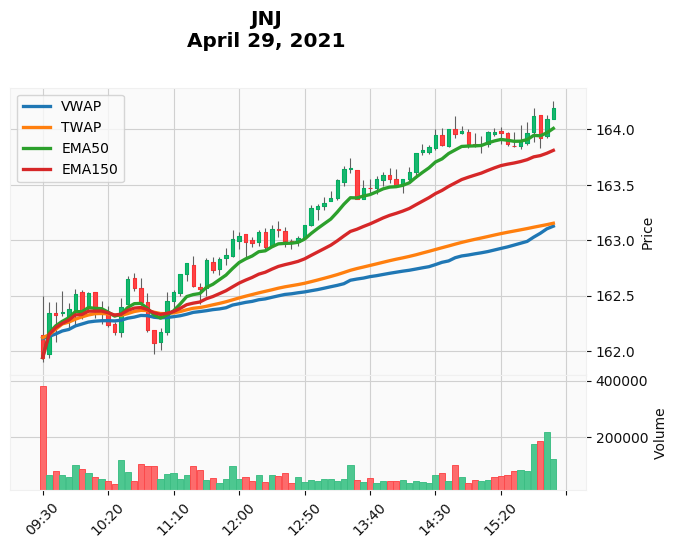

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 5.146 JNJ short contracts at 161.94 per contract
09:40:00: Close 5.146 JNJ short contracts at 162.3222 per contract
09:40:00: Buy 5.122 JNJ shares at 162.3222 per share
10:25:00: Sell 5.122 JNJ shares at 162.17 per share
10:25:00: Open 5.122 JNJ short contracts at 162.17 per contract
10:35:00: Close 5.122 JNJ short contracts at 162.65 per contract
10:35:00: Buy 5.091 JNJ shares at 162.65 per share
10:55:00: Sell 5.091 JNJ shares at 162.07 per share
10:55:00: Open 5.091 JNJ short contracts at 162.07 per contract
11:10:00: Close 5.091 JNJ short contracts at 162.5285 per contract
11:10:00: Buy 5.063 JNJ shares at 162.5285 per share
16:00:00: Sell 5.063 JNJ shares at 164.19 per share
Cash: $831.25 USD
Return: -0.25%
Transactions: 12
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 5.146 JNJ shares at 161.94 per share
16:00:00

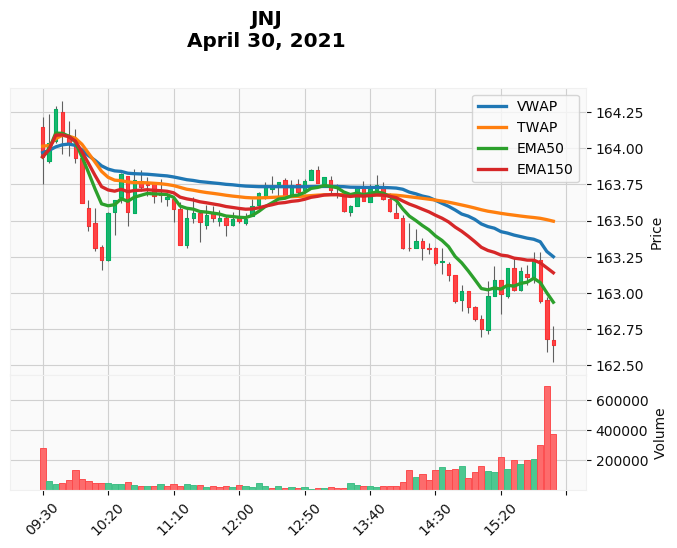

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 5.083 JNJ short contracts at 163.94 per contract
09:40:00: Close 5.083 JNJ short contracts at 164.27 per contract
09:40:00: Buy 5.063 JNJ shares at 164.27 per share
09:55:00: Sell 5.063 JNJ shares at 163.93 per share
09:55:00: Open 5.063 JNJ short contracts at 163.93 per contract
12:30:00: Close 5.063 JNJ short contracts at 163.77 per contract
12:30:00: Buy 5.073 JNJ shares at 163.77 per share
13:15:00: Sell 5.073 JNJ shares at 163.685 per share
13:15:00: Open 5.073 JNJ short contracts at 163.685 per contract
16:00:00: Close 5.073 JNJ short contracts at 162.64 per contract
Cash: $835.61 USD
Return: 0.27%
Transactions: 10
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 5.083 JNJ shares at 163.94 per share
16:00:00: Sell 5.083 JNJ shares at 162.64 per share
Cash: $826.73 USD
Return: -0.79%
Transactions: 2
-----------------

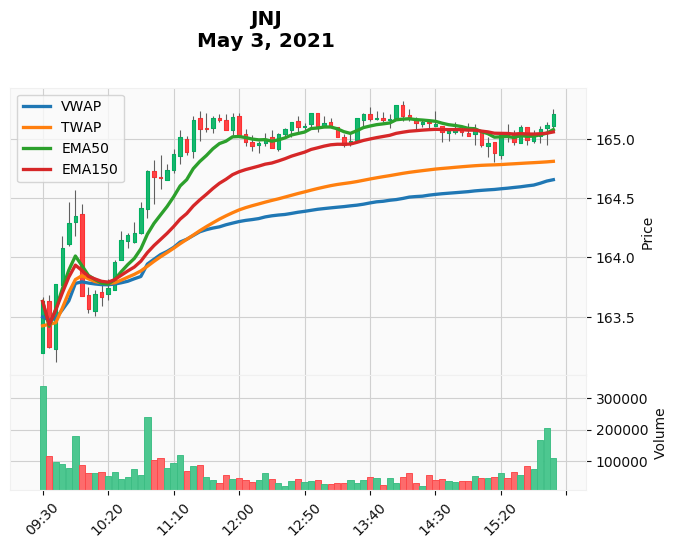

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 5.093 JNJ shares at 163.63 per share
10:05:00: Sell 5.093 JNJ shares at 163.57 per share
10:05:00: Open 5.093 JNJ short contracts at 163.57 per contract
10:30:00: Close 5.093 JNJ short contracts at 164.15 per contract
10:30:00: Buy 5.057 JNJ shares at 164.15 per share
16:00:00: Sell 5.057 JNJ shares at 165.21 per share
Cash: $835.43 USD
Return: 0.25%
Transactions: 6
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 5.093 JNJ short contracts at 163.63 per contract
16:00:00: Close 5.093 JNJ short contracts at 165.21 per contract
Cash: $825.29 USD
Return: -0.97%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
15:05:00: Buy 5.052 JNJ shares at 164.95 per share
15:55:00: Sell 5.052 JNJ shares at 165.1118 per share
Cash: $834.15 USD
R

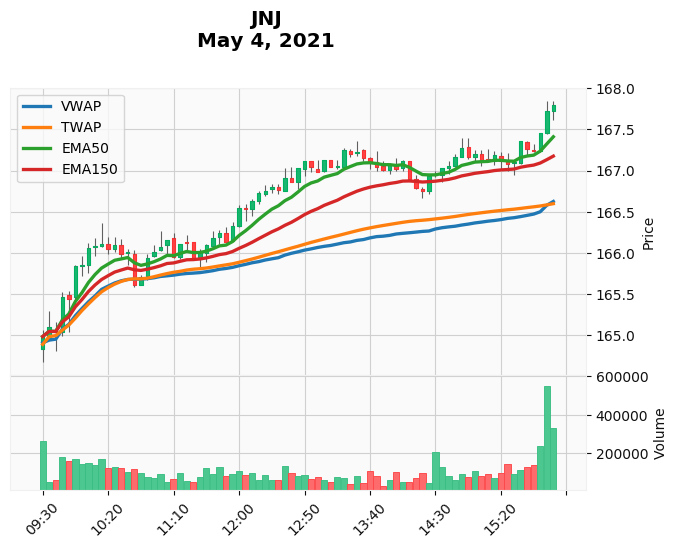

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 5.051 JNJ shares at 164.98 per share
16:00:00: Sell 5.051 JNJ shares at 167.8 per share
Cash: $847.58 USD
Return: 1.71%
Transactions: 2
----------------------------------------------------------------------
2021-05-04: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 5.051 JNJ short contracts at 164.98 per contract
16:00:00: Close 5.051 JNJ short contracts at 167.8 per contract
Cash: $819.09 USD
Return: -1.71%
Transactions: 2
----------------------------------------------------------------------
2021-05-04: Starting EMA Cross strategy with $833.33 USD
Cash: $833.33 USD
Return: 0.00%
Transactions: 0
----------------------------------------------------------------------
2021-05-04: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Buy 5.051 JNJ shares at 164.98 per share
16:00:00: Sell 5.051 JNJ shares at 167.8 per share
Cash: $847.58 USD
Return: 1.71%
Transactions: 2
------------------------------

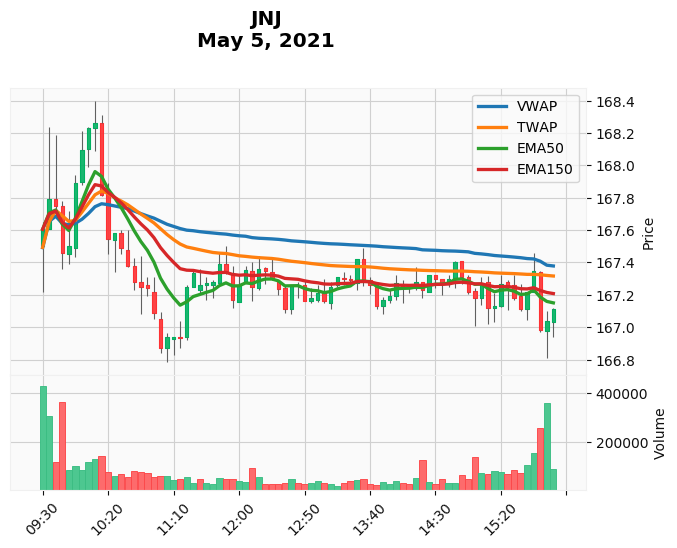

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 4.972 JNJ shares at 167.605 per share
09:50:00: Sell 4.972 JNJ shares at 167.5 per share
09:50:00: Open 4.972 JNJ short contracts at 167.5 per contract
10:00:00: Close 4.972 JNJ short contracts at 168.095 per contract
10:00:00: Buy 4.937 JNJ shares at 168.095 per share
10:25:00: Sell 4.937 JNJ shares at 167.585 per share
10:25:00: Open 4.937 JNJ short contracts at 167.585 per contract
16:00:00: Close 4.937 JNJ short contracts at 167.11 per contract
Cash: $829.68 USD
Return: -0.44%
Transactions: 8
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 4.972 JNJ short contracts at 167.605 per contract
16:00:00: Close 4.972 JNJ short contracts at 167.11 per contract
Cash: $835.79 USD
Return: 0.30%
Transactions: 2
----------------------------------------------------------------------
2021-05-05: Starting EMA Cross strategy with $83

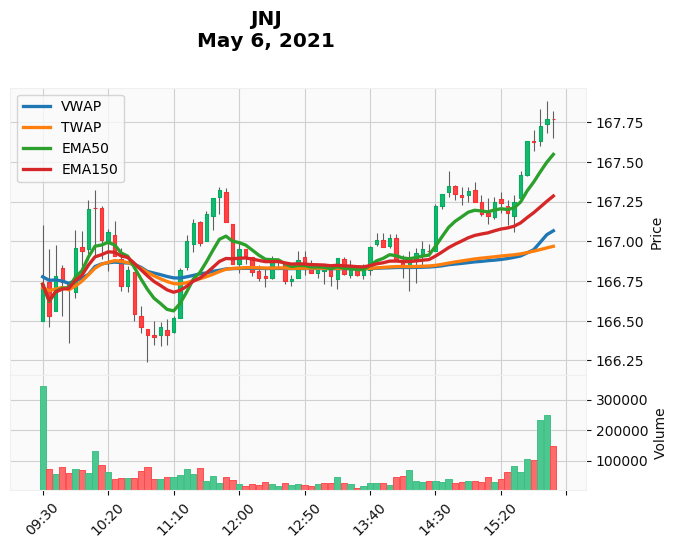

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 4.998 JNJ short contracts at 166.73 per contract
10:00:00: Close 4.998 JNJ short contracts at 166.94 per contract
10:00:00: Buy 4.986 JNJ shares at 166.94 per share
10:35:00: Sell 4.986 JNJ shares at 166.82 per share
10:35:00: Open 4.986 JNJ short contracts at 166.82 per contract
11:20:00: Close 4.986 JNJ short contracts at 167.0 per contract
11:20:00: Buy 4.975 JNJ shares at 167.0 per share
12:15:00: Sell 4.975 JNJ shares at 166.77 per share
12:15:00: Open 4.975 JNJ short contracts at 166.77 per contract
12:30:00: Close 4.975 JNJ short contracts at 166.88 per contract
12:30:00: Buy 4.968 JNJ shares at 166.88 per share
12:40:00: Sell 4.968 JNJ shares at 166.76 per share
12:40:00: Open 4.968 JNJ short contracts at 166.76 per contract
12:50:00: Close 4.968 JNJ short contracts at 166.84 per contract
12:50:00: Buy 4.963 JNJ shares at 166.84 per share
13:25:00: Sell 4.963 JNJ shares at 166.82 per share
13:25:00: Open 4

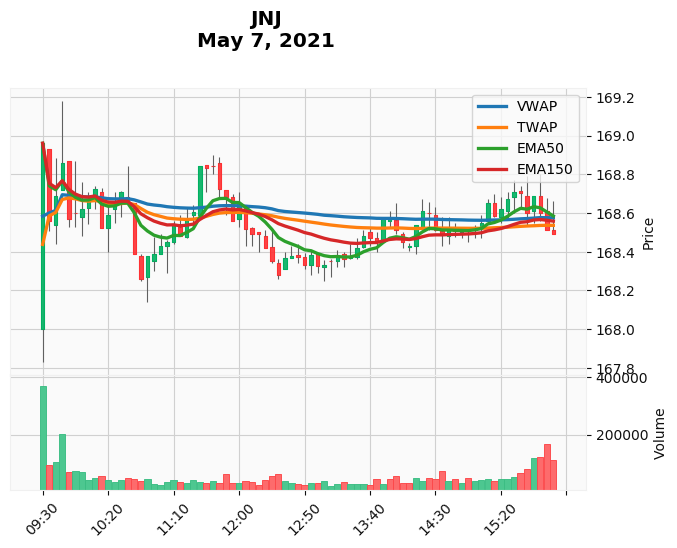

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 4.932 JNJ shares at 168.96 per share
09:55:00: Sell 4.932 JNJ shares at 168.5984 per share
09:55:00: Open 4.932 JNJ short contracts at 168.5984 per contract
11:35:00: Close 4.932 JNJ short contracts at 168.83 per contract
11:35:00: Buy 4.919 JNJ shares at 168.83 per share
12:10:00: Sell 4.919 JNJ shares at 168.49 per share
12:10:00: Open 4.919 JNJ short contracts at 168.49 per contract
14:25:00: Close 4.919 JNJ short contracts at 168.6 per contract
14:25:00: Buy 4.912 JNJ shares at 168.6 per share
14:35:00: Sell 4.912 JNJ shares at 168.485 per share
14:35:00: Open 4.912 JNJ short contracts at 168.485 per contract
15:15:00: Close 4.912 JNJ short contracts at 168.5846 per contract
15:15:00: Buy 4.906 JNJ shares at 168.5846 per share
16:00:00: Sell 4.906 JNJ shares at 168.49 per share
16:00:00: Open 4.906 JNJ short contracts at 168.49 per contract
16:00:00: Close 4.906 JNJ short contracts at 168.49 per contract
Cash: 

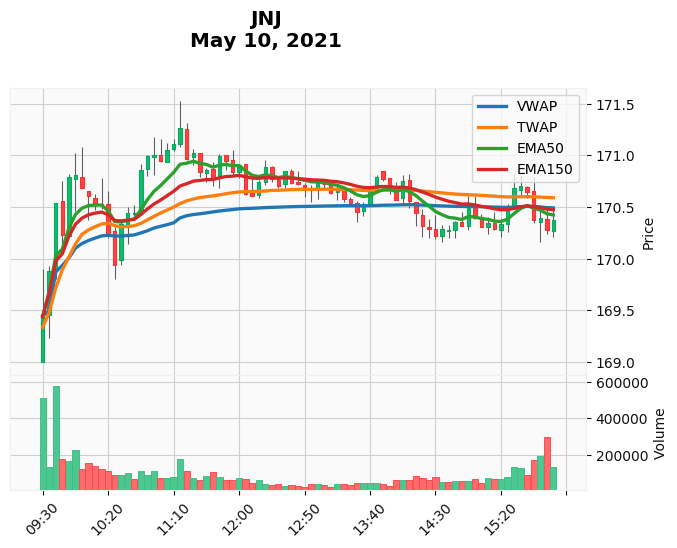

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 4.918 JNJ short contracts at 169.44 per contract
09:40:00: Close 4.918 JNJ short contracts at 170.54 per contract
09:40:00: Buy 4.855 JNJ shares at 170.54 per share
14:20:00: Sell 4.855 JNJ shares at 170.32 per share
14:20:00: Open 4.855 JNJ short contracts at 170.32 per contract
15:35:00: Close 4.855 JNJ short contracts at 170.7 per contract
15:35:00: Buy 4.833 JNJ shares at 170.7 per share
15:50:00: Sell 4.833 JNJ shares at 170.39 per share
15:50:00: Open 4.833 JNJ short contracts at 170.39 per contract
16:00:00: Close 4.833 JNJ short contracts at 170.37 per contract
Cash: $823.61 USD
Return: -1.17%
Transactions: 10
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 4.918 JNJ shares at 169.44 per share
16:00:00: Sell 4.918 JNJ shares at 170.37 per share
Cash: $837.91 USD
Return: 0.55%
Transactions: 2
---------------------

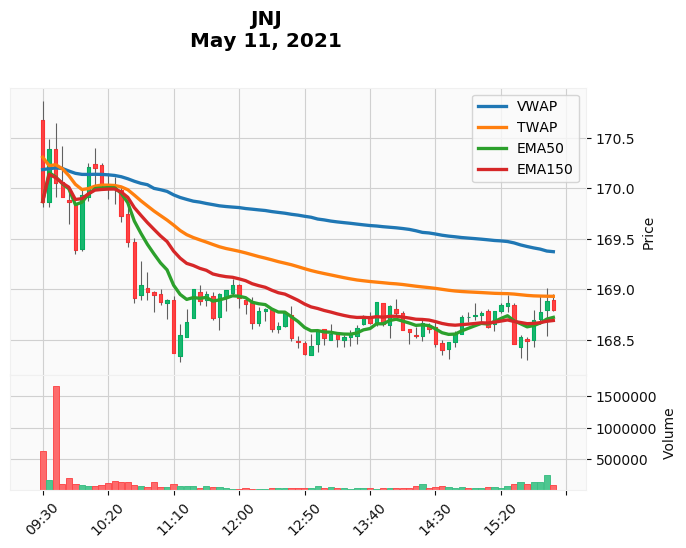

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 4.906 JNJ short contracts at 169.87 per contract
10:10:00: Close 4.906 JNJ short contracts at 170.2 per contract
10:10:00: Buy 4.887 JNJ shares at 170.2 per share
10:20:00: Sell 4.887 JNJ shares at 170.02 per share
10:20:00: Open 4.887 JNJ short contracts at 170.02 per contract
16:00:00: Close 4.887 JNJ short contracts at 168.8 per contract
Cash: $836.80 USD
Return: 0.42%
Transactions: 6
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 4.906 JNJ shares at 169.87 per share
16:00:00: Sell 4.906 JNJ shares at 168.8 per share
Cash: $828.08 USD
Return: -0.63%
Transactions: 2
----------------------------------------------------------------------
2021-05-11: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 4.931 JNJ shares at 168.99 per share
15:15:00: Sell 4.931 JNJ shares at 168.79 per share
15:35:00: Buy 4.939 JNJ s

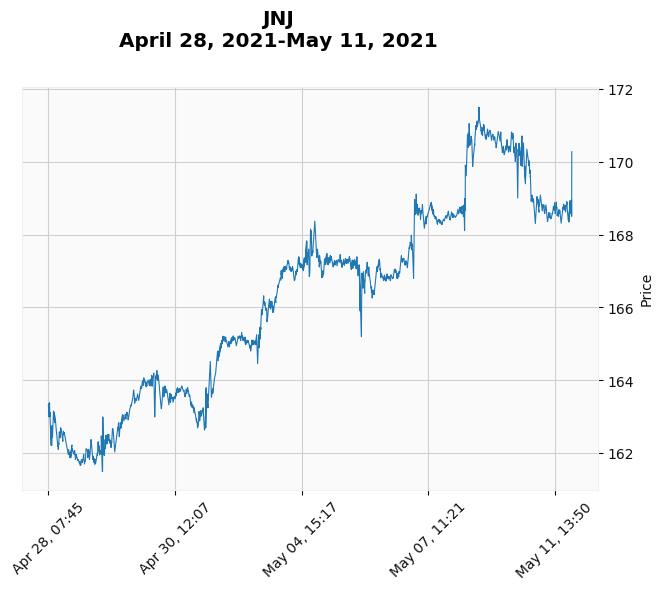

JNJ Returns
Strategy 1: -0.030%
Strategy 2: -0.049%
Strategy 3:  0.049%
Strategy 4: -0.282%
Market    :  0.337%
----------------------------------------------------------------------


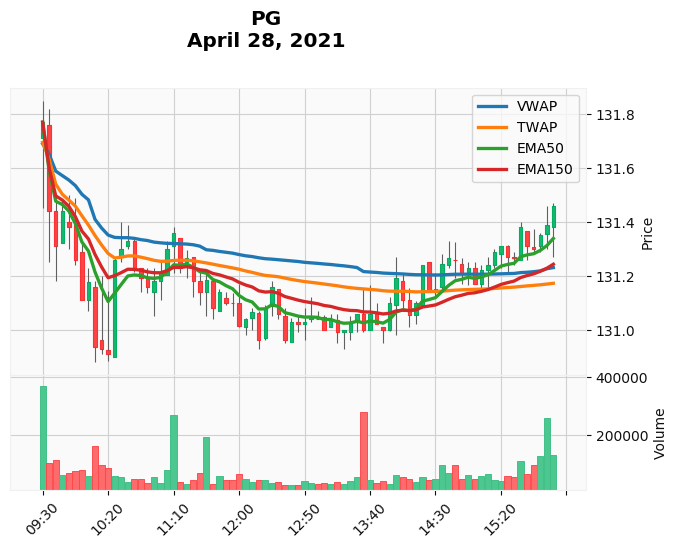

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.324 PG shares at 131.77 per share
09:40:00: Sell 6.324 PG shares at 131.31 per share
09:40:00: Open 6.324 PG short contracts at 131.31 per contract
14:40:00: Close 6.324 PG short contracts at 131.265 per contract
14:40:00: Buy 6.328 PG shares at 131.265 per share
16:00:00: Sell 6.328 PG shares at 131.46 per share
Cash: $831.94 USD
Return: -0.17%
Transactions: 6
----------------------------------------------------------------------
2021-04-28: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.324 PG short contracts at 131.77 per contract
16:00:00: Close 6.324 PG short contracts at 131.46 per contract
Cash: $835.29 USD
Return: 0.24%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 6.356 PG shares at 131.1 per share
14:05:00: Sell 6.356 PG shares at 131.11 per share
14:10:00: Buy 6.359 PG shares 

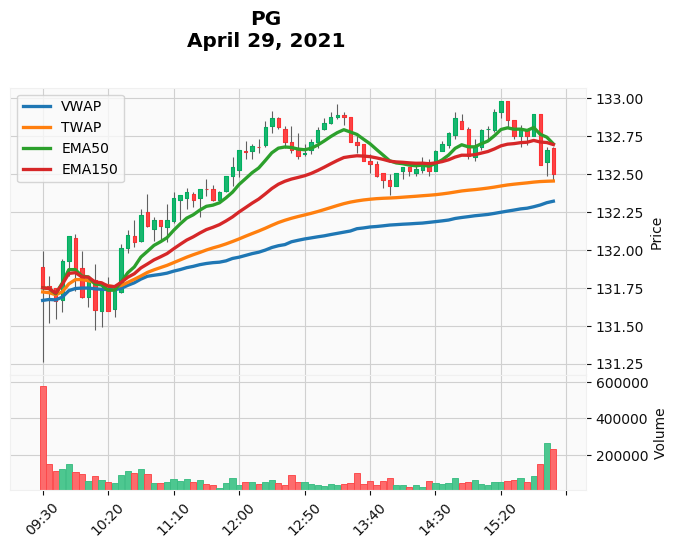

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.325 PG shares at 131.75 per share
10:20:00: Sell 6.325 PG shares at 131.6 per share
10:20:00: Open 6.325 PG short contracts at 131.6 per contract
10:35:00: Close 6.325 PG short contracts at 132.1 per contract
10:35:00: Buy 6.277 PG shares at 132.1 per share
16:00:00: Sell 6.277 PG shares at 132.5 per share
Cash: $831.73 USD
Return: -0.19%
Transactions: 6
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.325 PG short contracts at 131.75 per contract
16:00:00: Close 6.325 PG short contracts at 132.5 per contract
Cash: $828.59 USD
Return: -0.57%
Transactions: 2
----------------------------------------------------------------------
2021-04-29: Starting EMA Cross strategy with $833.33 USD
14:00:00: Buy 6.289 PG shares at 132.51 per share
14:35:00: Sell 6.289 PG shares at 132.7 per share
Cash: $834.53 USD
Return: 0.14%
Trans

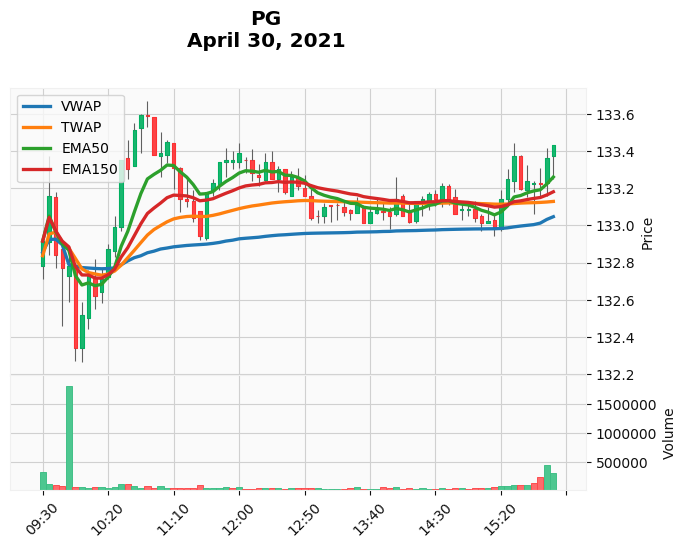

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.270 PG shares at 132.915 per share
09:45:00: Sell 6.270 PG shares at 132.77 per share
09:45:00: Open 6.270 PG short contracts at 132.77 per contract
10:25:00: Close 6.270 PG short contracts at 132.99 per contract
10:25:00: Buy 6.249 PG shares at 132.99 per share
16:00:00: Sell 6.249 PG shares at 133.43 per share
Cash: $833.79 USD
Return: 0.06%
Transactions: 6
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.270 PG short contracts at 132.915 per contract
16:00:00: Close 6.270 PG short contracts at 133.43 per contract
Cash: $830.10 USD
Return: -0.39%
Transactions: 2
----------------------------------------------------------------------
2021-04-30: Starting EMA Cross strategy with $833.33 USD
12:55:00: Buy 6.264 PG shares at 133.04 per share
15:30:00: Sell 6.264 PG shares at 133.37 per share
Cash: $835.40 USD
Return: 0.2

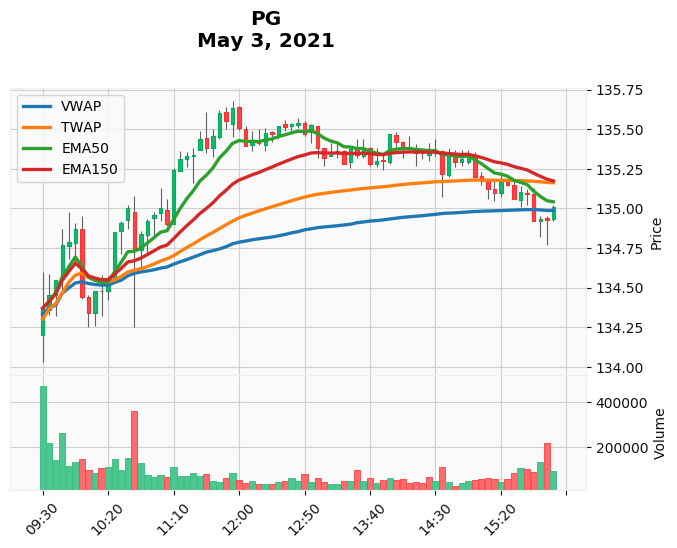

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.202 PG shares at 134.37 per share
10:05:00: Sell 6.202 PG shares at 134.34 per share
10:05:00: Open 6.202 PG short contracts at 134.34 per contract
10:25:00: Close 6.202 PG short contracts at 134.85 per contract
10:25:00: Buy 6.155 PG shares at 134.85 per share
15:50:00: Sell 6.155 PG shares at 134.93 per share
15:50:00: Open 6.155 PG short contracts at 134.93 per contract
16:00:00: Close 6.155 PG short contracts at 135.01 per contract
Cash: $829.98 USD
Return: -0.40%
Transactions: 8
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.202 PG short contracts at 134.37 per contract
16:00:00: Close 6.202 PG short contracts at 135.01 per contract
Cash: $829.36 USD
Return: -0.48%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
14:3

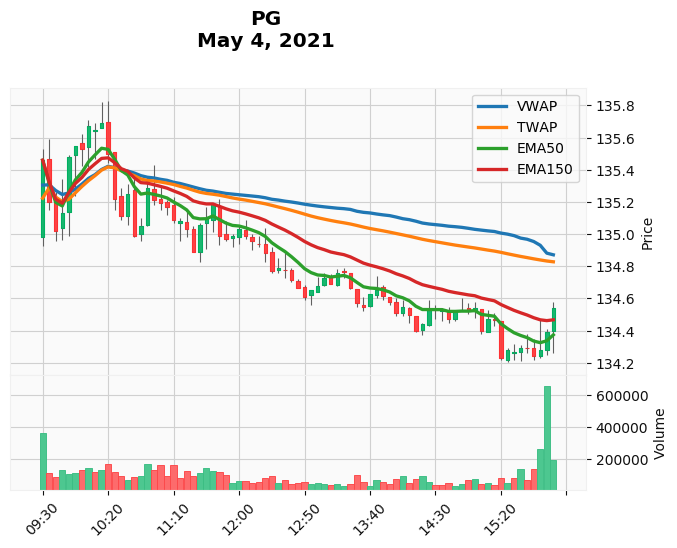

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.152 PG shares at 135.46 per share
09:40:00: Sell 6.152 PG shares at 135.02 per share
09:40:00: Open 6.152 PG short contracts at 135.02 per contract
09:55:00: Close 6.152 PG short contracts at 135.55 per contract
09:55:00: Buy 6.104 PG shares at 135.55 per share
10:30:00: Sell 6.104 PG shares at 135.11 per share
10:30:00: Open 6.104 PG short contracts at 135.11 per contract
16:00:00: Close 6.104 PG short contracts at 134.54 per contract
Cash: $828.16 USD
Return: -0.62%
Transactions: 8
----------------------------------------------------------------------
2021-05-04: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.152 PG short contracts at 135.46 per contract
16:00:00: Close 6.152 PG short contracts at 134.54 per contract
Cash: $838.99 USD
Return: 0.68%
Transactions: 2
----------------------------------------------------------------------
2021-05-04: Starting EMA Cross strategy with $833.33 USD
11:50

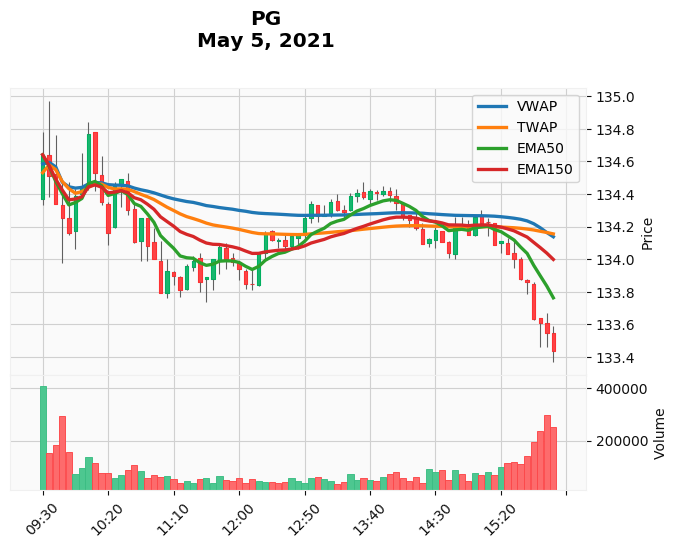

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.189 PG shares at 134.64 per share
09:40:00: Sell 6.189 PG shares at 134.34 per share
09:40:00: Open 6.189 PG short contracts at 134.34 per contract
10:10:00: Close 6.189 PG short contracts at 134.5262 per contract
10:10:00: Buy 6.172 PG shares at 134.5262 per share
10:20:00: Sell 6.172 PG shares at 134.1602 per share
10:20:00: Open 6.172 PG short contracts at 134.1602 per contract
10:30:00: Close 6.172 PG short contracts at 134.49 per contract
10:30:00: Buy 6.142 PG shares at 134.49 per share
10:40:00: Sell 6.142 PG shares at 134.105 per share
10:40:00: Open 6.142 PG short contracts at 134.105 per contract
13:10:00: Close 6.142 PG short contracts at 134.35 per contract
13:10:00: Buy 6.120 PG shares at 134.35 per share
14:10:00: Sell 6.120 PG shares at 134.24 per share
14:10:00: Open 6.120 PG short contracts at 134.24 per contract
16:00:00: Close 6.120 PG short contracts at 133.44 per contract
Cash: $826.38 USD
Re

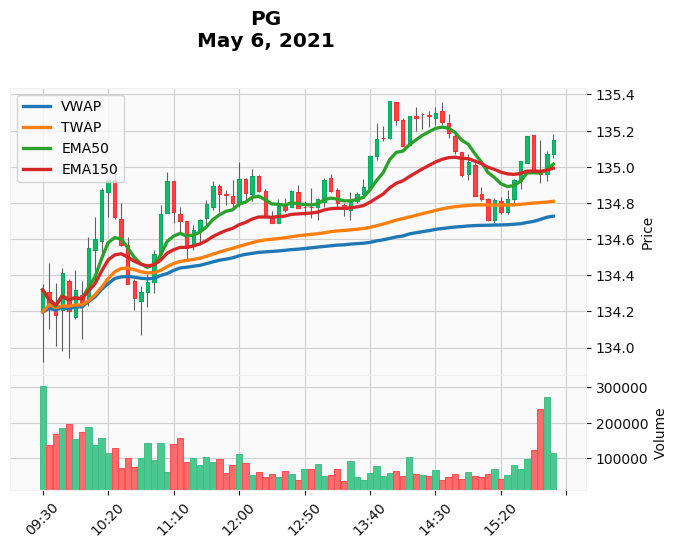

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.204 PG shares at 134.32 per share
10:40:00: Sell 6.204 PG shares at 134.275 per share
10:40:00: Open 6.204 PG short contracts at 134.275 per contract
11:00:00: Close 6.204 PG short contracts at 134.74 per contract
11:00:00: Buy 6.161 PG shares at 134.74 per share
16:00:00: Sell 6.161 PG shares at 135.15 per share
Cash: $832.70 USD
Return: -0.08%
Transactions: 6
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.204 PG short contracts at 134.32 per contract
16:00:00: Close 6.204 PG short contracts at 135.15 per contract
Cash: $828.18 USD
Return: -0.62%
Transactions: 2
----------------------------------------------------------------------
2021-05-06: Starting EMA Cross strategy with $833.33 USD
15:10:00: Buy 6.186 PG shares at 134.7057 per share
15:55:00: Sell 6.186 PG shares at 135.07 per share
Cash: $835.59 USD
Return: 

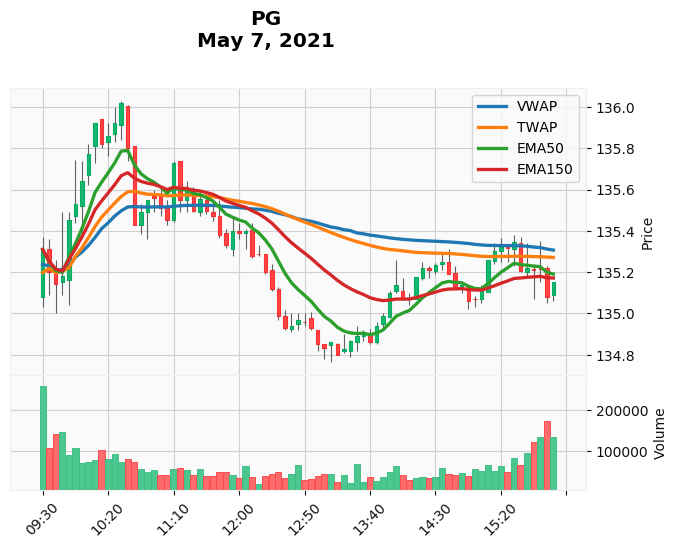

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.159 PG shares at 135.31 per share
09:45:00: Sell 6.159 PG shares at 135.18 per share
09:45:00: Open 6.159 PG short contracts at 135.18 per contract
09:55:00: Close 6.159 PG short contracts at 135.53 per contract
09:55:00: Buy 6.127 PG shares at 135.53 per share
10:45:00: Sell 6.127 PG shares at 135.49 per share
10:45:00: Open 6.127 PG short contracts at 135.49 per contract
10:55:00: Close 6.127 PG short contracts at 135.56 per contract
10:55:00: Buy 6.121 PG shares at 135.56 per share
11:05:00: Sell 6.121 PG shares at 135.4501 per share
11:05:00: Open 6.121 PG short contracts at 135.4501 per contract
11:15:00: Close 6.121 PG short contracts at 135.55 per contract
11:15:00: Buy 6.112 PG shares at 135.55 per share
11:40:00: Sell 6.112 PG shares at 135.47 per share
11:40:00: Open 6.112 PG short contracts at 135.47 per contract
16:00:00: Close 6.112 PG short contracts at 135.15 per contract
Cash: $829.89 USD
Return: 

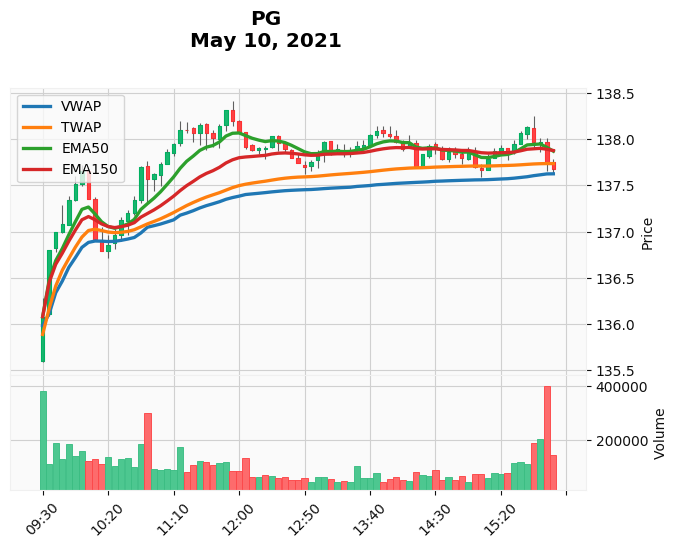

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.124 PG shares at 136.08 per share
10:20:00: Sell 6.124 PG shares at 136.855 per share
10:20:00: Open 6.124 PG short contracts at 136.855 per contract
10:30:00: Close 6.124 PG short contracts at 137.13 per contract
10:30:00: Buy 6.099 PG shares at 137.13 per share
16:00:00: Sell 6.099 PG shares at 137.68 per share
Cash: $839.75 USD
Return: 0.77%
Transactions: 6
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.124 PG short contracts at 136.08 per contract
16:00:00: Close 6.124 PG short contracts at 137.68 per contract
Cash: $823.54 USD
Return: -1.18%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
14:35:00: Buy 6.048 PG shares at 137.78 per share
15:35:00: Sell 6.048 PG shares at 138.07 per share
16:00:00: Buy 6.065 PG shares

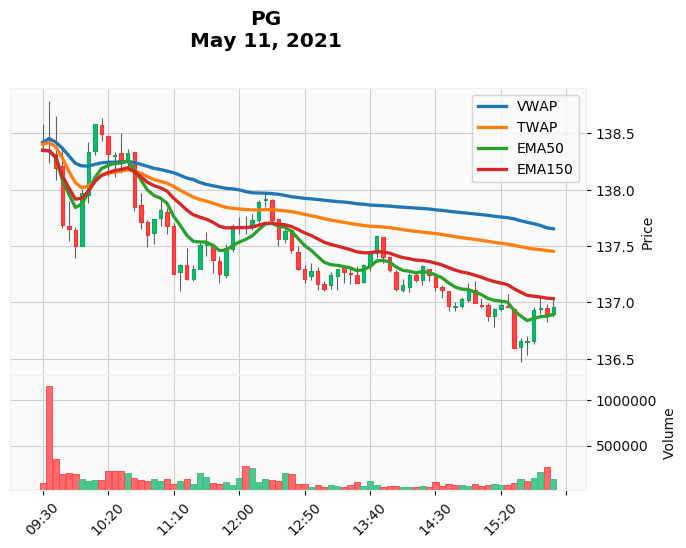

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 6.023 PG short contracts at 138.35 per contract
10:10:00: Close 6.023 PG short contracts at 138.58 per contract
10:10:00: Buy 6.003 PG shares at 138.58 per share
10:45:00: Sell 6.003 PG shares at 137.71 per share
10:45:00: Open 6.003 PG short contracts at 137.71 per contract
16:00:00: Close 6.003 PG short contracts at 136.96 per contract
Cash: $831.23 USD
Return: -0.25%
Transactions: 6
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 6.023 PG shares at 138.35 per share
16:00:00: Sell 6.023 PG shares at 136.96 per share
Cash: $824.96 USD
Return: -1.00%
Transactions: 2
----------------------------------------------------------------------
2021-05-11: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 6.061 PG shares at 137.48 per share
16:00:00: Sell 6.061 PG shares at 136.96 per share
Cash: $830.18 USD
Return: -0.3

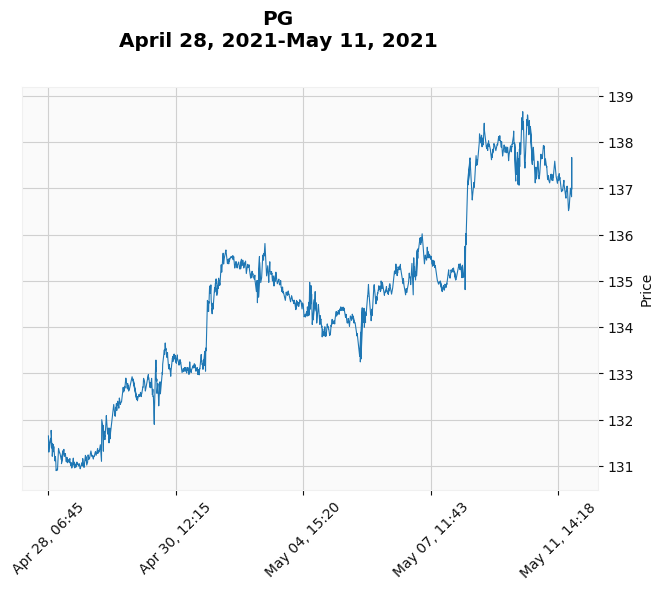

PG Returns
Strategy 1: -0.213%
Strategy 2: -0.231%
Strategy 3: -0.047%
Strategy 4: -0.498%
Market    :  0.164%
----------------------------------------------------------------------


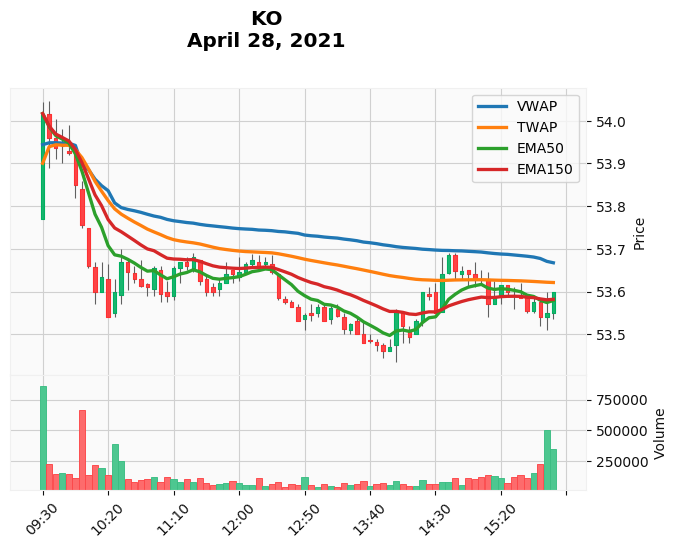

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 15.427 KO shares at 54.0168 per share
09:45:00: Sell 15.427 KO shares at 53.94 per share
09:45:00: Open 15.427 KO short contracts at 53.94 per contract
16:00:00: Close 15.427 KO short contracts at 53.6 per contract
Cash: $837.39 USD
Return: 0.49%
Transactions: 4
----------------------------------------------------------------------
2021-04-28: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 15.427 KO short contracts at 54.0168 per contract
16:00:00: Close 15.427 KO short contracts at 53.6 per contract
Cash: $839.76 USD
Return: 0.77%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 15.536 KO shares at 53.64 per share
14:35:00: Sell 15.536 KO shares at 53.64 per share
15:50:00: Buy 15.565 KO shares at 53.54 per share
16:00:00: Sell 15.565 KO shares at 53.6 per share
Cash: $834.27 USD
Return: 0.11%

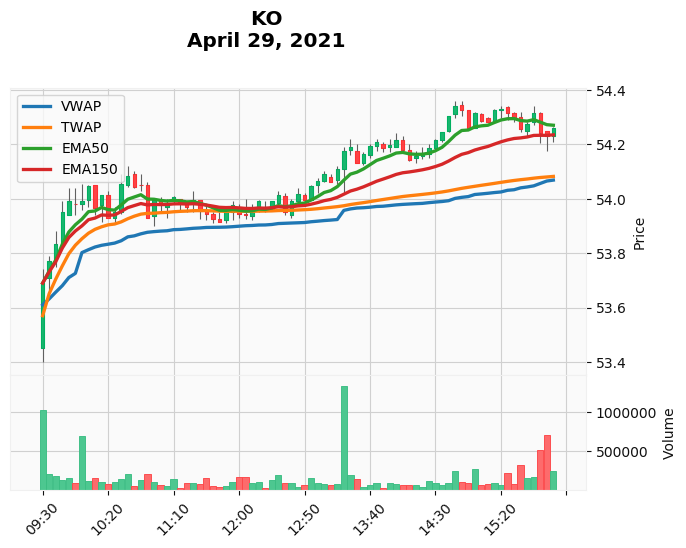

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 15.521 KO shares at 53.69 per share
16:00:00: Sell 15.521 KO shares at 54.26 per share
Cash: $842.18 USD
Return: 1.06%
Transactions: 2
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 15.521 KO short contracts at 53.69 per contract
16:00:00: Close 15.521 KO short contracts at 54.26 per contract
Cash: $824.49 USD
Return: -1.06%
Transactions: 2
----------------------------------------------------------------------
2021-04-29: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 15.445 KO shares at 53.955 per share
12:30:00: Sell 15.445 KO shares at 54.015 per share
Cash: $834.26 USD
Return: 0.11%
Transactions: 2
----------------------------------------------------------------------
2021-04-29: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Buy 15.521 KO shares at 53.69 per share
16:00:00: Sell 15.521 KO shar

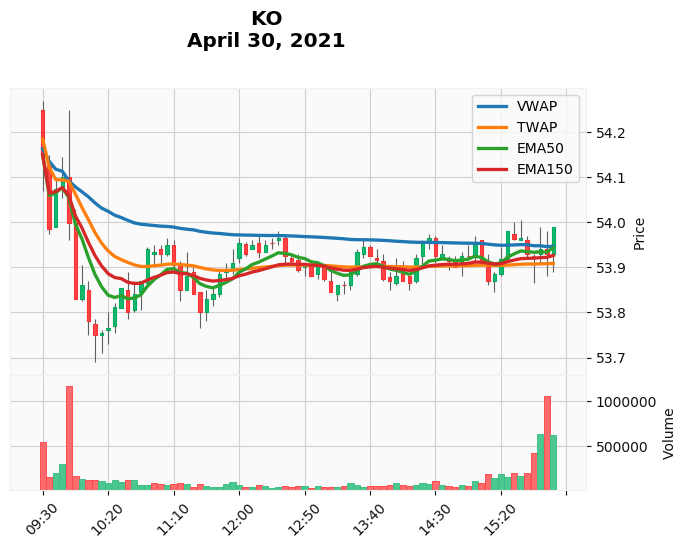

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 15.389 KO short contracts at 54.15 per contract
14:25:00: Close 15.389 KO short contracts at 53.965 per contract
14:25:00: Buy 15.495 KO shares at 53.965 per share
14:35:00: Sell 15.495 KO shares at 53.93 per share
14:35:00: Open 15.495 KO short contracts at 53.93 per contract
15:30:00: Close 15.495 KO short contracts at 53.963 per contract
15:30:00: Buy 15.476 KO shares at 53.963 per share
15:45:00: Sell 15.476 KO shares at 53.925 per share
15:45:00: Open 15.476 KO short contracts at 53.925 per contract
16:00:00: Close 15.476 KO short contracts at 53.99 per contract
Cash: $833.53 USD
Return: 0.02%
Transactions: 10
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 15.389 KO shares at 54.15 per share
16:00:00: Sell 15.389 KO shares at 53.99 per share
Cash: $830.87 USD
Return: -0.30%
Transactions: 2
-------------------------

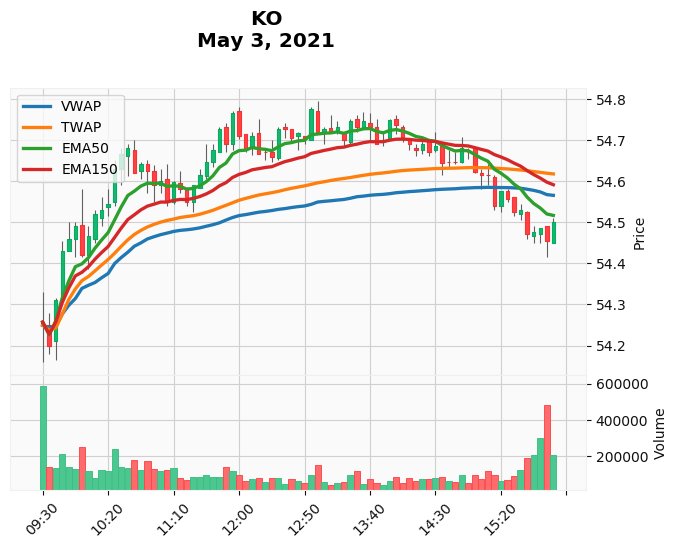

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 15.359 KO shares at 54.2573 per share
15:20:00: Sell 15.359 KO shares at 54.575 per share
15:20:00: Open 15.359 KO short contracts at 54.575 per contract
16:00:00: Close 15.359 KO short contracts at 54.5 per contract
Cash: $839.36 USD
Return: 0.72%
Transactions: 4
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 15.359 KO short contracts at 54.2573 per contract
16:00:00: Close 15.359 KO short contracts at 54.5 per contract
Cash: $829.61 USD
Return: -0.45%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
14:35:00: Buy 15.251 KO shares at 54.6429 per share
16:00:00: Sell 15.251 KO shares at 54.5 per share
Cash: $831.15 USD
Return: -0.26%
Transactions: 2
----------------------------------------------------------------------
2021-05

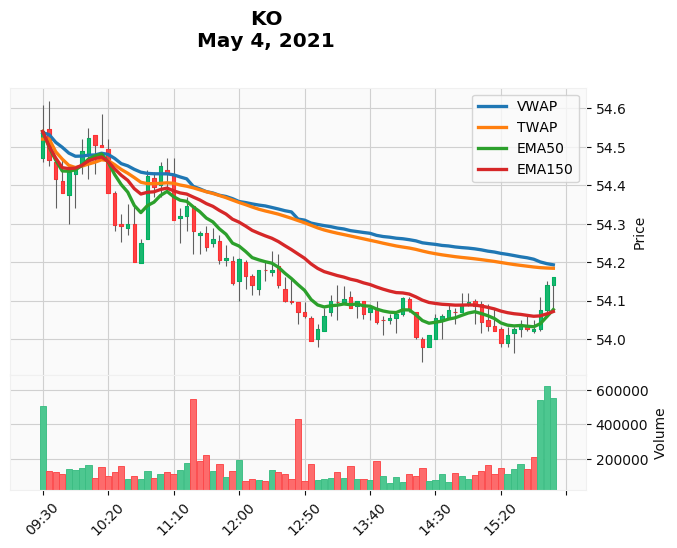

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 15.279 KO shares at 54.54 per share
09:40:00: Sell 15.279 KO shares at 54.415 per share
09:40:00: Open 15.279 KO short contracts at 54.415 per contract
10:05:00: Close 15.279 KO short contracts at 54.5239 per contract
10:05:00: Buy 15.218 KO shares at 54.5239 per share
10:25:00: Sell 15.218 KO shares at 54.2963 per share
10:25:00: Open 15.218 KO short contracts at 54.2963 per contract
11:05:00: Close 15.218 KO short contracts at 54.43 per contract
11:05:00: Buy 15.144 KO shares at 54.43 per share
11:15:00: Sell 15.144 KO shares at 54.32 per share
11:15:00: Open 15.144 KO short contracts at 54.32 per contract
16:00:00: Close 15.144 KO short contracts at 54.16 per contract
Cash: $825.02 USD
Return: -1.00%
Transactions: 12
----------------------------------------------------------------------
2021-05-04: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 15.279 KO short contracts at 54.54 per contract
16:00:

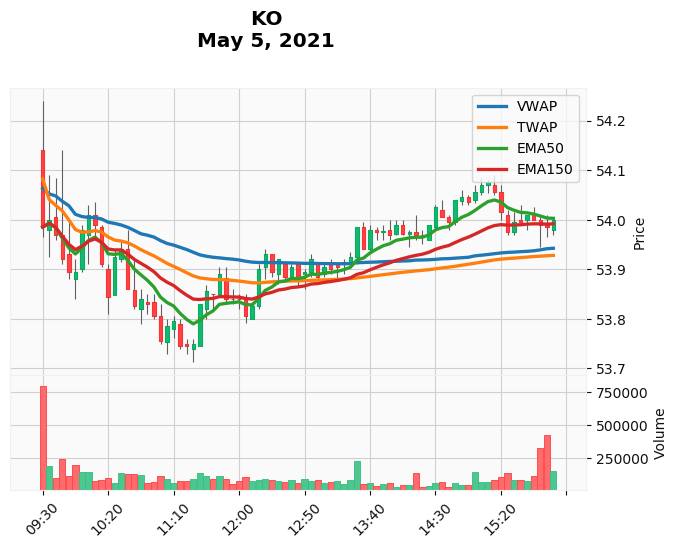

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 15.436 KO short contracts at 53.985 per contract
13:30:00: Close 15.436 KO short contracts at 53.985 per contract
13:30:00: Buy 15.436 KO shares at 53.985 per share
16:00:00: Sell 15.436 KO shares at 54.0 per share
Cash: $833.56 USD
Return: 0.03%
Transactions: 4
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 15.436 KO shares at 53.985 per share
16:00:00: Sell 15.436 KO shares at 54.0 per share
Cash: $833.56 USD
Return: 0.03%
Transactions: 2
----------------------------------------------------------------------
2021-05-05: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 15.478 KO shares at 53.84 per share
12:20:00: Sell 15.478 KO shares at 53.93 per share
Cash: $834.73 USD
Return: 0.17%
Transactions: 2
----------------------------------------------------------------------
2021-05-05: Starting VWAP + TWAP strat

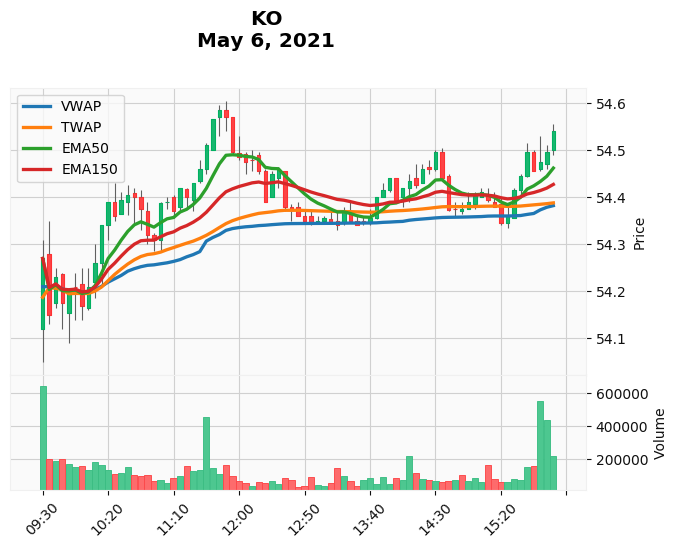

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 15.355 KO shares at 54.27 per share
09:50:00: Sell 15.355 KO shares at 54.2 per share
09:50:00: Open 15.355 KO short contracts at 54.2 per contract
09:55:00: Close 15.355 KO short contracts at 54.21 per contract
09:55:00: Buy 15.350 KO shares at 54.21 per share
15:25:00: Sell 15.350 KO shares at 54.36 per share
15:25:00: Open 15.350 KO short contracts at 54.36 per contract
15:35:00: Close 15.350 KO short contracts at 54.445 per contract
15:35:00: Buy 15.302 KO shares at 54.445 per share
16:00:00: Sell 15.302 KO shares at 54.54 per share
Cash: $834.56 USD
Return: 0.15%
Transactions: 10
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 15.355 KO short contracts at 54.27 per contract
16:00:00: Close 15.355 KO short contracts at 54.54 per contract
Cash: $829.19 USD
Return: -0.50%
Transactions: 2
-------------------------------

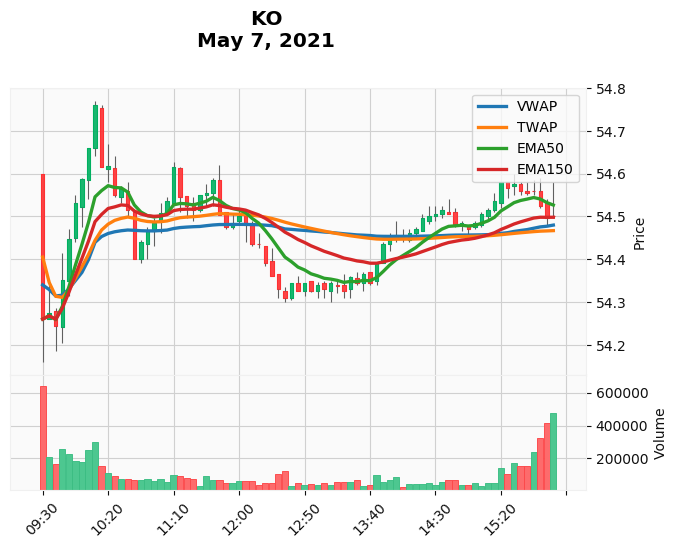

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 15.358 KO short contracts at 54.26 per contract
09:50:00: Close 15.358 KO short contracts at 54.4482 per contract
09:50:00: Buy 15.252 KO shares at 54.4482 per share
10:45:00: Sell 15.252 KO shares at 54.44 per share
10:45:00: Open 15.252 KO short contracts at 54.44 per contract
11:00:00: Close 15.252 KO short contracts at 54.5084 per contract
11:00:00: Buy 15.214 KO shares at 54.5084 per share
12:15:00: Sell 15.214 KO shares at 54.435 per share
12:15:00: Open 15.214 KO short contracts at 54.435 per contract
14:15:00: Close 15.214 KO short contracts at 54.47 per contract
14:15:00: Buy 15.194 KO shares at 54.47 per share
16:00:00: Sell 15.194 KO shares at 54.5 per share
Cash: $828.08 USD
Return: -0.63%
Transactions: 12
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 15.358 KO shares at 54.26 per share
16:00:00: Sell 15.35

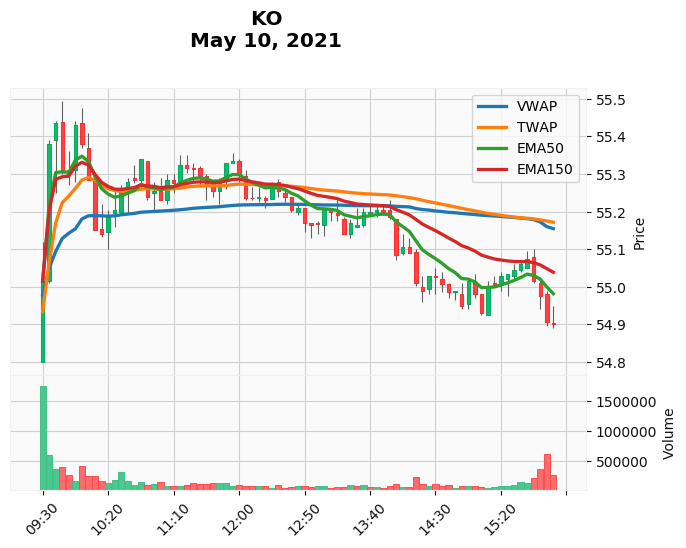

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 15.147 KO shares at 55.015 per share
10:15:00: Sell 15.147 KO shares at 55.14 per share
10:15:00: Open 15.147 KO short contracts at 55.14 per contract
10:25:00: Close 15.147 KO short contracts at 55.205 per contract
10:25:00: Buy 15.112 KO shares at 55.205 per share
12:45:00: Sell 15.112 KO shares at 55.21 per share
12:45:00: Open 15.112 KO short contracts at 55.21 per contract
16:00:00: Close 15.112 KO short contracts at 54.9 per contract
Cash: $839.00 USD
Return: 0.68%
Transactions: 8
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 15.147 KO short contracts at 55.015 per contract
16:00:00: Close 15.147 KO short contracts at 54.9 per contract
Cash: $835.08 USD
Return: 0.21%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
12:1

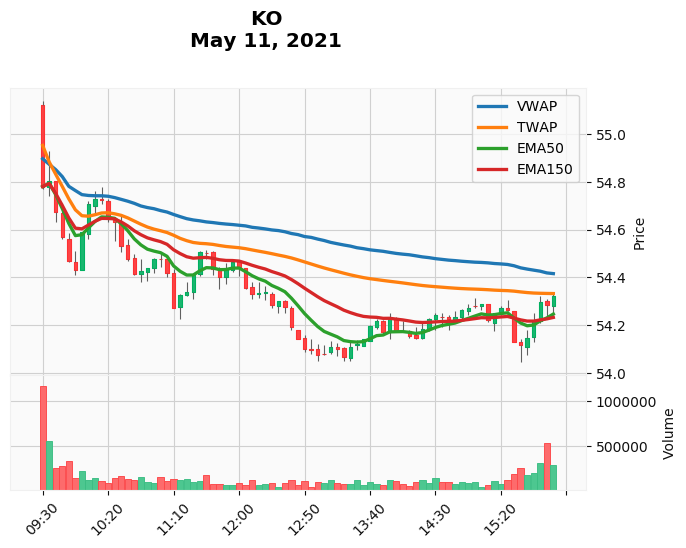

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 15.212 KO short contracts at 54.78 per contract
16:00:00: Close 15.212 KO short contracts at 54.32 per contract
Cash: $840.33 USD
Return: 0.84%
Transactions: 2
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 15.212 KO shares at 54.78 per share
16:00:00: Sell 15.212 KO shares at 54.32 per share
Cash: $826.34 USD
Return: -0.84%
Transactions: 2
----------------------------------------------------------------------
2021-05-11: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 15.309 KO shares at 54.435 per share
14:55:00: Sell 15.309 KO shares at 54.27 per share
15:35:00: Buy 15.353 KO shares at 54.115 per share
15:55:00: Sell 15.353 KO shares at 54.285 per share
Cash: $833.42 USD
Return: 0.01%
Transactions: 4
----------------------------------------------------------------------
2021-05-11: Starting VWAP + TWAP str

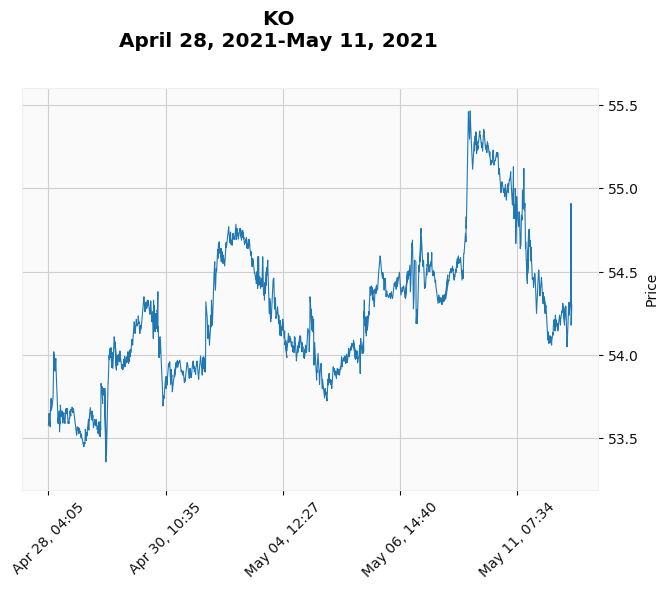

KO Returns
Strategy 1:  0.236%
Strategy 2: -0.099%
Strategy 3:  0.012%
Strategy 4:  0.228%
Market    : -0.032%
----------------------------------------------------------------------


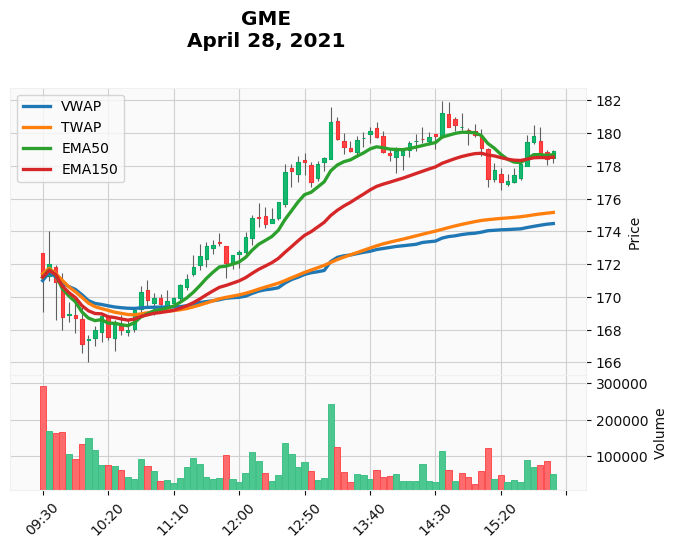

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 4.868 GME shares at 171.2 per share
09:45:00: Sell 4.868 GME shares at 168.8 per share
09:45:00: Open 4.868 GME short contracts at 168.8 per contract
10:50:00: Close 4.868 GME short contracts at 169.84 per contract
10:50:00: Buy 4.808 GME shares at 169.84 per share
16:00:00: Sell 4.808 GME shares at 178.91 per share
Cash: $860.20 USD
Return: 3.22%
Transactions: 6
----------------------------------------------------------------------
2021-04-28: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 4.868 GME short contracts at 171.2 per contract
09:45:00: Close 4.868 GME short contracts at 168.8 per contract
09:45:00: Buy 5.006 GME shares at 168.8 per share
11:25:00: Sell 5.006 GME shares at 171.81 per share
11:25:00: Open 5.006 GME short contracts at 171.81 per contract
16:00:00: Close 5.006 GME short contracts at 178.91 per contract
Cash: $824.54 USD
Return: -1.06%
Transactions: 6
--------------------------

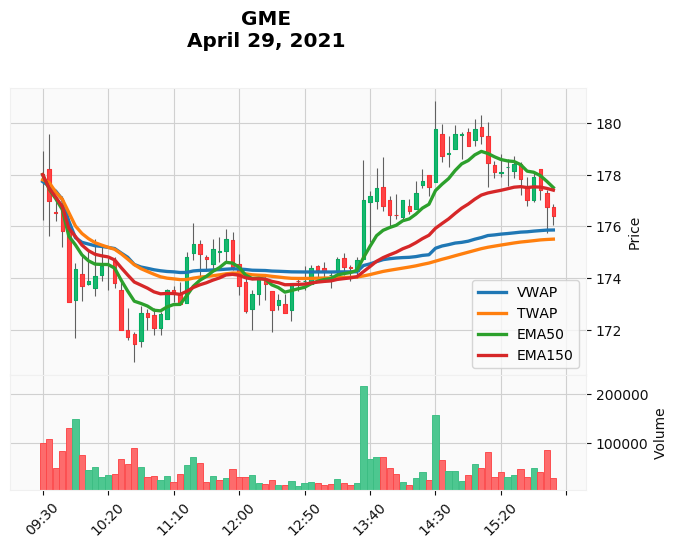

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 4.682 GME shares at 178.0 per share
09:40:00: Sell 4.682 GME shares at 176.52 per share
09:40:00: Open 4.682 GME short contracts at 176.52 per contract
11:25:00: Close 4.682 GME short contracts at 175.3 per contract
11:25:00: Buy 4.747 GME shares at 175.3 per share
12:05:00: Sell 4.747 GME shares at 172.74 per share
12:05:00: Open 4.747 GME short contracts at 172.74 per contract
13:00:00: Close 4.747 GME short contracts at 174.315 per contract
13:00:00: Buy 4.661 GME shares at 174.315 per share
13:10:00: Sell 4.661 GME shares at 174.133 per share
13:10:00: Open 4.661 GME short contracts at 174.133 per contract
13:20:00: Close 4.661 GME short contracts at 174.41 per contract
13:20:00: Buy 4.646 GME shares at 174.41 per share
16:00:00: Sell 4.646 GME shares at 176.41 per share
Cash: $819.64 USD
Return: -1.64%
Transactions: 14
----------------------------------------------------------------------
2021-04-29: Starting 

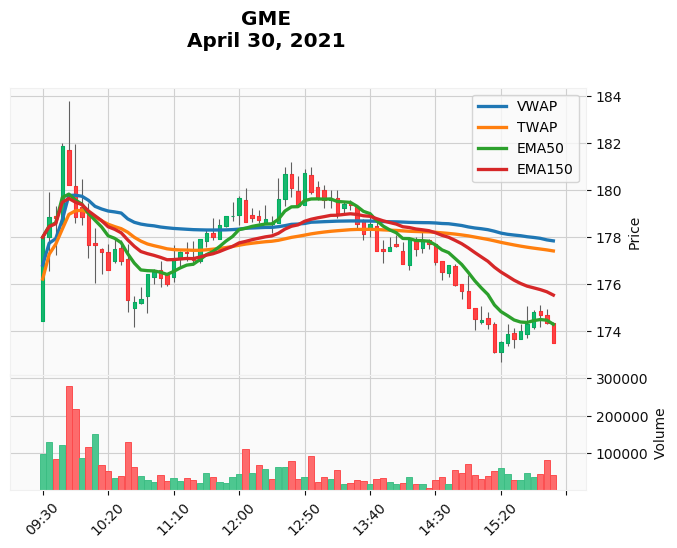

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 4.682 GME shares at 178.0 per share
10:00:00: Sell 4.682 GME shares at 178.8696 per share
10:00:00: Open 4.682 GME short contracts at 178.8696 per contract
11:50:00: Close 4.682 GME short contracts at 178.8875 per contract
11:50:00: Buy 4.681 GME shares at 178.8875 per share
13:40:00: Sell 4.681 GME shares at 178.57 per share
13:40:00: Open 4.681 GME short contracts at 178.57 per contract
16:00:00: Close 4.681 GME short contracts at 173.51 per contract
Cash: $859.52 USD
Return: 3.14%
Transactions: 8
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 4.682 GME short contracts at 178.0 per contract
10:05:00: Close 4.682 GME short contracts at 177.6655 per contract
10:05:00: Buy 4.699 GME shares at 177.6655 per share
12:35:00: Sell 4.699 GME shares at 180.6999 per share
12:35:00: Open 4.699 GME short contracts at 180.6999 per 

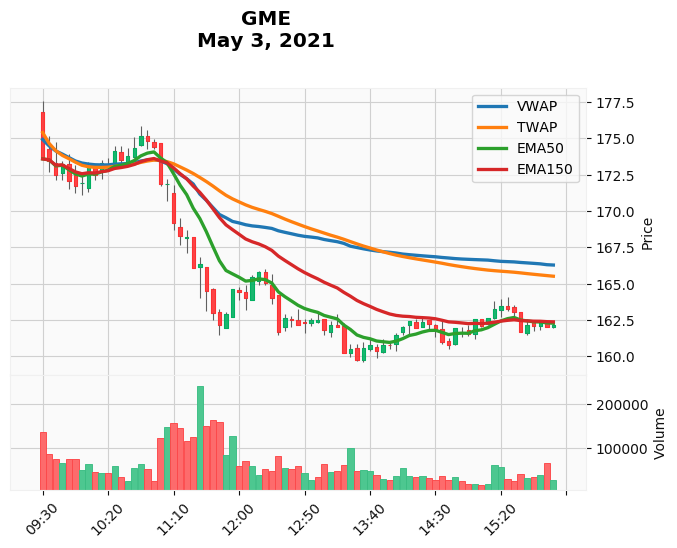

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 4.801 GME short contracts at 173.59 per contract
10:30:00: Close 4.801 GME short contracts at 173.4999 per contract
10:30:00: Buy 4.806 GME shares at 173.4999 per share
11:05:00: Sell 4.806 GME shares at 171.892 per share
11:05:00: Open 4.806 GME short contracts at 171.892 per contract
16:00:00: Close 4.806 GME short contracts at 162.19 per contract
Cash: $872.66 USD
Return: 4.72%
Transactions: 6
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 4.801 GME shares at 173.59 per share
16:00:00: Sell 4.801 GME shares at 162.19 per share
Cash: $778.61 USD
Return: -6.57%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 5.115 GME shares at 162.9047 per share
15:20:00: Sell 5.115 GME shares at 163.47 per share
15:40:00: Buy

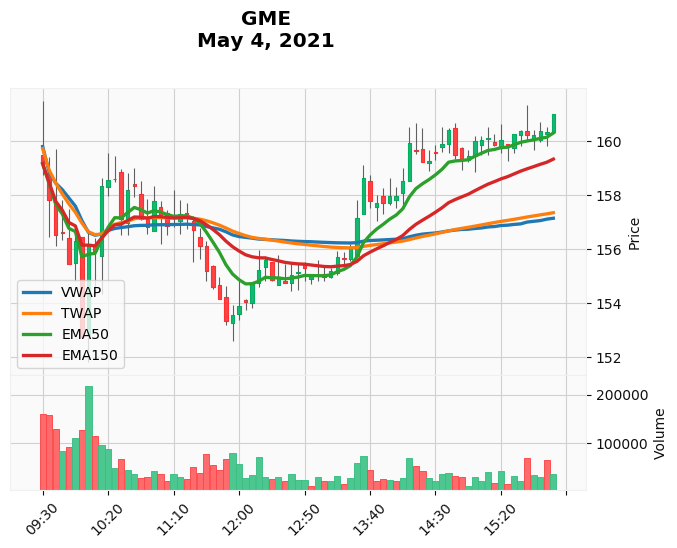

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 5.236 GME short contracts at 159.1528 per contract
10:20:00: Close 5.236 GME short contracts at 158.532 per contract
10:20:00: Buy 5.277 GME shares at 158.532 per share
11:30:00: Sell 5.277 GME shares at 156.12 per share
11:30:00: Open 5.277 GME short contracts at 156.12 per contract
13:35:00: Close 5.277 GME short contracts at 158.6197 per contract
13:35:00: Buy 5.111 GME shares at 158.6197 per share
16:00:00: Sell 5.111 GME shares at 161.0 per share
Cash: $822.83 USD
Return: -1.26%
Transactions: 8
----------------------------------------------------------------------
2021-05-04: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 5.236 GME shares at 159.1528 per share
10:15:00: Sell 5.236 GME shares at 158.3087 per share
10:15:00: Open 5.236 GME short contracts at 158.3087 per contract
11:35:00: Close 5.236 GME short contracts at 155.16 per contract
11:35:00: Buy 5.449 GME shares at 155.16 per share
13:3

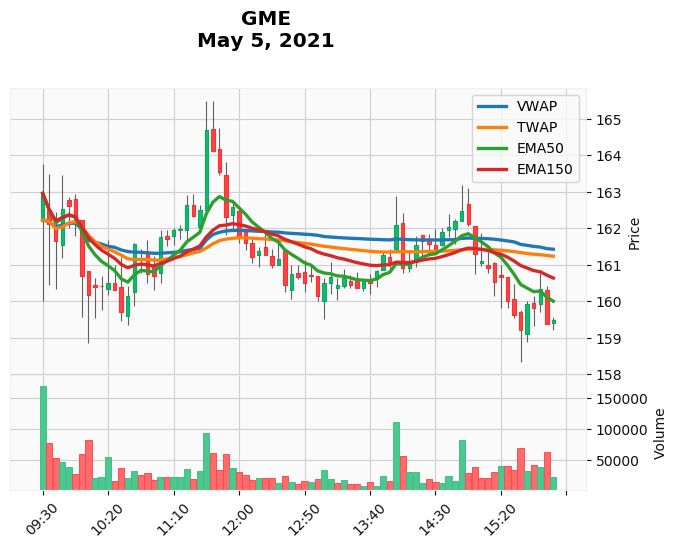

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 5.114 GME shares at 162.96 per share
09:40:00: Sell 5.114 GME shares at 161.6392 per share
09:40:00: Open 5.114 GME short contracts at 161.6392 per contract
09:50:00: Close 5.114 GME short contracts at 162.61 per contract
09:50:00: Buy 5.053 GME shares at 162.61 per share
10:05:00: Sell 5.053 GME shares at 160.17 per share
10:05:00: Open 5.053 GME short contracts at 160.17 per contract
10:45:00: Close 5.053 GME short contracts at 161.37 per contract
10:45:00: Buy 4.978 GME shares at 161.37 per share
10:55:00: Sell 4.978 GME shares at 160.69 per share
10:55:00: Open 4.978 GME short contracts at 160.69 per contract
11:05:00: Close 4.978 GME short contracts at 161.71 per contract
11:05:00: Buy 4.915 GME shares at 161.71 per share
12:05:00: Sell 4.915 GME shares at 161.59 per share
12:05:00: Open 4.915 GME short contracts at 161.59 per contract
14:40:00: Close 4.915 GME short contracts at 162.03 per contract
14:40:00: 

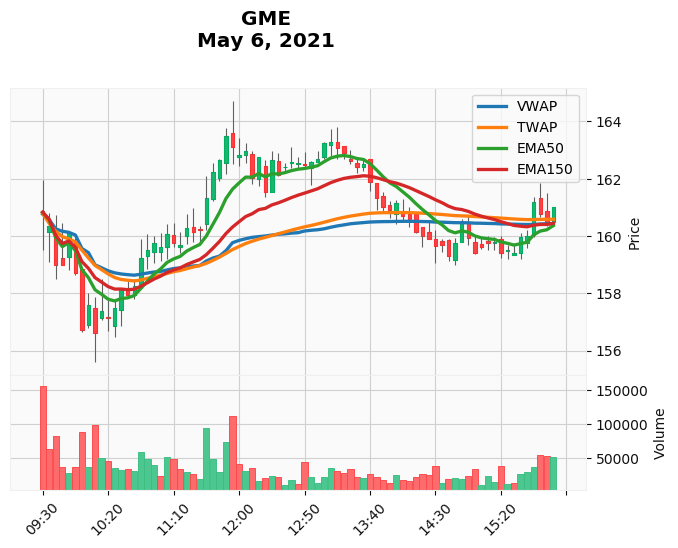

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 5.182 GME shares at 160.827 per share
09:35:00: Sell 5.182 GME shares at 160.35 per share
09:35:00: Open 5.182 GME short contracts at 160.35 per contract
10:50:00: Close 5.182 GME short contracts at 159.5 per contract
10:50:00: Buy 5.237 GME shares at 159.5 per share
14:20:00: Sell 5.237 GME shares at 160.0 per share
14:20:00: Open 5.237 GME short contracts at 160.0 per contract
15:50:00: Close 5.237 GME short contracts at 160.76 per contract
15:50:00: Buy 5.187 GME shares at 160.76 per share
16:00:00: Sell 5.187 GME shares at 161.01 per share
Cash: $835.20 USD
Return: 0.22%
Transactions: 10
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 5.182 GME short contracts at 160.827 per contract
10:00:00: Close 5.182 GME short contracts at 156.7192 per contract
10:00:00: Buy 5.453 GME shares at 156.7192 per share
11:35:00: Sell 

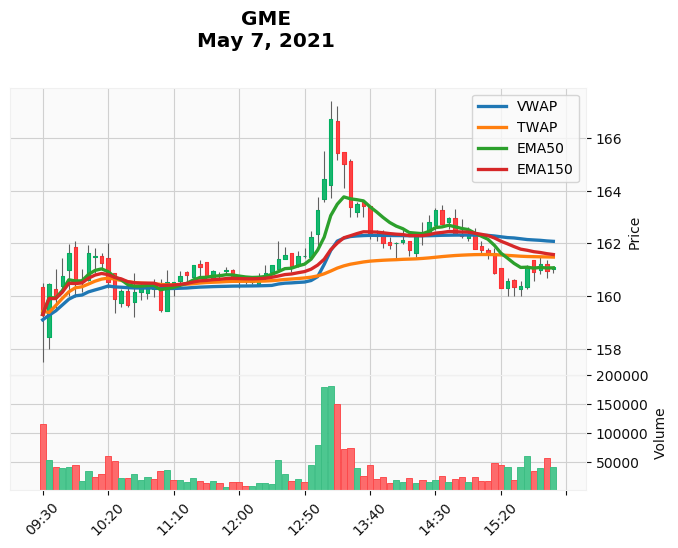

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 5.231 GME shares at 159.3 per share
10:30:00: Sell 5.231 GME shares at 160.21 per share
10:30:00: Open 5.231 GME short contracts at 160.21 per contract
11:10:00: Close 5.231 GME short contracts at 160.52 per contract
11:10:00: Buy 5.211 GME shares at 160.52 per share
13:55:00: Sell 5.211 GME shares at 161.94 per share
13:55:00: Open 5.211 GME short contracts at 161.94 per contract
14:25:00: Close 5.211 GME short contracts at 162.825 per contract
14:25:00: Buy 5.154 GME shares at 162.825 per share
15:05:00: Sell 5.154 GME shares at 161.7414 per share
15:05:00: Open 5.154 GME short contracts at 161.7414 per contract
16:00:00: Close 5.154 GME short contracts at 161.1 per contract
Cash: $836.98 USD
Return: 0.44%
Transactions: 12
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 5.231 GME short contracts at 159.3 per contract
1

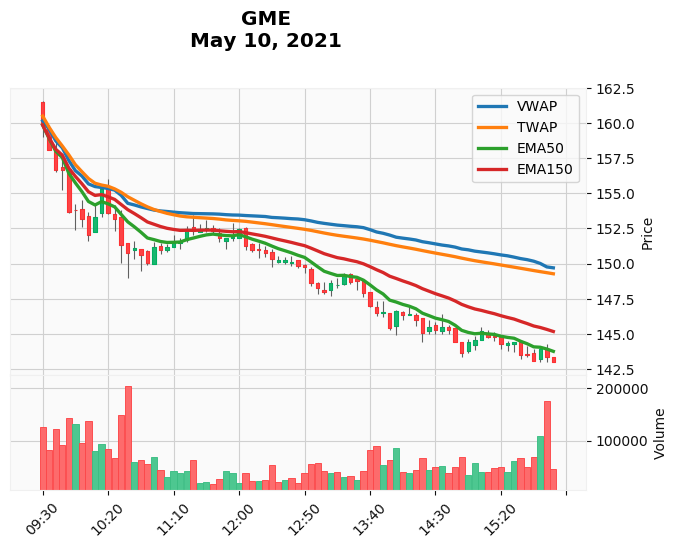

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 5.213 GME short contracts at 159.85 per contract
16:00:00: Close 5.213 GME short contracts at 143.01 per contract
Cash: $921.12 USD
Return: 10.53%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 5.213 GME shares at 159.85 per share
16:00:00: Sell 5.213 GME shares at 143.01 per share
Cash: $745.54 USD
Return: -10.53%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 5.490 GME shares at 151.8 per share
16:00:00: Sell 5.490 GME shares at 143.01 per share
Cash: $785.08 USD
Return: -5.79%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Open 5.213 GME short contracts at 159.85 per contract
16:00:00:

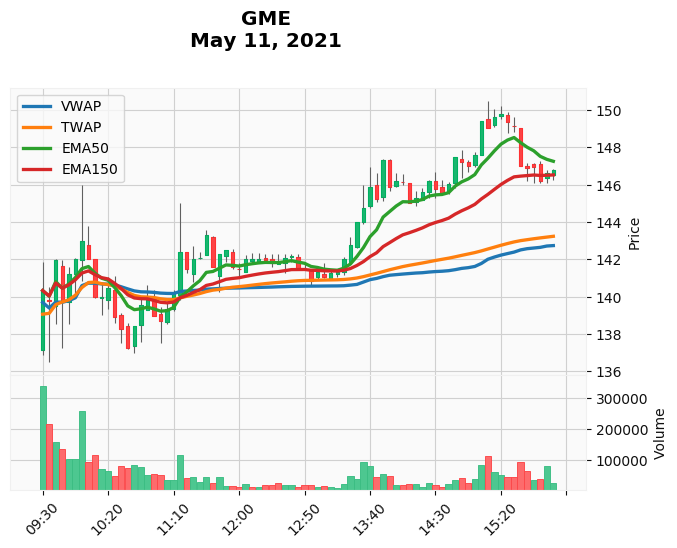

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 5.938 GME shares at 140.33 per share
10:15:00: Sell 5.938 GME shares at 139.981 per share
10:15:00: Open 5.938 GME short contracts at 139.981 per contract
11:20:00: Close 5.938 GME short contracts at 141.473 per contract
11:20:00: Buy 5.813 GME shares at 141.473 per share
16:00:00: Sell 5.813 GME shares at 146.78 per share
Cash: $853.25 USD
Return: 2.39%
Transactions: 6
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 5.938 GME short contracts at 140.33 per contract
10:25:00: Close 5.938 GME short contracts at 138.9358 per contract
10:25:00: Buy 6.058 GME shares at 138.9358 per share
11:15:00: Sell 6.058 GME shares at 142.42 per share
11:15:00: Open 6.058 GME short contracts at 142.42 per contract
16:00:00: Close 6.058 GME short contracts at 146.78 per contract
Cash: $836.31 USD
Return: 0.36%
Transactions: 6
-------------

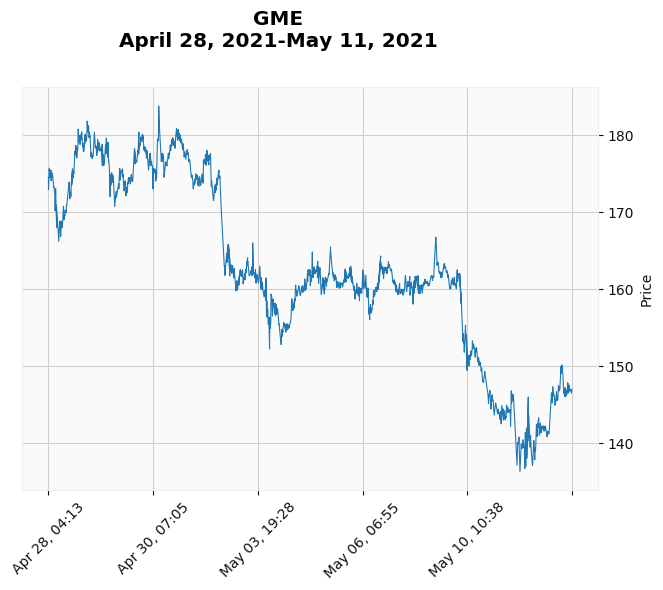

GME Returns
Strategy 1:  1.720%
Strategy 2:  0.525%
Strategy 3: -0.429%
Strategy 4:  1.105%
Market    : -1.074%
----------------------------------------------------------------------


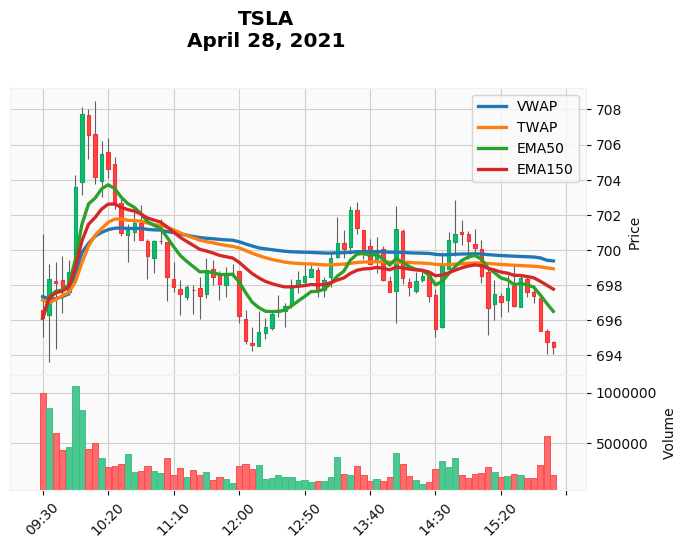

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 1.197 TSLA short contracts at 696.0974 per contract
09:40:00: Close 1.197 TSLA short contracts at 698.1001 per contract
09:40:00: Buy 1.190 TSLA shares at 698.1001 per share
10:35:00: Sell 1.190 TSLA shares at 701.14 per share
10:35:00: Open 1.190 TSLA short contracts at 701.14 per contract
13:20:00: Close 1.190 TSLA short contracts at 700.034 per contract
13:20:00: Buy 1.194 TSLA shares at 700.034 per share
13:55:00: Sell 1.194 TSLA shares at 697.58 per share
13:55:00: Open 1.194 TSLA short contracts at 697.58 per contract
14:45:00: Close 1.194 TSLA short contracts at 700.9164 per contract
14:45:00: Buy 1.183 TSLA shares at 700.9164 per share
15:10:00: Sell 1.183 TSLA shares at 696.695 per share
15:10:00: Open 1.183 TSLA short contracts at 696.695 per contract
16:00:00: Close 1.183 TSLA short contracts at 694.46 per contract
Cash: $826.61 USD
Return: -0.81%
Transactions: 14
---------------------------------------

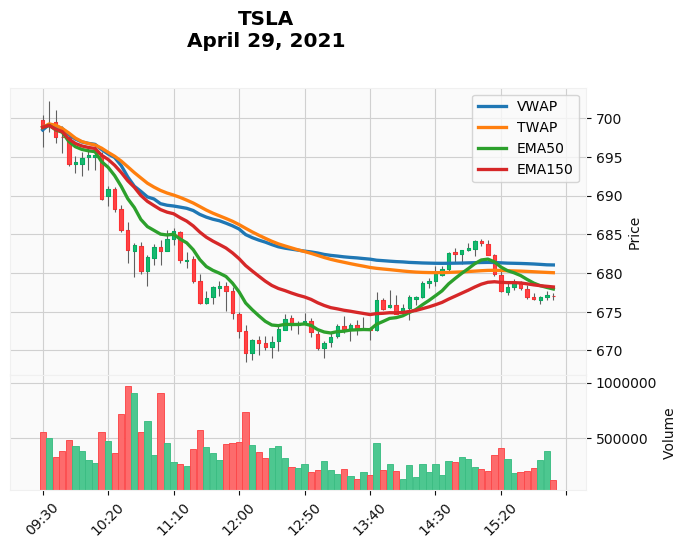

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 1.193 TSLA shares at 698.8046 per share
09:45:00: Sell 1.193 TSLA shares at 697.53 per share
09:45:00: Open 1.193 TSLA short contracts at 697.53 per contract
14:45:00: Close 1.193 TSLA short contracts at 682.4401 per contract
14:45:00: Buy 1.245 TSLA shares at 682.4401 per share
15:20:00: Sell 1.245 TSLA shares at 677.6895 per share
15:20:00: Open 1.245 TSLA short contracts at 677.6895 per contract
16:00:00: Close 1.245 TSLA short contracts at 677.0 per contract
Cash: $844.75 USD
Return: 1.37%
Transactions: 8
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 1.193 TSLA short contracts at 698.8046 per contract
10:30:00: Close 1.193 TSLA short contracts at 685.5576 per contract
10:30:00: Buy 1.239 TSLA shares at 685.5576 per share
16:00:00: Sell 1.239 TSLA shares at 677.0 per share
Cash: $838.53 USD
Return: 0.62%
Transaction

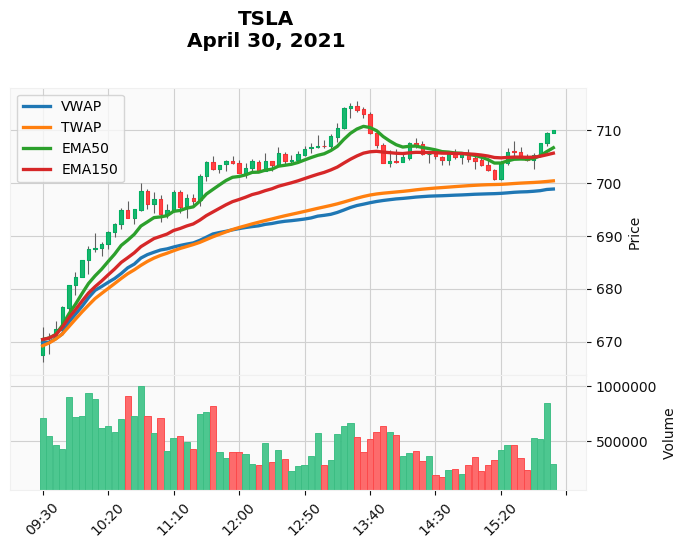

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 1.243 TSLA shares at 670.39 per share
16:00:00: Sell 1.243 TSLA shares at 709.84 per share
Cash: $882.37 USD
Return: 5.88%
Transactions: 2
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 1.243 TSLA short contracts at 670.39 per contract
16:00:00: Close 1.243 TSLA short contracts at 709.84 per contract
Cash: $784.29 USD
Return: -5.88%
Transactions: 2
----------------------------------------------------------------------
2021-04-30: Starting EMA Cross strategy with $833.33 USD
14:55:00: Buy 1.183 TSLA shares at 704.52 per share
15:50:00: Sell 1.183 TSLA shares at 707.43 per share
Cash: $836.78 USD
Return: 0.41%
Transactions: 2
----------------------------------------------------------------------
2021-04-30: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Buy 1.243 TSLA shares at 670.39 per share
16:00:00: Sell 1.

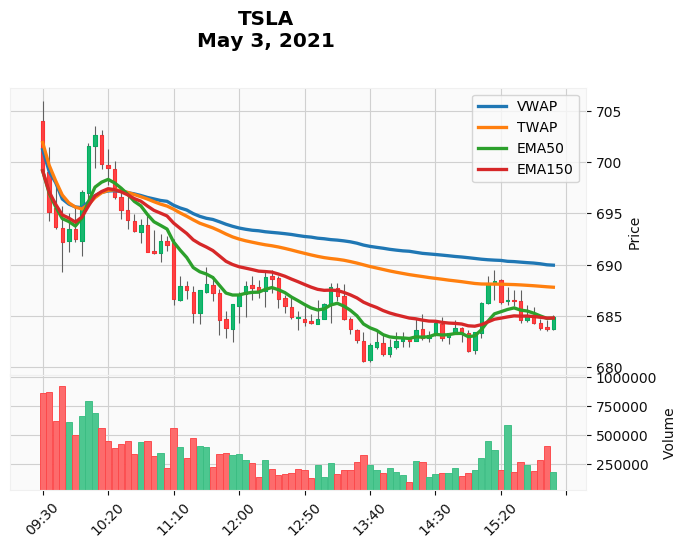

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 1.192 TSLA short contracts at 699.16 per contract
10:05:00: Close 1.192 TSLA short contracts at 701.5678 per contract
10:05:00: Buy 1.184 TSLA shares at 701.5678 per share
10:30:00: Sell 1.184 TSLA shares at 695.3616 per share
10:30:00: Open 1.184 TSLA short contracts at 695.3616 per contract
16:00:00: Close 1.184 TSLA short contracts at 684.8748 per contract
Cash: $835.53 USD
Return: 0.26%
Transactions: 6
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 1.192 TSLA shares at 699.16 per share
16:00:00: Sell 1.192 TSLA shares at 684.8748 per share
Cash: $816.31 USD
Return: -2.04%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 1.219 TSLA shares at 683.8618 per share
15:10:00: Sell 1.219 TSLA shares at 688.2467 per s

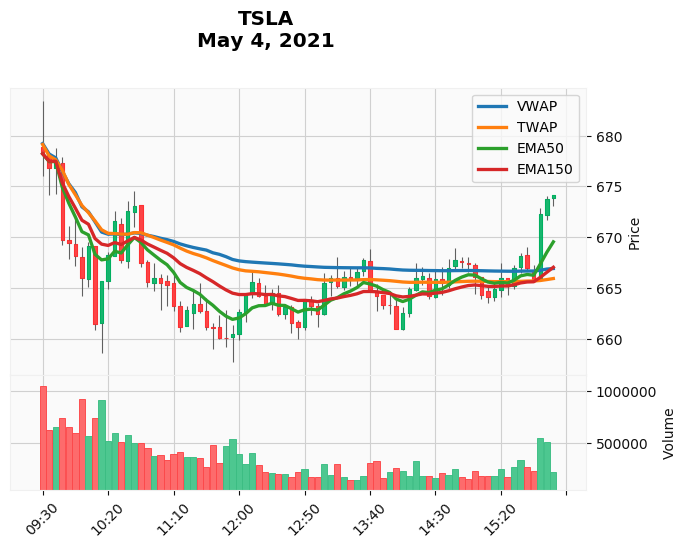

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 1.229 TSLA short contracts at 678.21 per contract
10:40:00: Close 1.229 TSLA short contracts at 673.03 per contract
10:40:00: Buy 1.248 TSLA shares at 673.03 per share
10:50:00: Sell 1.248 TSLA shares at 665.58 per share
10:50:00: Open 1.248 TSLA short contracts at 665.58 per contract
14:45:00: Close 1.248 TSLA short contracts at 667.78 per contract
14:45:00: Buy 1.239 TSLA shares at 667.78 per share
15:05:00: Sell 1.239 TSLA shares at 664.31 per share
15:05:00: Open 1.239 TSLA short contracts at 664.31 per contract
15:35:00: Close 1.239 TSLA short contracts at 668.1339 per contract
15:35:00: Buy 1.225 TSLA shares at 668.1339 per share
16:00:00: Sell 1.225 TSLA shares at 674.18 per share
Cash: $826.03 USD
Return: -0.88%
Transactions: 12
----------------------------------------------------------------------
2021-05-04: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 1.229 TSLA shares at 678.21 per share

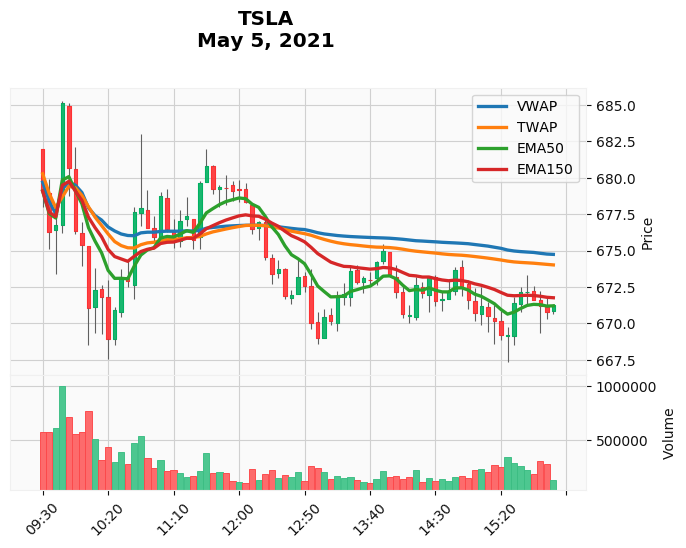

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 1.227 TSLA short contracts at 679.0862 per contract
09:50:00: Close 1.227 TSLA short contracts at 680.67 per contract
09:50:00: Buy 1.221 TSLA shares at 680.67 per share
10:00:00: Sell 1.221 TSLA shares at 675.3799 per share
10:00:00: Open 1.221 TSLA short contracts at 675.3799 per contract
10:45:00: Close 1.221 TSLA short contracts at 677.9 per contract
10:45:00: Buy 1.212 TSLA shares at 677.9 per share
12:25:00: Sell 1.212 TSLA shares at 673.4019 per share
12:25:00: Open 1.212 TSLA short contracts at 673.4019 per contract
16:00:00: Close 1.212 TSLA short contracts at 671.28 per contract
Cash: $818.97 USD
Return: -1.72%
Transactions: 10
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 1.227 TSLA shares at 679.0862 per share
16:00:00: Sell 1.227 TSLA shares at 671.28 per share
Cash: $823.75 USD
Return: -1.15%
Transactions

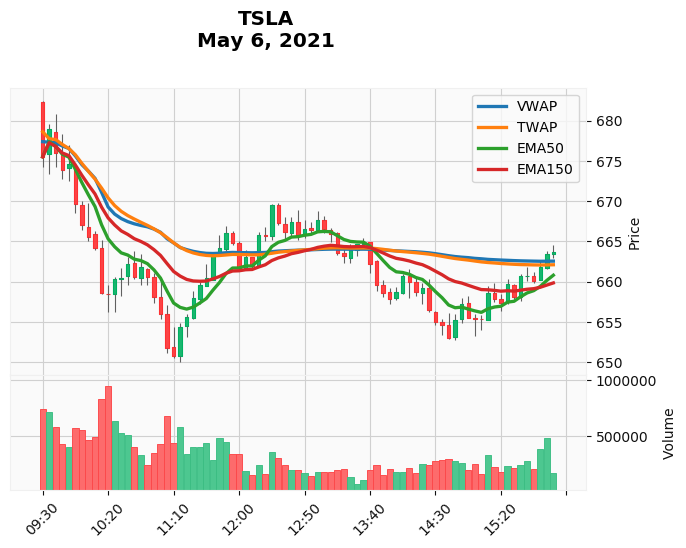

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 1.234 TSLA short contracts at 675.48 per contract
11:45:00: Close 1.234 TSLA short contracts at 664.1301 per contract
11:45:00: Buy 1.276 TSLA shares at 664.1301 per share
12:05:00: Sell 1.276 TSLA shares at 663.0844 per share
12:05:00: Open 1.276 TSLA short contracts at 663.0844 per contract
12:20:00: Close 1.276 TSLA short contracts at 665.64 per contract
12:20:00: Buy 1.266 TSLA shares at 665.64 per share
13:20:00: Sell 1.266 TSLA shares at 663.1229 per share
13:20:00: Open 1.266 TSLA short contracts at 663.1229 per contract
13:35:00: Close 1.266 TSLA short contracts at 664.7742 per contract
13:35:00: Buy 1.260 TSLA shares at 664.7742 per share
13:45:00: Sell 1.260 TSLA shares at 659.55 per share
13:45:00: Open 1.260 TSLA short contracts at 659.55 per contract
16:00:00: Close 1.260 TSLA short contracts at 663.7 per contract
16:00:00: Buy 1.244 TSLA shares at 663.7 per share
16:00:00: Sell 1.244 TSLA shares at 6

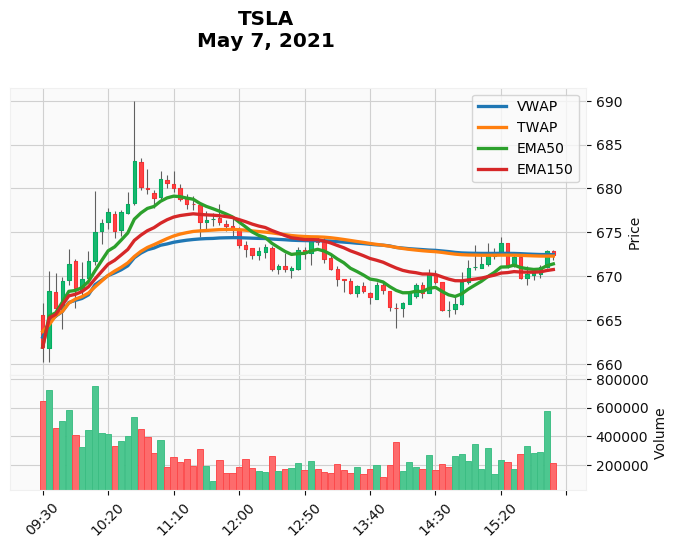

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 1.259 TSLA short contracts at 661.9052 per contract
09:40:00: Close 1.259 TSLA short contracts at 666.3934 per contract
09:40:00: Buy 1.242 TSLA shares at 666.3934 per share
12:05:00: Sell 1.242 TSLA shares at 673.1462 per share
12:05:00: Open 1.242 TSLA short contracts at 673.1462 per contract
16:00:00: Close 1.242 TSLA short contracts at 672.36 per contract
Cash: $837.05 USD
Return: 0.45%
Transactions: 6
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 1.259 TSLA shares at 661.9052 per share
10:20:00: Sell 1.259 TSLA shares at 677.27 per share
10:20:00: Open 1.259 TSLA short contracts at 677.27 per contract
13:55:00: Close 1.259 TSLA short contracts at 666.47 per contract
13:55:00: Buy 1.300 TSLA shares at 666.47 per share
16:00:00: Sell 1.300 TSLA shares at 672.36 per share
Cash: $873.93 USD
Return: 4.87%
Transactions:

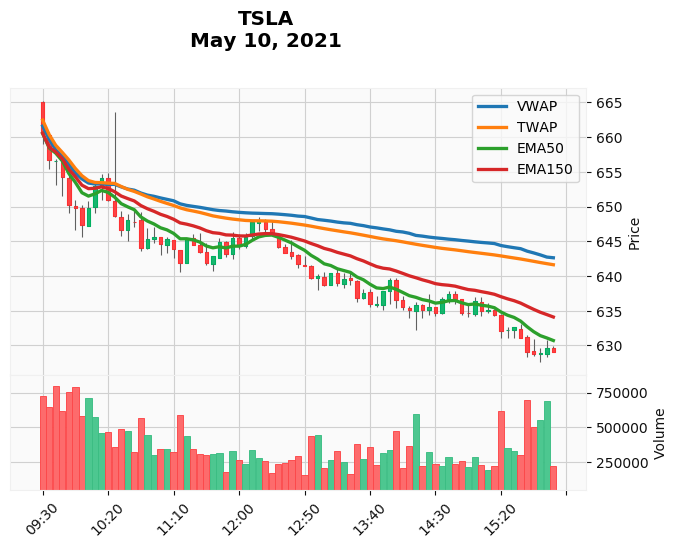

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 1.262 TSLA short contracts at 660.53 per contract
16:00:00: Close 1.262 TSLA short contracts at 629.04 per contract
Cash: $873.06 USD
Return: 4.77%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 1.262 TSLA shares at 660.53 per share
16:00:00: Sell 1.262 TSLA shares at 629.04 per share
Cash: $793.61 USD
Return: -4.77%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 1.296 TSLA shares at 643.1792 per share
16:00:00: Sell 1.296 TSLA shares at 629.04 per share
Cash: $815.01 USD
Return: -2.20%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Open 1.262 TSLA short contracts at 660.53 per contract
1

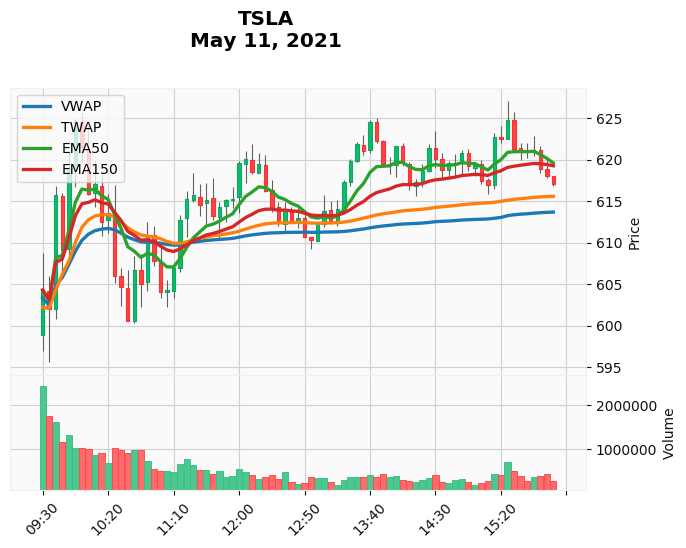

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 1.379 TSLA shares at 604.2847 per share
10:30:00: Sell 1.379 TSLA shares at 604.6842 per share
10:30:00: Open 1.379 TSLA short contracts at 604.6842 per contract
11:20:00: Close 1.379 TSLA short contracts at 615.225 per contract
11:20:00: Buy 1.332 TSLA shares at 615.225 per share
12:55:00: Sell 1.332 TSLA shares at 610.25 per share
12:55:00: Open 1.332 TSLA short contracts at 610.25 per contract
13:05:00: Close 1.332 TSLA short contracts at 613.849 per contract
13:05:00: Buy 1.316 TSLA shares at 613.849 per share
16:00:00: Sell 1.316 TSLA shares at 617.04 per share
Cash: $812.13 USD
Return: -2.54%
Transactions: 10
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 1.379 TSLA short contracts at 604.2847 per contract
10:30:00: Close 1.379 TSLA short contracts at 604.6842 per contract
10:30:00: Buy 1.377 TSLA shares at 604.68

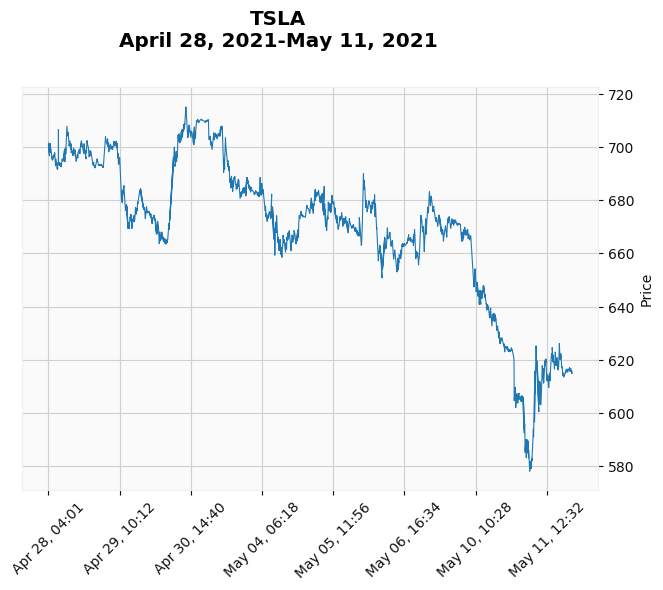

TSLA Returns
Strategy 1:  0.586%
Strategy 2: -0.442%
Strategy 3:  0.147%
Strategy 4:  0.889%
Market    : -0.628%
----------------------------------------------------------------------


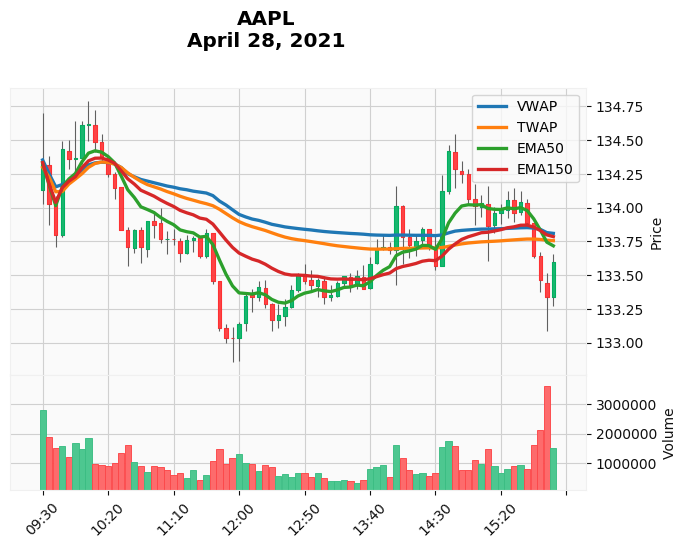

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 6.203 AAPL short contracts at 134.333 per contract
09:50:00: Close 6.203 AAPL short contracts at 134.358 per contract
09:50:00: Buy 6.201 AAPL shares at 134.358 per share
10:25:00: Sell 6.201 AAPL shares at 134.1434 per share
10:25:00: Open 6.201 AAPL short contracts at 134.1434 per contract
14:40:00: Close 6.201 AAPL short contracts at 134.4179 per contract
14:40:00: Buy 6.176 AAPL shares at 134.4179 per share
15:50:00: Sell 6.176 AAPL shares at 133.4645 per share
15:50:00: Open 6.176 AAPL short contracts at 133.4645 per contract
16:00:00: Close 6.176 AAPL short contracts at 133.5943 per contract
Cash: $823.46 USD
Return: -1.19%
Transactions: 10
----------------------------------------------------------------------
2021-04-28: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 6.203 AAPL shares at 134.333 per share
16:00:00: Sell 6.203 AAPL shares at 133.5943 per share
Cash: $828.75 USD
Return: -0.55%
Tr

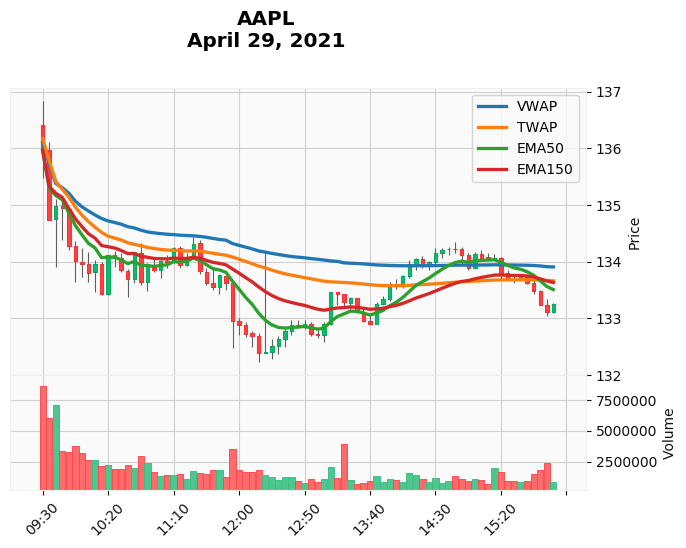

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 6.129 AAPL short contracts at 135.9603 per contract
14:15:00: Close 6.129 AAPL short contracts at 134.0485 per contract
14:15:00: Buy 6.304 AAPL shares at 134.0485 per share
15:25:00: Sell 6.304 AAPL shares at 133.6941 per share
15:25:00: Open 6.304 AAPL short contracts at 133.6941 per contract
16:00:00: Close 6.304 AAPL short contracts at 133.2549 per contract
Cash: $845.59 USD
Return: 1.47%
Transactions: 6
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 6.129 AAPL shares at 135.9603 per share
16:00:00: Sell 6.129 AAPL shares at 133.2549 per share
Cash: $816.75 USD
Return: -1.99%
Transactions: 2
----------------------------------------------------------------------
2021-04-29: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 6.236 AAPL shares at 133.6241 per share
13:55:00: Sell 6.236 AAPL shares at 133.5843 p

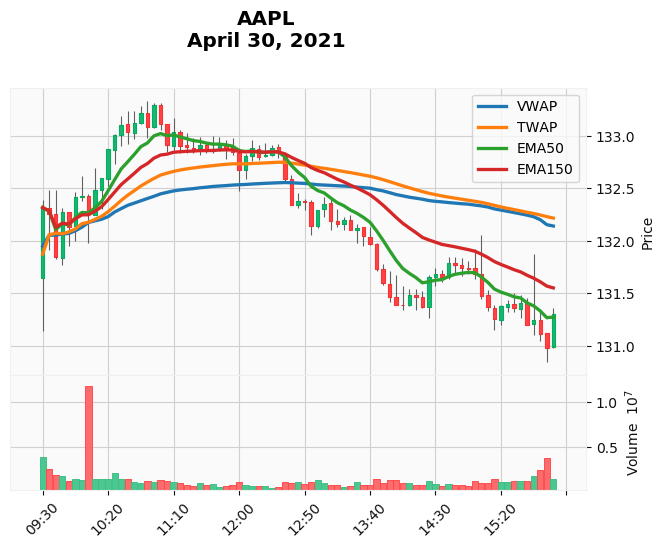

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.298 AAPL shares at 132.3164 per share
12:45:00: Sell 6.298 AAPL shares at 132.3763 per share
12:45:00: Open 6.298 AAPL short contracts at 132.3763 per contract
16:00:00: Close 6.298 AAPL short contracts at 131.2982 per contract
Cash: $840.50 USD
Return: 0.86%
Transactions: 4
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.298 AAPL short contracts at 132.3164 per contract
16:00:00: Close 6.298 AAPL short contracts at 131.2982 per contract
Cash: $839.75 USD
Return: 0.77%
Transactions: 2
----------------------------------------------------------------------
2021-04-30: Starting EMA Cross strategy with $833.33 USD
12:15:00: Buy 6.275 AAPL shares at 132.7955 per share
12:25:00: Sell 6.275 AAPL shares at 132.8855 per share
12:35:00: Buy 6.289 AAPL shares at 132.586 per share
16:00:00: Sell 6.289 AAPL shares at 131.2982 per

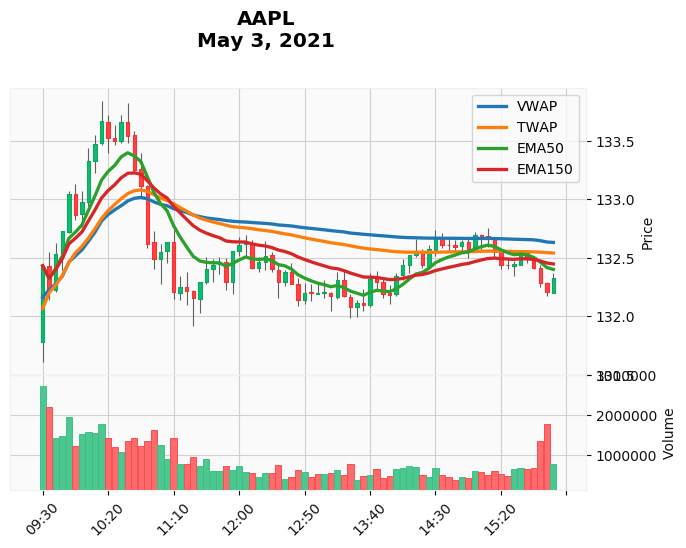

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.293 AAPL shares at 132.4312 per share
10:55:00: Sell 6.293 AAPL shares at 132.4862 per share
10:55:00: Open 6.293 AAPL short contracts at 132.4862 per contract
15:05:00: Close 6.293 AAPL short contracts at 132.6858 per contract
15:05:00: Buy 6.274 AAPL shares at 132.6858 per share
15:20:00: Sell 6.274 AAPL shares at 132.4362 per share
15:20:00: Open 6.274 AAPL short contracts at 132.4362 per contract
16:00:00: Close 6.274 AAPL short contracts at 132.3264 per contract
Cash: $831.55 USD
Return: -0.21%
Transactions: 8
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.293 AAPL short contracts at 132.4312 per contract
16:00:00: Close 6.293 AAPL short contracts at 132.3264 per contract
Cash: $833.99 USD
Return: 0.08%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting E

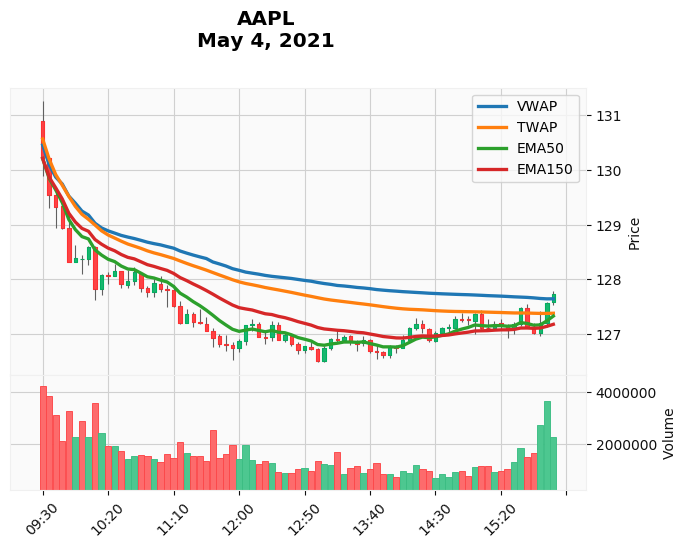

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 6.400 AAPL short contracts at 130.21 per contract
16:00:00: Close 6.400 AAPL short contracts at 127.7242 per contract
Cash: $849.24 USD
Return: 1.91%
Transactions: 2
----------------------------------------------------------------------
2021-05-04: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 6.400 AAPL shares at 130.21 per share
16:00:00: Sell 6.400 AAPL shares at 127.7242 per share
Cash: $817.42 USD
Return: -1.91%
Transactions: 2
----------------------------------------------------------------------
2021-05-04: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 6.572 AAPL shares at 126.7958 per share
14:35:00: Sell 6.572 AAPL shares at 127.1003 per share
Cash: $835.33 USD
Return: 0.24%
Transactions: 2
----------------------------------------------------------------------
2021-05-04: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Open 6.400 AAPL short contracts at 130.21 per contr

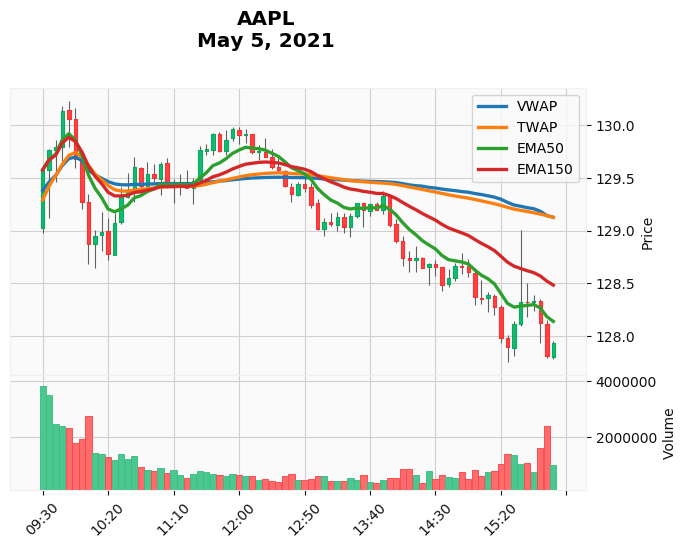

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 6.431 AAPL shares at 129.5741 per share
10:05:00: Sell 6.431 AAPL shares at 128.8757 per share
10:05:00: Open 6.431 AAPL short contracts at 128.8757 per contract
10:55:00: Close 6.431 AAPL short contracts at 129.4995 per contract
10:55:00: Buy 6.369 AAPL shares at 129.4995 per share
11:10:00: Sell 6.369 AAPL shares at 129.4213 per share
11:10:00: Open 6.369 AAPL short contracts at 129.4213 per contract
11:30:00: Close 6.369 AAPL short contracts at 129.7607 per contract
11:30:00: Buy 6.336 AAPL shares at 129.7607 per share
12:40:00: Sell 6.336 AAPL shares at 129.3415 per share
12:40:00: Open 6.336 AAPL short contracts at 129.3415 per contract
16:00:00: Close 6.336 AAPL short contracts at 127.9338 per contract
Cash: $828.43 USD
Return: -0.59%
Transactions: 12
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 6.431 AAPL short

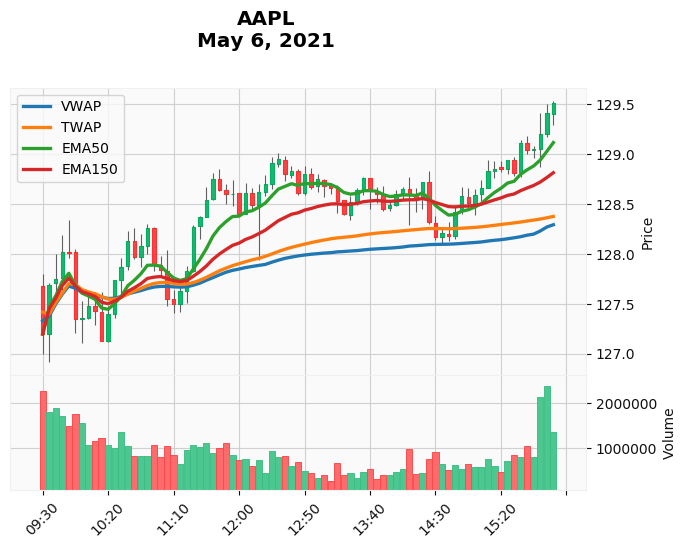

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 6.552 AAPL short contracts at 127.1951 per contract
09:40:00: Close 6.552 AAPL short contracts at 127.7442 per contract
09:40:00: Buy 6.495 AAPL shares at 127.7442 per share
10:00:00: Sell 6.495 AAPL shares at 127.3548 per share
10:00:00: Open 6.495 AAPL short contracts at 127.3548 per contract
10:30:00: Close 6.495 AAPL short contracts at 127.864 per contract
10:30:00: Buy 6.444 AAPL shares at 127.864 per share
11:10:00: Sell 6.444 AAPL shares at 127.4996 per share
11:10:00: Open 6.444 AAPL short contracts at 127.4996 per contract
11:25:00: Close 6.444 AAPL short contracts at 128.2683 per contract
11:25:00: Buy 6.366 AAPL shares at 128.2683 per share
16:00:00: Sell 6.366 AAPL shares at 129.5112 per share
Cash: $824.51 USD
Return: -1.06%
Transactions: 12
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 6.552 AAPL shares a

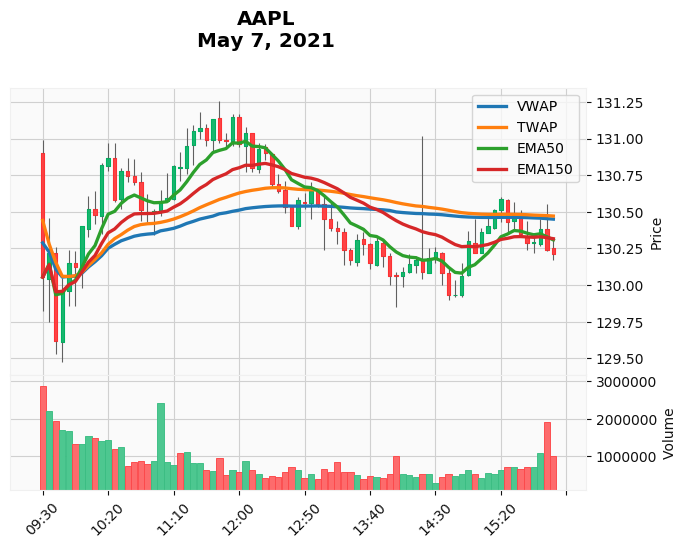

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 6.408 AAPL short contracts at 130.0535 per contract
09:55:00: Close 6.408 AAPL short contracts at 130.12 per contract
09:55:00: Buy 6.401 AAPL shares at 130.12 per share
12:40:00: Sell 6.401 AAPL shares at 130.4 per share
12:40:00: Open 6.401 AAPL short contracts at 130.4 per contract
12:50:00: Close 6.401 AAPL short contracts at 130.56 per contract
12:50:00: Buy 6.385 AAPL shares at 130.56 per share
13:10:00: Sell 6.385 AAPL shares at 130.39 per share
13:10:00: Open 6.385 AAPL short contracts at 130.39 per contract
15:20:00: Close 6.385 AAPL short contracts at 130.59 per contract
15:20:00: Buy 6.366 AAPL shares at 130.59 per share
15:40:00: Sell 6.366 AAPL shares at 130.29 per share
15:40:00: Open 6.366 AAPL short contracts at 130.29 per contract
16:00:00: Close 6.366 AAPL short contracts at 130.21 per contract
Cash: $829.91 USD
Return: -0.41%
Transactions: 14
-----------------------------------------------------

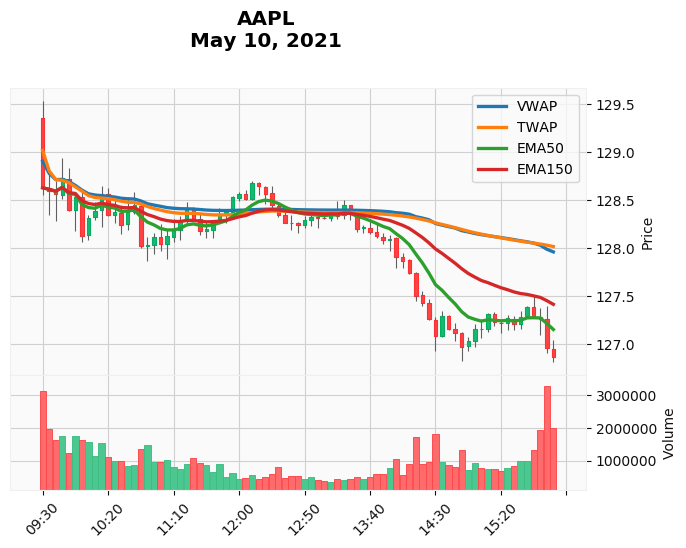

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 6.479 AAPL short contracts at 128.63 per contract
12:00:00: Close 6.479 AAPL short contracts at 128.57 per contract
12:00:00: Buy 6.485 AAPL shares at 128.57 per share
12:35:00: Sell 6.485 AAPL shares at 128.265 per share
12:35:00: Open 6.485 AAPL short contracts at 128.265 per contract
16:00:00: Close 6.485 AAPL short contracts at 126.86 per contract
Cash: $840.86 USD
Return: 0.90%
Transactions: 6
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 6.479 AAPL shares at 128.63 per share
16:00:00: Sell 6.479 AAPL shares at 126.86 per share
Cash: $821.87 USD
Return: -1.38%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 6.491 AAPL shares at 128.38 per share
11:55:00: Sell 6.491 AAPL shares at 128.53 per share
12:50:00:

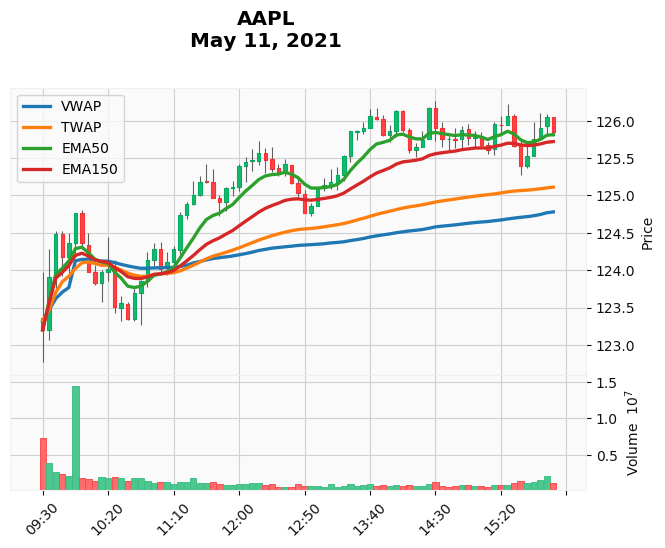

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 6.764 AAPL short contracts at 123.2 per contract
09:40:00: Close 6.764 AAPL short contracts at 124.48 per contract
09:40:00: Buy 6.625 AAPL shares at 124.48 per share
10:10:00: Sell 6.625 AAPL shares at 123.83 per share
10:10:00: Open 6.625 AAPL short contracts at 123.83 per contract
10:55:00: Close 6.625 AAPL short contracts at 124.285 per contract
10:55:00: Buy 6.576 AAPL shares at 124.285 per share
16:00:00: Sell 6.576 AAPL shares at 125.85 per share
Cash: $827.65 USD
Return: -0.68%
Transactions: 8
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 6.764 AAPL shares at 123.2 per share
12:15:00: Sell 6.764 AAPL shares at 125.57 per share
12:15:00: Open 6.764 AAPL short contracts at 125.57 per contract
16:00:00: Close 6.764 AAPL short contracts at 125.85 per contract
Cash: $847.47 USD
Return: 1.70%
Transactions: 4
--------

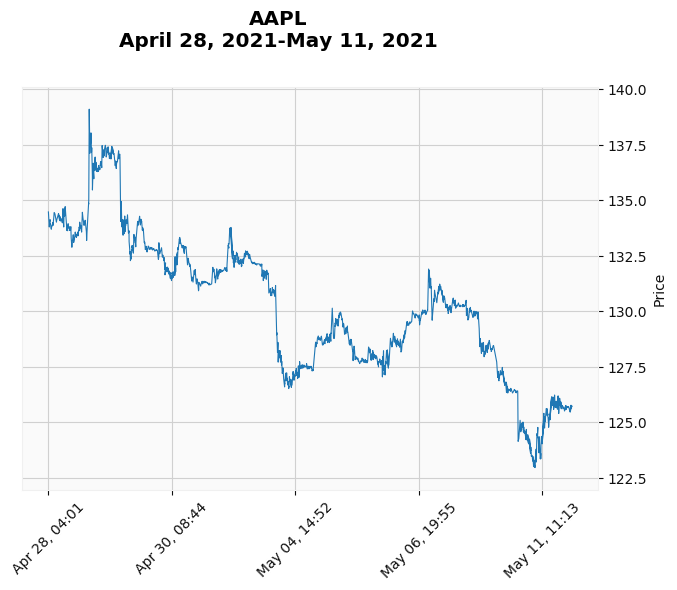

AAPL Returns
Strategy 1:  0.100%
Strategy 2: -0.015%
Strategy 3: -0.111%
Strategy 4: -0.216%
Market    : -0.483%
----------------------------------------------------------------------


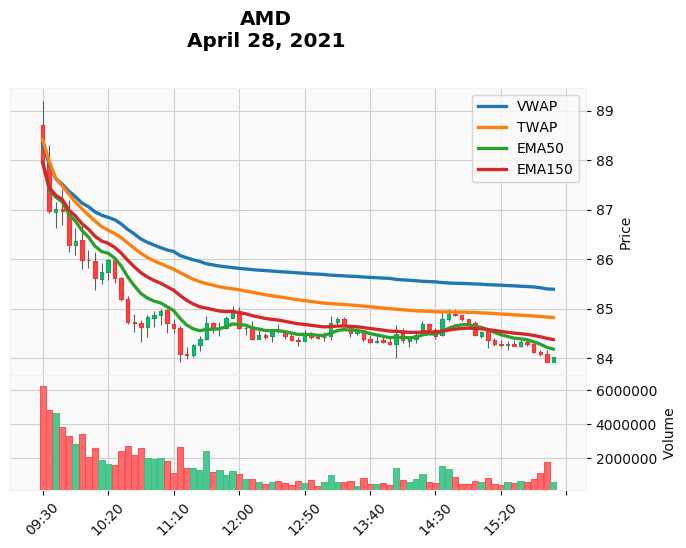

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 9.474 AMD short contracts at 87.9577 per contract
16:00:00: Close 9.474 AMD short contracts at 84.02 per contract
Cash: $870.64 USD
Return: 4.48%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 9.474 AMD shares at 87.9577 per share
16:00:00: Sell 9.474 AMD shares at 84.02 per share
Cash: $796.03 USD
Return: -4.48%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 9.826 AMD shares at 84.8113 per share
14:40:00: Sell 9.826 AMD shares at 84.889 per share
15:10:00: Buy 9.887 AMD shares at 84.36 per share
16:00:00: Sell 9.887 AMD shares at 84.02 per share
Cash: $830.74 USD
Return: -0.31%
Transactions: 4
----------------------------------------------------------------------
2021-04-28: Starting VWAP + TWA

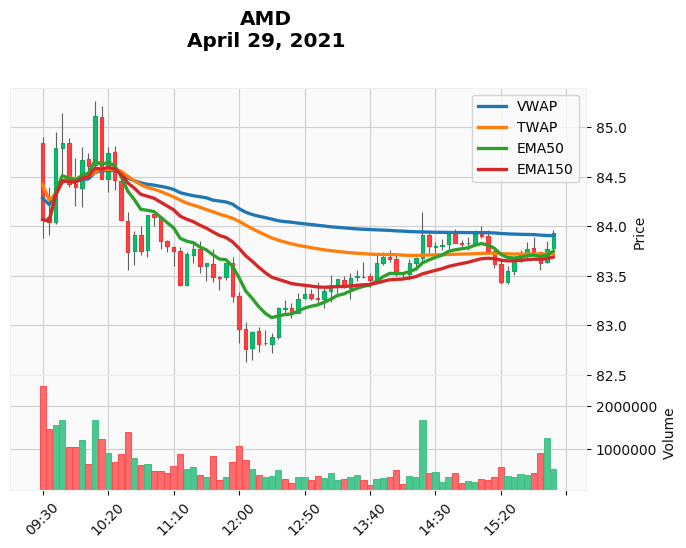

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 9.912 AMD short contracts at 84.0701 per contract
09:45:00: Close 9.912 AMD short contracts at 84.8383 per contract
09:45:00: Buy 9.733 AMD shares at 84.8383 per share
09:55:00: Sell 9.733 AMD shares at 84.4 per share
09:55:00: Open 9.733 AMD short contracts at 84.4 per contract
10:05:00: Close 9.733 AMD short contracts at 84.6111 per contract
10:05:00: Buy 9.684 AMD shares at 84.6111 per share
10:30:00: Sell 9.684 AMD shares at 84.06 per share
10:30:00: Open 9.684 AMD short contracts at 84.06 per contract
16:00:00: Close 9.684 AMD short contracts at 83.93 per contract
Cash: $815.32 USD
Return: -2.16%
Transactions: 10
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 9.912 AMD shares at 84.0701 per share
16:00:00: Sell 9.912 AMD shares at 83.93 per share
Cash: $831.94 USD
Return: -0.17%
Transactions: 2
--------------------

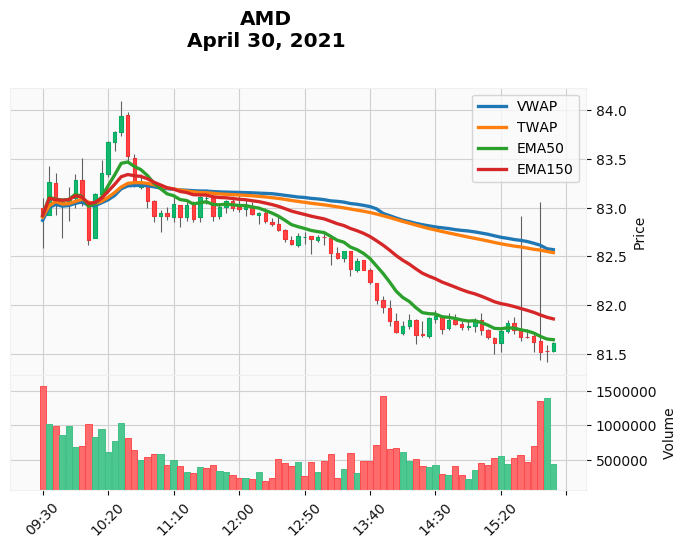

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 10.050 AMD shares at 82.92 per share
10:55:00: Sell 10.050 AMD shares at 82.91 per share
10:55:00: Open 10.050 AMD short contracts at 82.91 per contract
16:00:00: Close 10.050 AMD short contracts at 81.61 per contract
Cash: $846.30 USD
Return: 1.56%
Transactions: 4
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 10.050 AMD short contracts at 82.92 per contract
13:45:00: Close 10.050 AMD short contracts at 82.055 per contract
13:45:00: Buy 10.262 AMD shares at 82.055 per share
16:00:00: Sell 10.262 AMD shares at 81.61 per share
Cash: $837.46 USD
Return: 0.50%
Transactions: 4
----------------------------------------------------------------------
2021-04-30: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 10.032 AMD shares at 83.0701 per share
16:00:00: Sell 10.032 AMD shares at 81.61 per share
Cash: $818.69 USD


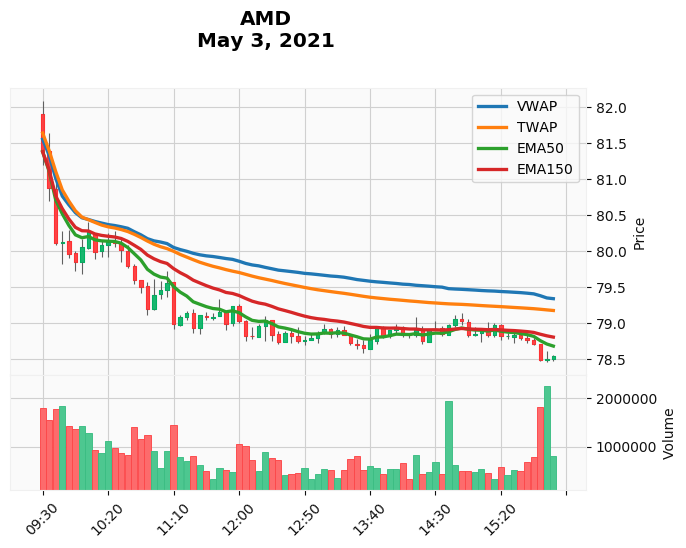

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 10.240 AMD short contracts at 81.38 per contract
16:00:00: Close 10.240 AMD short contracts at 78.55 per contract
Cash: $862.31 USD
Return: 3.48%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 10.240 AMD shares at 81.38 per share
16:00:00: Sell 10.240 AMD shares at 78.55 per share
Cash: $804.35 USD
Return: -3.48%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 10.549 AMD shares at 78.995 per share
14:50:00: Sell 10.549 AMD shares at 79.025 per share
14:55:00: Buy 10.574 AMD shares at 78.837 per share
16:00:00: Sell 10.574 AMD shares at 78.55 per share
Cash: $830.61 USD
Return: -0.33%
Transactions: 4
----------------------------------------------------------------------
2021-05-03: Starting VWAP +

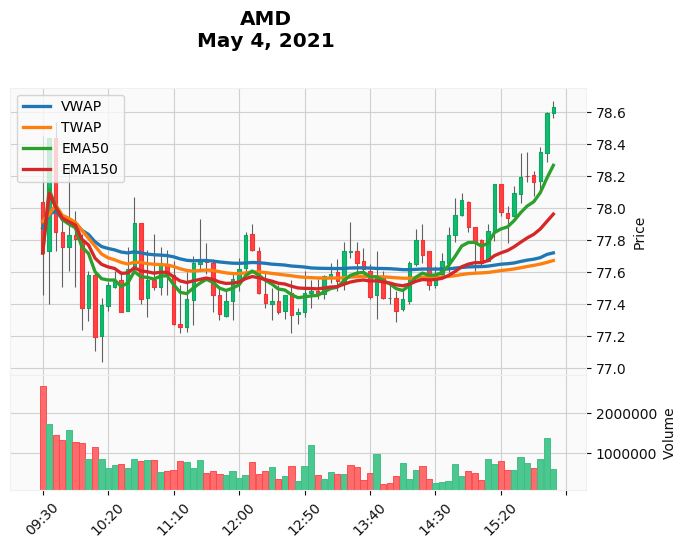

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 10.722 AMD short contracts at 77.72 per contract
12:10:00: Close 10.722 AMD short contracts at 77.74 per contract
12:10:00: Buy 10.717 AMD shares at 77.74 per share
12:20:00: Sell 10.717 AMD shares at 77.405 per share
12:20:00: Open 10.717 AMD short contracts at 77.405 per contract
13:25:00: Close 10.717 AMD short contracts at 77.73 per contract
13:25:00: Buy 10.627 AMD shares at 77.73 per share
13:40:00: Sell 10.627 AMD shares at 77.448 per share
13:40:00: Open 10.627 AMD short contracts at 77.448 per contract
14:15:00: Close 10.627 AMD short contracts at 77.8 per contract
14:15:00: Buy 10.531 AMD shares at 77.8 per share
14:30:00: Sell 10.531 AMD shares at 77.59 per share
14:30:00: Open 10.531 AMD short contracts at 77.59 per contract
14:40:00: Close 10.531 AMD short contracts at 77.835 per contract
14:40:00: Buy 10.465 AMD shares at 77.835 per share
16:00:00: Sell 10.465 AMD shares at 78.6294 per share
Cash: $8

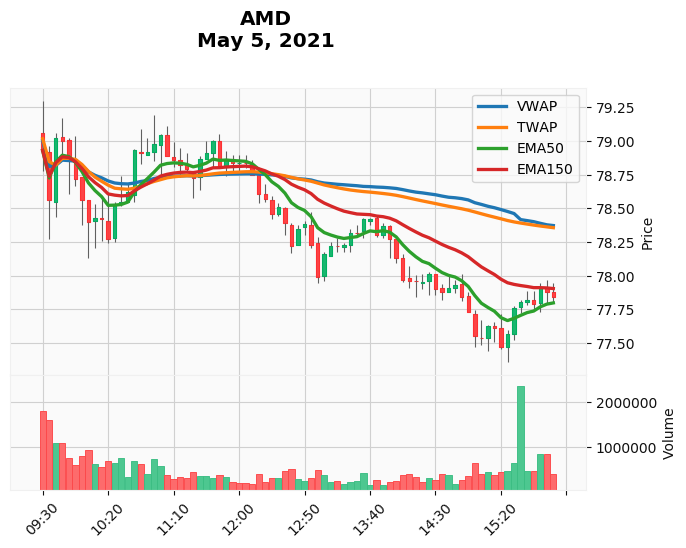

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 10.558 AMD short contracts at 78.93 per contract
09:45:00: Close 10.558 AMD short contracts at 78.9977 per contract
09:45:00: Buy 10.540 AMD shares at 78.9977 per share
10:00:00: Sell 10.540 AMD shares at 78.56 per share
10:00:00: Open 10.540 AMD short contracts at 78.56 per contract
10:45:00: Close 10.540 AMD short contracts at 78.91 per contract
10:45:00: Buy 10.446 AMD shares at 78.91 per share
12:15:00: Sell 10.446 AMD shares at 78.61 per share
12:15:00: Open 10.446 AMD short contracts at 78.61 per contract
16:00:00: Close 10.446 AMD short contracts at 77.84 per contract
Cash: $829.23 USD
Return: -0.49%
Transactions: 10
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 10.558 AMD shares at 78.93 per share
16:00:00: Sell 10.558 AMD shares at 77.84 per share
Cash: $821.83 USD
Return: -1.38%
Transactions: 2
--------------

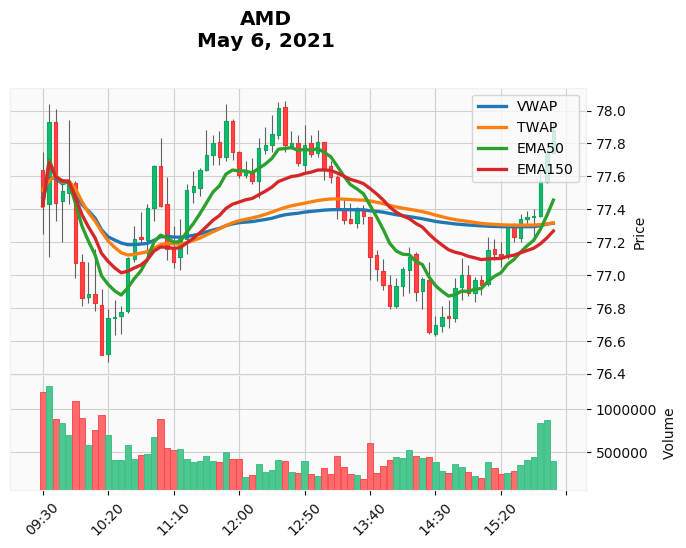

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 10.764 AMD short contracts at 77.4199 per contract
10:45:00: Close 10.764 AMD short contracts at 77.22 per contract
10:45:00: Buy 10.820 AMD shares at 77.22 per share
11:10:00: Sell 10.820 AMD shares at 77.08 per share
11:10:00: Open 10.820 AMD short contracts at 77.08 per contract
11:25:00: Close 10.820 AMD short contracts at 77.5387 per contract
11:25:00: Buy 10.692 AMD shares at 77.5387 per share
13:25:00: Sell 10.692 AMD shares at 77.315 per share
13:25:00: Open 10.692 AMD short contracts at 77.315 per contract
15:40:00: Close 10.692 AMD short contracts at 77.35 per contract
15:40:00: Buy 10.682 AMD shares at 77.35 per share
16:00:00: Sell 10.682 AMD shares at 77.88 per share
Cash: $831.90 USD
Return: -0.17%
Transactions: 12
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 10.764 AMD shares at 77.4199 per share
16:00:

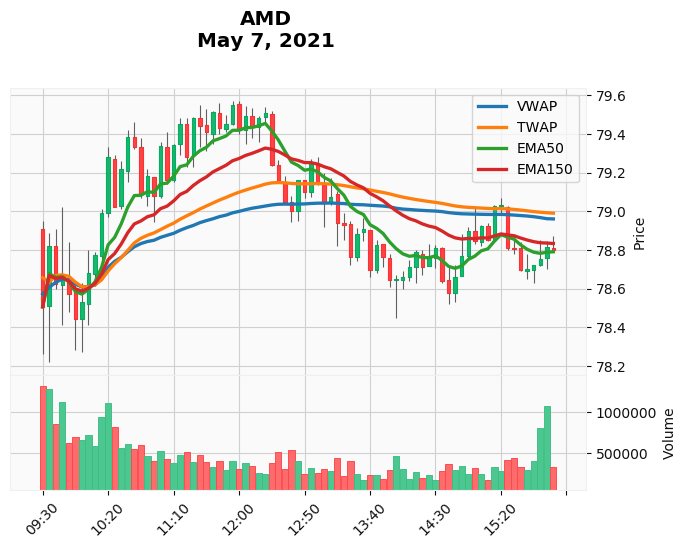

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 10.615 AMD short contracts at 78.505 per contract
10:10:00: Close 10.615 AMD short contracts at 78.775 per contract
10:10:00: Buy 10.542 AMD shares at 78.775 per share
13:20:00: Sell 10.542 AMD shares at 78.93 per share
13:20:00: Open 10.542 AMD short contracts at 78.93 per contract
15:20:00: Close 10.542 AMD short contracts at 79.03 per contract
15:20:00: Buy 10.516 AMD shares at 79.03 per share
15:30:00: Sell 10.516 AMD shares at 78.805 per share
15:30:00: Open 10.516 AMD short contracts at 78.805 per contract
16:00:00: Close 10.516 AMD short contracts at 78.8 per contract
Cash: $828.73 USD
Return: -0.55%
Transactions: 10
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 10.615 AMD shares at 78.505 per share
16:00:00: Sell 10.615 AMD shares at 78.8 per share
Cash: $836.46 USD
Return: 0.38%
Transactions: 2
---------------

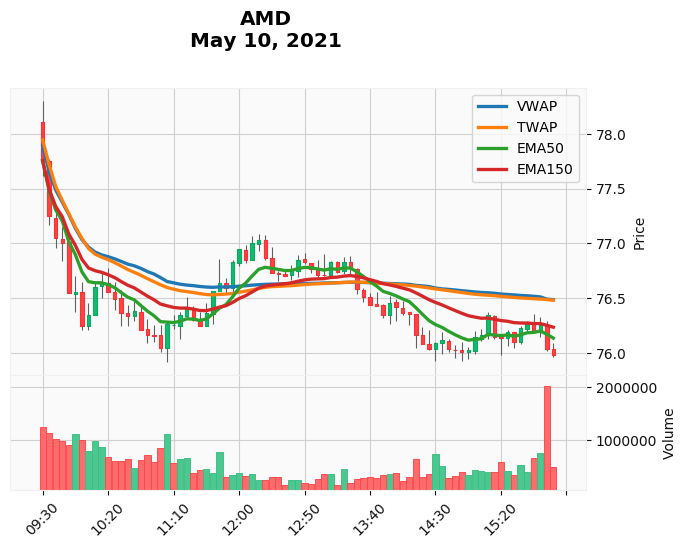

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 10.718 AMD short contracts at 77.7537 per contract
12:00:00: Close 10.718 AMD short contracts at 76.945 per contract
12:00:00: Buy 10.943 AMD shares at 76.945 per share
13:35:00: Sell 10.943 AMD shares at 76.51 per share
13:35:00: Open 10.943 AMD short contracts at 76.51 per contract
16:00:00: Close 10.943 AMD short contracts at 75.98 per contract
Cash: $843.04 USD
Return: 1.16%
Transactions: 6
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 10.718 AMD shares at 77.7537 per share
16:00:00: Sell 10.718 AMD shares at 75.98 per share
Cash: $814.32 USD
Return: -2.28%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
13:40:00: Buy 10.902 AMD shares at 76.44 per share
16:00:00: Sell 10.902 AMD shares at 75.98 per share
Cash: $828.32 U

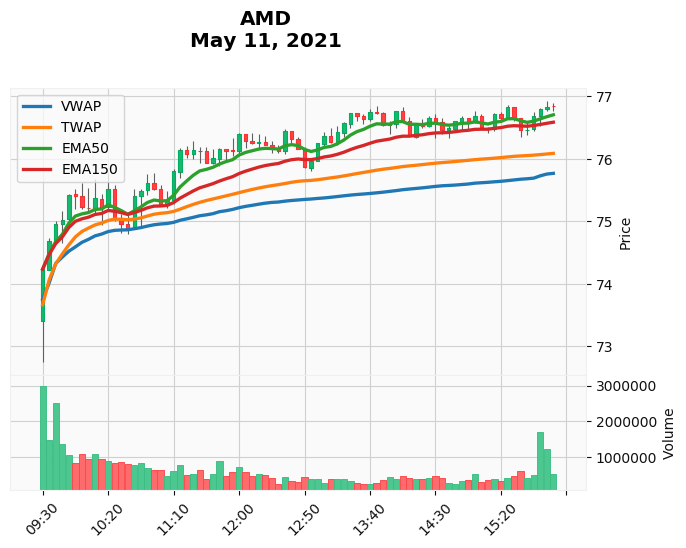

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 11.226 AMD shares at 74.235 per share
16:00:00: Sell 11.226 AMD shares at 76.84 per share
Cash: $862.58 USD
Return: 3.51%
Transactions: 2
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 11.226 AMD short contracts at 74.235 per contract
16:00:00: Close 11.226 AMD short contracts at 76.84 per contract
Cash: $804.09 USD
Return: -3.51%
Transactions: 2
----------------------------------------------------------------------
2021-05-11: Starting EMA Cross strategy with $833.33 USD
Cash: $833.33 USD
Return: 0.00%
Transactions: 0
----------------------------------------------------------------------
2021-05-11: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Buy 11.226 AMD shares at 74.235 per share
16:00:00: Sell 11.226 AMD shares at 76.84 per share
Cash: $862.58 USD
Return: 3.51%
Transactions: 2
------------------------

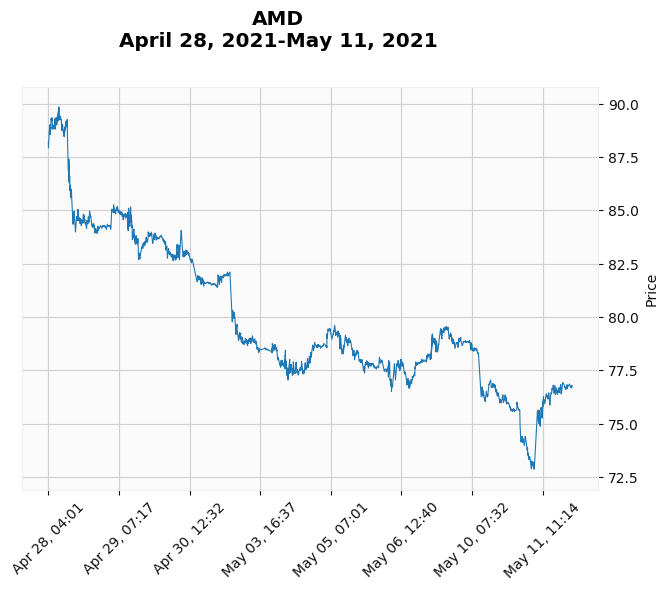

AMD Returns
Strategy 1:  0.955%
Strategy 2: -1.276%
Strategy 3: -0.278%
Strategy 4:  1.521%
Market    : -1.077%
----------------------------------------------------------------------


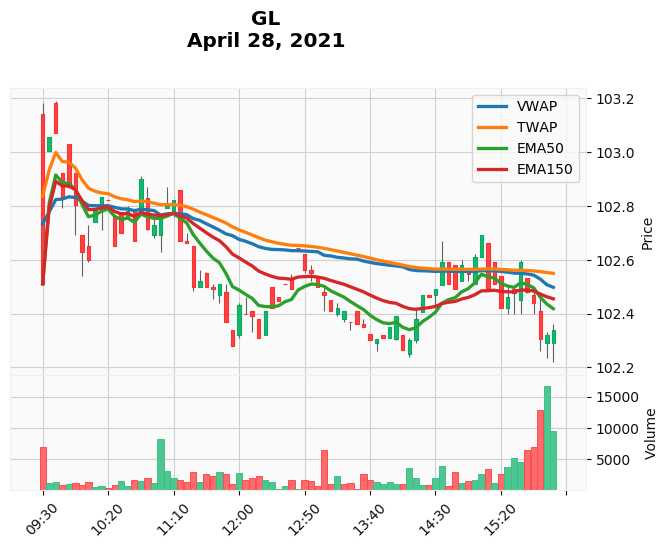

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 8.129 GL short contracts at 102.5101 per contract
09:35:00: Close 8.129 GL short contracts at 103.055 per contract
09:35:00: Buy 8.043 GL shares at 103.055 per share
10:00:00: Sell 8.043 GL shares at 102.63 per share
10:00:00: Open 8.043 GL short contracts at 102.63 per contract
10:20:00: Close 8.043 GL short contracts at 102.82 per contract
10:20:00: Buy 8.014 GL shares at 102.82 per share
10:25:00: Sell 8.014 GL shares at 102.65 per share
10:25:00: Open 8.014 GL short contracts at 102.65 per contract
11:05:00: Close 8.014 GL short contracts at 102.8 per contract
11:05:00: Buy 7.990 GL shares at 102.8 per share
11:20:00: Sell 7.990 GL shares at 102.66 per share
11:20:00: Open 7.990 GL short contracts at 102.66 per contract
12:45:00: Close 7.990 GL short contracts at 102.645 per contract
12:45:00: Buy 7.993 GL shares at 102.645 per share
12:50:00: Sell 7.993 GL shares at 102.56 per share
12:50:00: Open 7.993 GL sh

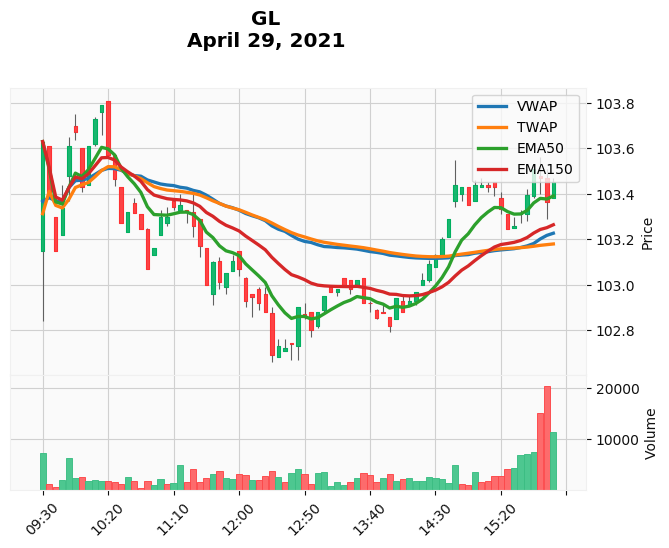

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 8.041 GL shares at 103.63 per share
09:40:00: Sell 8.041 GL shares at 103.15 per share
09:40:00: Open 8.041 GL short contracts at 103.15 per contract
09:50:00: Close 8.041 GL short contracts at 103.61 per contract
09:50:00: Buy 7.970 GL shares at 103.61 per share
10:30:00: Sell 7.970 GL shares at 103.27 per share
10:30:00: Open 7.970 GL short contracts at 103.27 per contract
14:35:00: Close 7.970 GL short contracts at 103.2 per contract
14:35:00: Buy 7.981 GL shares at 103.2 per share
16:00:00: Sell 7.981 GL shares at 103.45 per share
Cash: $825.62 USD
Return: -0.93%
Transactions: 10
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 8.041 GL short contracts at 103.63 per contract
16:00:00: Close 8.041 GL short contracts at 103.45 per contract
Cash: $834.78 USD
Return: 0.17%
Transactions: 2
---------------------------------

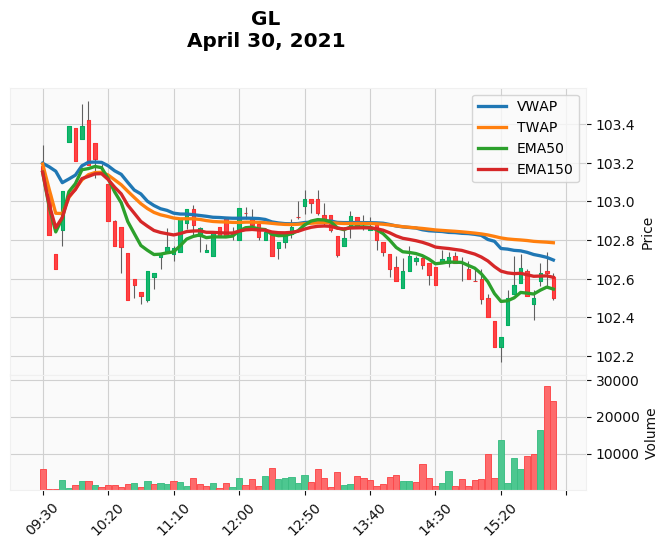

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 8.079 GL short contracts at 103.15 per contract
09:50:00: Close 8.079 GL short contracts at 103.39 per contract
09:50:00: Buy 8.041 GL shares at 103.39 per share
10:15:00: Sell 8.041 GL shares at 103.15 per share
10:15:00: Open 8.041 GL short contracts at 103.15 per contract
12:05:00: Close 8.041 GL short contracts at 102.94 per contract
12:05:00: Buy 8.074 GL shares at 102.94 per share
12:15:00: Sell 8.074 GL shares at 102.815 per share
12:15:00: Open 8.074 GL short contracts at 102.815 per contract
12:45:00: Close 8.074 GL short contracts at 102.92 per contract
12:45:00: Buy 8.058 GL shares at 102.92 per share
13:15:00: Sell 8.058 GL shares at 102.725 per share
13:15:00: Open 8.058 GL short contracts at 102.725 per contract
16:00:00: Close 8.058 GL short contracts at 102.5 per contract
Cash: $829.54 USD
Return: -0.46%
Transactions: 14
----------------------------------------------------------------------
2021-04

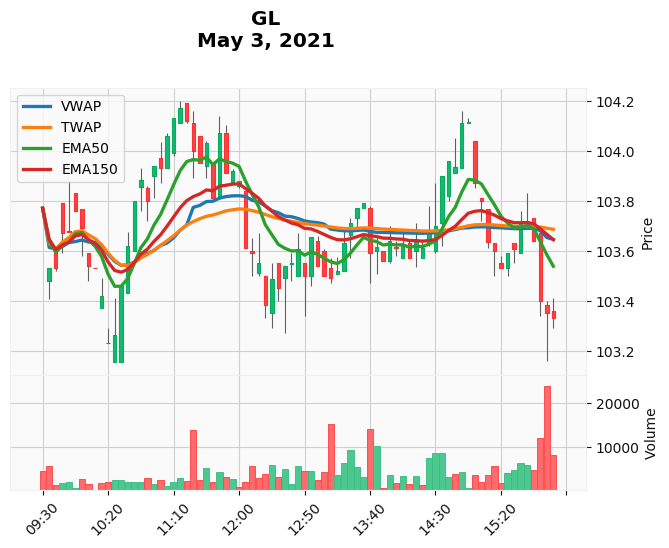

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 8.031 GL short contracts at 103.77 per contract
09:45:00: Close 8.031 GL short contracts at 103.67 per contract
09:45:00: Buy 8.046 GL shares at 103.67 per share
10:05:00: Sell 8.046 GL shares at 103.54 per share
10:05:00: Open 8.046 GL short contracts at 103.54 per contract
10:40:00: Close 8.046 GL short contracts at 103.8 per contract
10:40:00: Buy 8.006 GL shares at 103.8 per share
12:10:00: Sell 8.006 GL shares at 103.59 per share
12:10:00: Open 8.006 GL short contracts at 103.59 per contract
13:30:00: Close 8.006 GL short contracts at 103.77 per contract
13:30:00: Buy 7.978 GL shares at 103.77 per share
13:45:00: Sell 7.978 GL shares at 103.615 per share
13:45:00: Open 7.978 GL short contracts at 103.615 per contract
14:35:00: Close 7.978 GL short contracts at 103.9 per contract
14:35:00: Buy 7.934 GL shares at 103.9 per share
15:15:00: Sell 7.934 GL shares at 103.6 per share
15:15:00: Open 7.934 GL short con

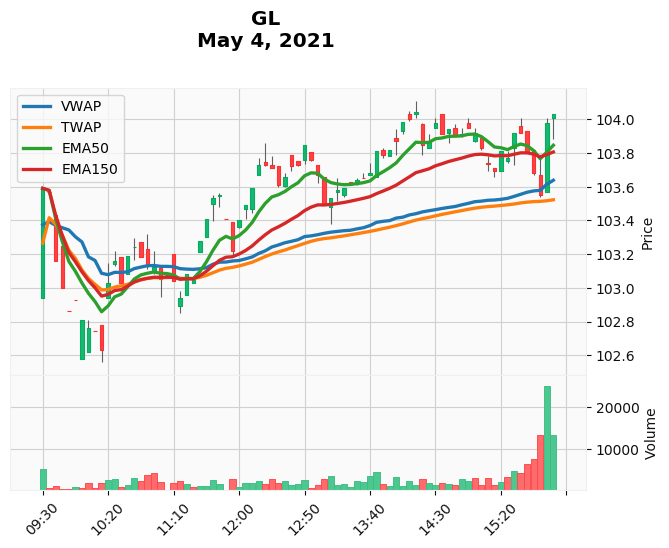

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 8.045 GL shares at 103.59 per share
09:45:00: Sell 8.045 GL shares at 103.0 per share
09:45:00: Open 8.045 GL short contracts at 103.0 per contract
10:25:00: Close 8.045 GL short contracts at 103.16 per contract
10:25:00: Buy 8.020 GL shares at 103.16 per share
10:55:00: Sell 8.020 GL shares at 103.125 per share
10:55:00: Open 8.020 GL short contracts at 103.125 per contract
11:30:00: Close 8.020 GL short contracts at 103.28 per contract
11:30:00: Buy 7.996 GL shares at 103.28 per share
16:00:00: Sell 7.996 GL shares at 104.03 per share
Cash: $831.77 USD
Return: -0.19%
Transactions: 10
----------------------------------------------------------------------
2021-05-04: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 8.045 GL short contracts at 103.59 per contract
16:00:00: Close 8.045 GL short contracts at 104.03 per contract
Cash: $829.79 USD
Return: -0.42%
Transactions: 2
------------------------------

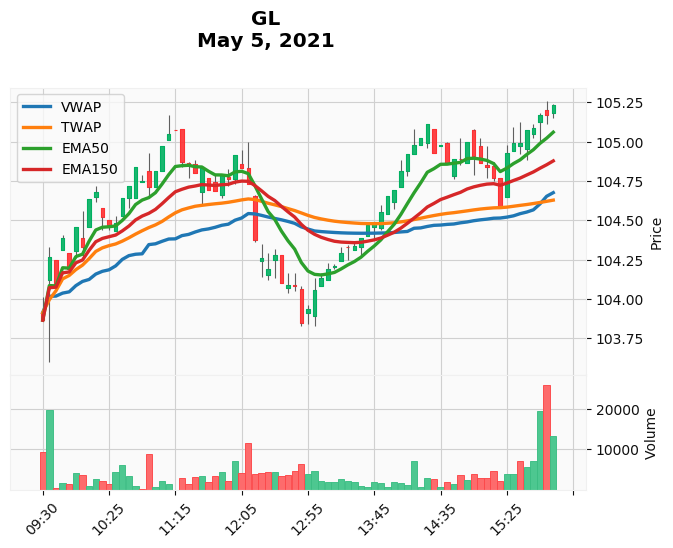

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 8.023 GL short contracts at 103.865 per contract
09:35:00: Close 8.023 GL short contracts at 104.265 per contract
09:35:00: Buy 7.962 GL shares at 104.265 per share
12:20:00: Sell 7.962 GL shares at 104.26 per share
12:20:00: Open 7.962 GL short contracts at 104.26 per contract
13:45:00: Close 7.962 GL short contracts at 104.49 per contract
13:45:00: Buy 7.927 GL shares at 104.49 per share
16:00:00: Sell 7.927 GL shares at 105.23 per share
Cash: $834.12 USD
Return: 0.09%
Transactions: 8
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 8.023 GL shares at 103.865 per share
16:00:00: Sell 8.023 GL shares at 105.23 per share
Cash: $844.29 USD
Return: 1.31%
Transactions: 2
----------------------------------------------------------------------
2021-05-05: Starting EMA Cross strategy with $833.33 USD
12:15:00: Buy 7.984 GL share

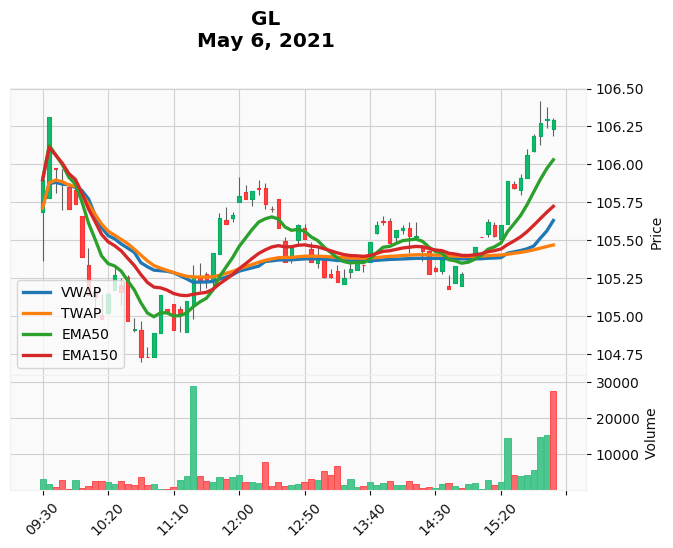

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 7.869 GL shares at 105.9 per share
09:45:00: Sell 7.869 GL shares at 105.87 per share
09:45:00: Open 7.869 GL short contracts at 105.87 per contract
11:30:00: Close 7.869 GL short contracts at 105.23 per contract
11:30:00: Buy 7.965 GL shares at 105.23 per share
13:10:00: Sell 7.965 GL shares at 105.26 per share
13:10:00: Open 7.965 GL short contracts at 105.26 per contract
13:45:00: Close 7.965 GL short contracts at 105.6 per contract
13:45:00: Buy 7.913 GL shares at 105.6 per share
14:30:00: Sell 7.913 GL shares at 105.3 per share
14:30:00: Open 7.913 GL short contracts at 105.3 per contract
15:00:00: Close 7.913 GL short contracts at 105.46 per contract
15:00:00: Buy 7.889 GL shares at 105.46 per share
16:00:00: Sell 7.889 GL shares at 106.29 per share
Cash: $838.57 USD
Return: 0.63%
Transactions: 14
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion w

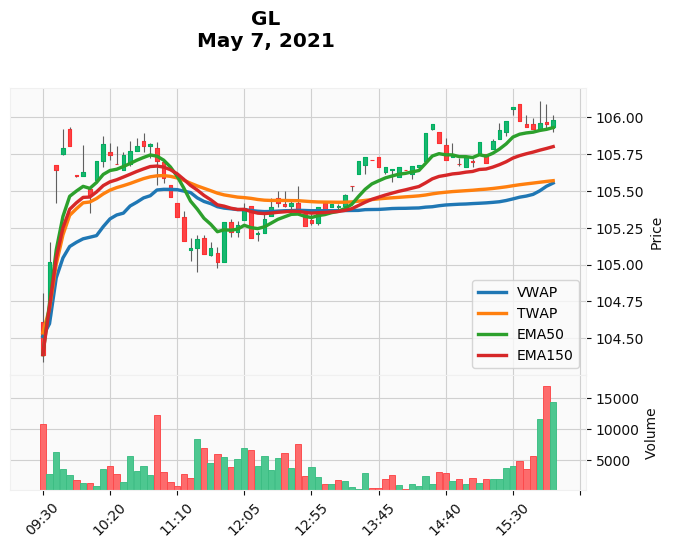

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 7.983 GL short contracts at 104.39 per contract
09:35:00: Close 7.983 GL short contracts at 105.02 per contract
09:35:00: Buy 7.887 GL shares at 105.02 per share
11:10:00: Sell 7.887 GL shares at 105.32 per share
11:10:00: Open 7.887 GL short contracts at 105.32 per contract
12:30:00: Close 7.887 GL short contracts at 105.42 per contract
12:30:00: Buy 7.872 GL shares at 105.42 per share
12:50:00: Sell 7.872 GL shares at 105.26 per share
12:50:00: Open 7.872 GL short contracts at 105.26 per contract
13:05:00: Close 7.872 GL short contracts at 105.37 per contract
13:05:00: Buy 7.856 GL shares at 105.37 per share
16:00:00: Sell 7.856 GL shares at 105.98 per share
Cash: $832.55 USD
Return: -0.09%
Transactions: 12
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 7.983 GL shares at 104.39 per share
16:00:00: Sell 7.983 GL share

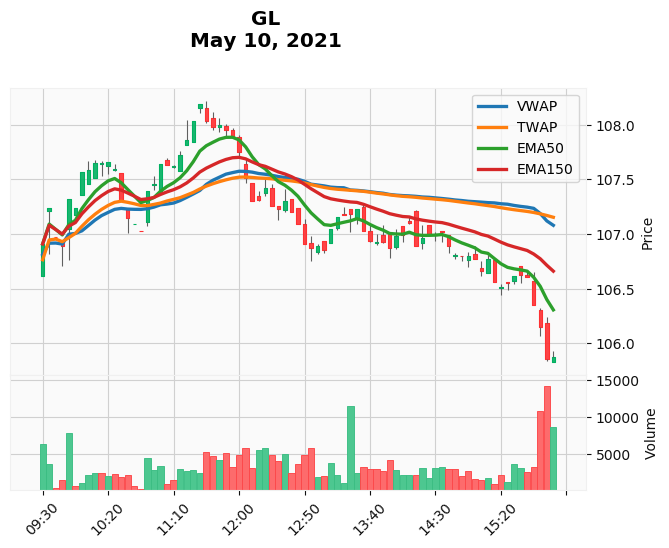

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 7.795 GL shares at 106.91 per share
10:35:00: Sell 7.795 GL shares at 107.15 per share
10:35:00: Open 7.795 GL short contracts at 107.15 per contract
10:55:00: Close 7.795 GL short contracts at 107.455 per contract
10:55:00: Buy 7.750 GL shares at 107.455 per share
12:10:00: Sell 7.750 GL shares at 107.3 per share
12:10:00: Open 7.750 GL short contracts at 107.3 per contract
16:00:00: Close 7.750 GL short contracts at 105.88 per contract
Cash: $842.63 USD
Return: 1.12%
Transactions: 8
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 7.795 GL short contracts at 106.91 per contract
15:55:00: Close 7.795 GL short contracts at 105.86 per contract
15:55:00: Buy 7.949 GL shares at 105.86 per share
16:00:00: Sell 7.949 GL shares at 105.88 per share
Cash: $841.68 USD
Return: 1.00%
Transactions: 4
---------------------------------

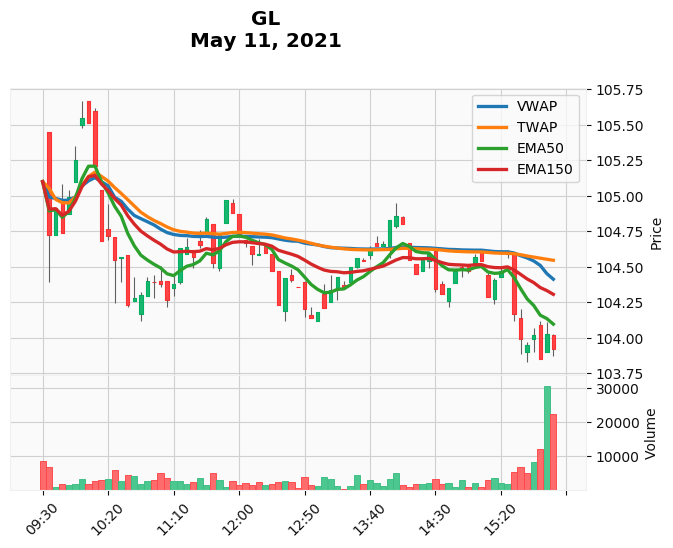

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 7.929 GL shares at 105.1 per share
09:40:00: Sell 7.929 GL shares at 104.915 per share
09:40:00: Open 7.929 GL short contracts at 104.915 per contract
09:55:00: Close 7.929 GL short contracts at 105.25 per contract
09:55:00: Buy 7.878 GL shares at 105.25 per share
10:15:00: Sell 7.878 GL shares at 104.6838 per share
10:15:00: Open 7.878 GL short contracts at 104.6838 per contract
11:35:00: Close 7.878 GL short contracts at 104.84 per contract
11:35:00: Buy 7.855 GL shares at 104.84 per share
12:05:00: Sell 7.855 GL shares at 104.67 per share
12:05:00: Open 7.855 GL short contracts at 104.67 per contract
13:45:00: Close 7.855 GL short contracts at 104.65 per contract
13:45:00: Buy 7.858 GL shares at 104.65 per share
14:15:00: Sell 7.858 GL shares at 104.45 per share
14:15:00: Open 7.858 GL short contracts at 104.45 per contract
16:00:00: Close 7.858 GL short contracts at 103.92 per contract
Cash: $824.93 USD
Return:

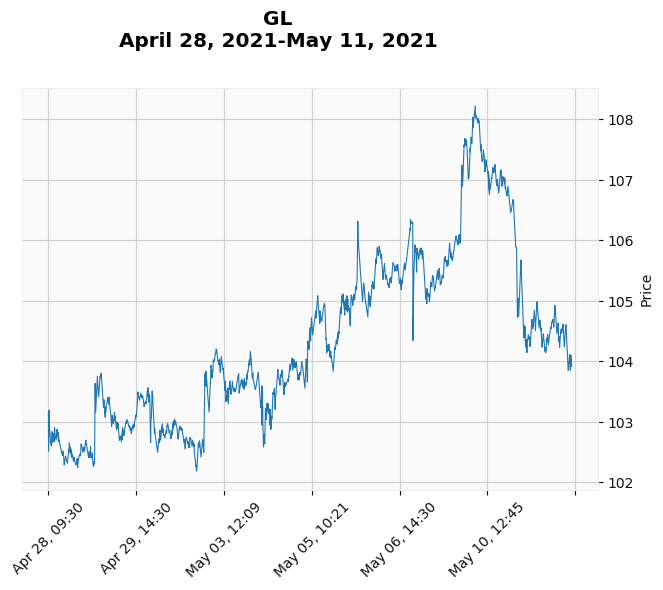

GL Returns
Strategy 1: -0.449%
Strategy 2:  0.397%
Strategy 3:  0.019%
Strategy 4: -0.669%
Market    :  0.082%
----------------------------------------------------------------------


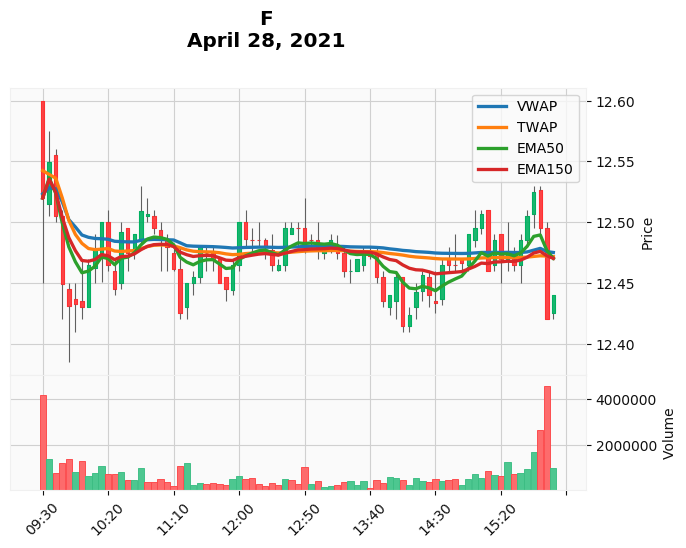

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 66.561 F short contracts at 12.5198 per contract
10:50:00: Close 66.561 F short contracts at 12.5071 per contract
10:50:00: Buy 66.696 F shares at 12.5071 per share
11:05:00: Sell 66.696 F shares at 12.48 per share
11:05:00: Open 66.696 F short contracts at 12.48 per contract
12:05:00: Close 66.696 F short contracts at 12.4858 per contract
12:05:00: Buy 66.634 F shares at 12.4858 per share
12:25:00: Sell 66.634 F shares at 12.465 per share
12:25:00: Open 66.634 F short contracts at 12.465 per contract
12:40:00: Close 66.634 F short contracts at 12.495 per contract
12:40:00: Buy 66.314 F shares at 12.495 per share
13:05:00: Sell 66.314 F shares at 12.48 per share
13:05:00: Open 66.314 F short contracts at 12.48 per contract
15:00:00: Close 66.314 F short contracts at 12.495 per contract
15:00:00: Buy 66.155 F shares at 12.495 per share
15:25:00: Sell 66.155 F shares at 12.475 per share
15:25:00: Open 66.155 F short

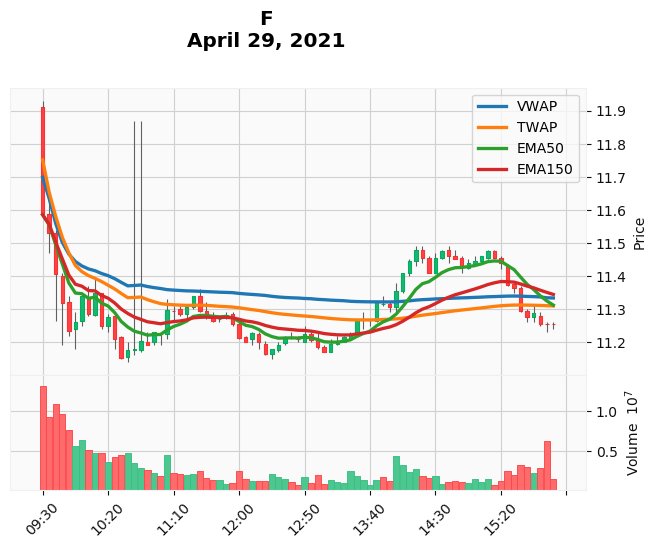

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 71.932 F short contracts at 11.585 per contract
14:05:00: Close 71.932 F short contracts at 11.41 per contract
14:05:00: Buy 74.139 F shares at 11.41 per share
15:40:00: Sell 74.139 F shares at 11.2759 per share
15:40:00: Open 74.139 F short contracts at 11.2759 per contract
16:00:00: Close 74.139 F short contracts at 11.255 per contract
Cash: $837.53 USD
Return: 0.50%
Transactions: 6
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 71.932 F shares at 11.585 per share
14:10:00: Sell 71.932 F shares at 11.445 per share
14:10:00: Open 71.932 F short contracts at 11.445 per contract
16:00:00: Close 71.932 F short contracts at 11.255 per contract
Cash: $836.93 USD
Return: 0.43%
Transactions: 4
----------------------------------------------------------------------
2021-04-29: Starting EMA Cross strategy with $833.33 USD
12:00:

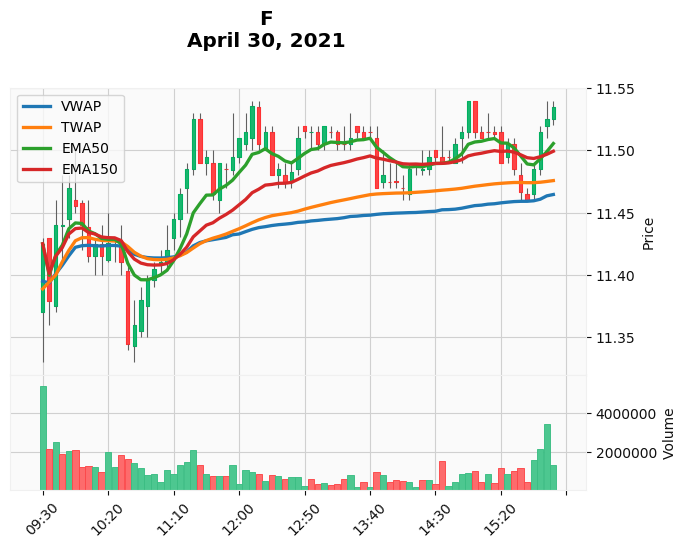

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 72.939 F shares at 11.425 per share
10:35:00: Sell 72.939 F shares at 11.3441 per share
10:35:00: Open 72.939 F short contracts at 11.3441 per contract
11:10:00: Close 72.939 F short contracts at 11.445 per contract
11:10:00: Buy 71.653 F shares at 11.445 per share
16:00:00: Sell 71.653 F shares at 11.535 per share
Cash: $826.52 USD
Return: -0.82%
Transactions: 6
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 72.939 F short contracts at 11.425 per contract
16:00:00: Close 72.939 F short contracts at 11.535 per contract
Cash: $825.31 USD
Return: -0.96%
Transactions: 2
----------------------------------------------------------------------
2021-04-30: Starting EMA Cross strategy with $833.33 USD
14:05:00: Buy 72.653 F shares at 11.47 per share
14:40:00: Sell 72.653 F shares at 11.495 per share
15:35:00: Buy 72.832 F shares

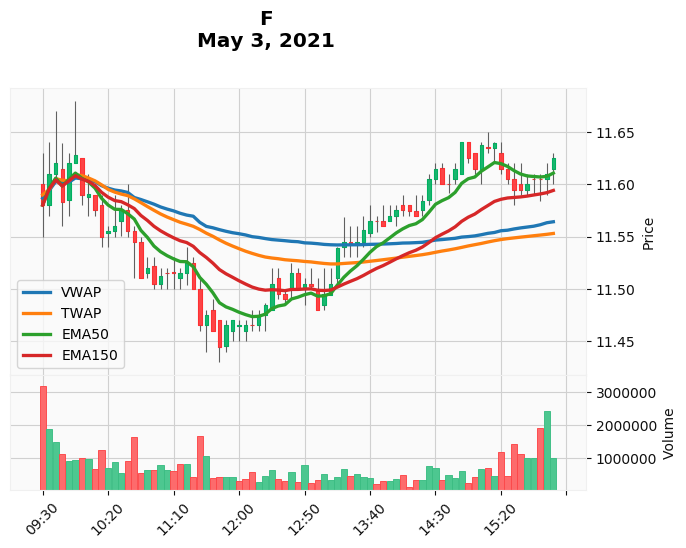

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 71.963 F short contracts at 11.58 per contract
09:40:00: Close 71.963 F short contracts at 11.6199 per contract
09:40:00: Buy 71.469 F shares at 11.6199 per share
10:05:00: Sell 71.469 F shares at 11.5906 per share
10:05:00: Open 71.469 F short contracts at 11.5906 per contract
13:25:00: Close 71.469 F short contracts at 11.5438 per contract
13:25:00: Buy 72.048 F shares at 11.5438 per share
16:00:00: Sell 72.048 F shares at 11.625 per share
Cash: $837.56 USD
Return: 0.51%
Transactions: 8
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 71.963 F shares at 11.58 per share
16:00:00: Sell 71.963 F shares at 11.625 per share
Cash: $836.57 USD
Return: 0.39%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 72.685 F share

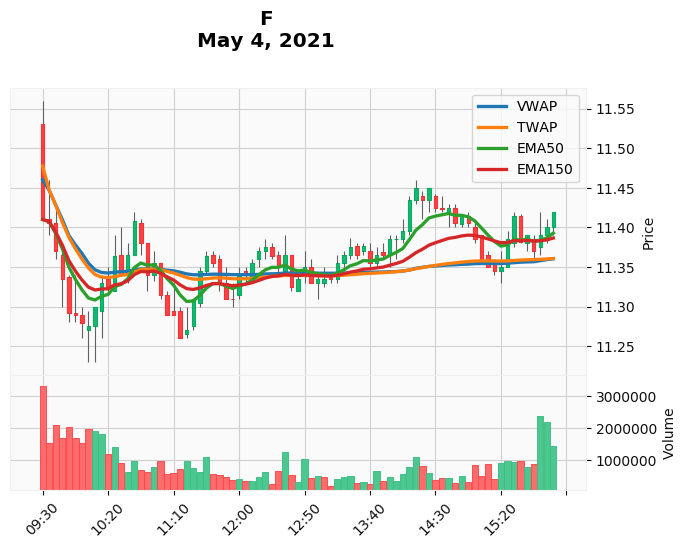

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 73.035 F short contracts at 11.41 per contract
10:40:00: Close 73.035 F short contracts at 11.4084 per contract
10:40:00: Buy 73.056 F shares at 11.4084 per share
11:05:00: Sell 73.056 F shares at 11.29 per share
11:05:00: Open 73.056 F short contracts at 11.29 per contract
11:35:00: Close 73.056 F short contracts at 11.3641 per contract
11:35:00: Buy 72.103 F shares at 11.3641 per share
11:50:00: Sell 72.103 F shares at 11.31 per share
11:50:00: Open 72.103 F short contracts at 11.31 per contract
12:15:00: Close 72.103 F short contracts at 11.37 per contract
12:15:00: Buy 71.342 F shares at 11.37 per share
12:45:00: Sell 71.342 F shares at 11.335 per share
12:45:00: Open 71.342 F short contracts at 11.335 per contract
13:20:00: Close 71.342 F short contracts at 11.365 per contract
13:20:00: Buy 70.965 F shares at 11.365 per share
15:20:00: Sell 70.965 F shares at 11.35 per share
15:20:00: Open 70.965 F short cont

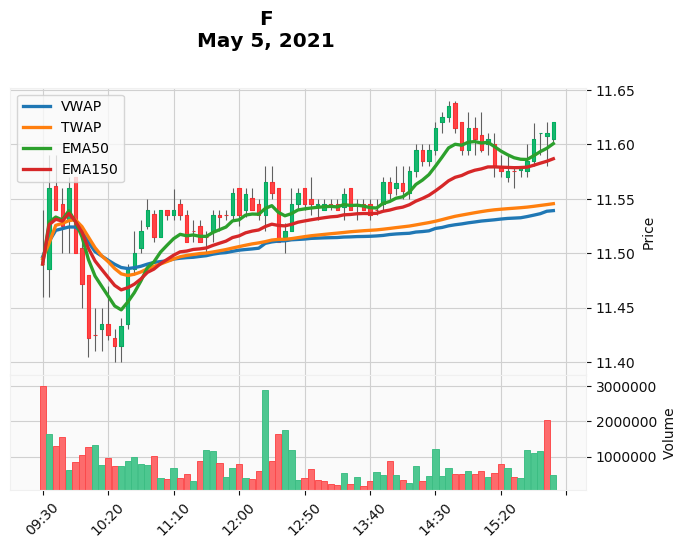

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 72.527 F short contracts at 11.49 per contract
09:40:00: Close 72.527 F short contracts at 11.54 per contract
09:40:00: Buy 71.898 F shares at 11.54 per share
10:00:00: Sell 71.898 F shares at 11.4718 per share
10:00:00: Open 71.898 F short contracts at 11.4718 per contract
10:45:00: Close 71.898 F short contracts at 11.52 per contract
10:45:00: Buy 71.297 F shares at 11.52 per share
16:00:00: Sell 71.297 F shares at 11.62 per share
Cash: $828.47 USD
Return: -0.58%
Transactions: 8
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 72.527 F shares at 11.49 per share
16:00:00: Sell 72.527 F shares at 11.62 per share
Cash: $842.76 USD
Return: 1.13%
Transactions: 2
----------------------------------------------------------------------
2021-05-05: Starting EMA Cross strategy with $833.33 USD
Cash: $833.33 USD
Return: 0.00%
Trans

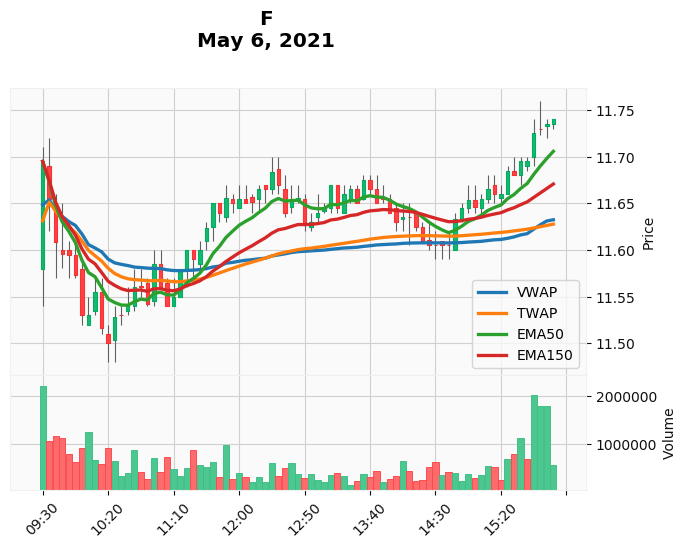

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 71.256 F shares at 11.695 per share
09:45:00: Sell 71.256 F shares at 11.5952 per share
09:45:00: Open 71.256 F short contracts at 11.5952 per contract
11:20:00: Close 71.256 F short contracts at 11.6 per contract
11:20:00: Buy 71.197 F shares at 11.6 per share
14:30:00: Sell 71.197 F shares at 11.6049 per share
14:30:00: Open 71.197 F short contracts at 11.6049 per contract
14:50:00: Close 71.197 F short contracts at 11.645 per contract
14:50:00: Buy 70.706 F shares at 11.645 per share
16:00:00: Sell 70.706 F shares at 11.74 per share
Cash: $830.09 USD
Return: -0.39%
Transactions: 10
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 71.256 F short contracts at 11.695 per contract
16:00:00: Close 71.256 F short contracts at 11.74 per contract
Cash: $830.13 USD
Return: -0.38%
Transactions: 2
--------------------------------

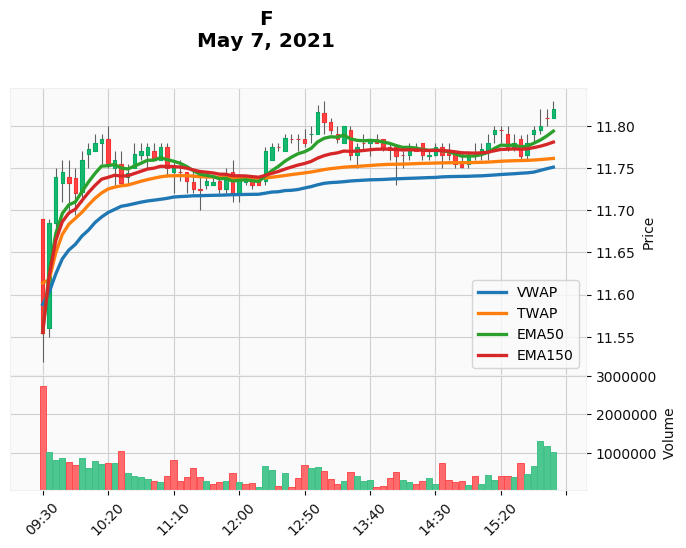

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 72.119 F short contracts at 11.555 per contract
09:40:00: Close 72.119 F short contracts at 11.74 per contract
09:40:00: Buy 69.846 F shares at 11.74 per share
16:00:00: Sell 69.846 F shares at 11.82 per share
Cash: $825.58 USD
Return: -0.93%
Transactions: 4
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 72.119 F shares at 11.555 per share
16:00:00: Sell 72.119 F shares at 11.82 per share
Cash: $852.44 USD
Return: 2.29%
Transactions: 2
----------------------------------------------------------------------
2021-05-07: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 70.982 F shares at 11.74 per share
12:25:00: Sell 70.982 F shares at 11.7752 per share
14:35:00: Buy 71.044 F shares at 11.765 per share
15:15:00: Sell 71.044 F shares at 11.795 per share
Cash: $837.96 USD
Return: 0.56%
Transactions: 4
-------------

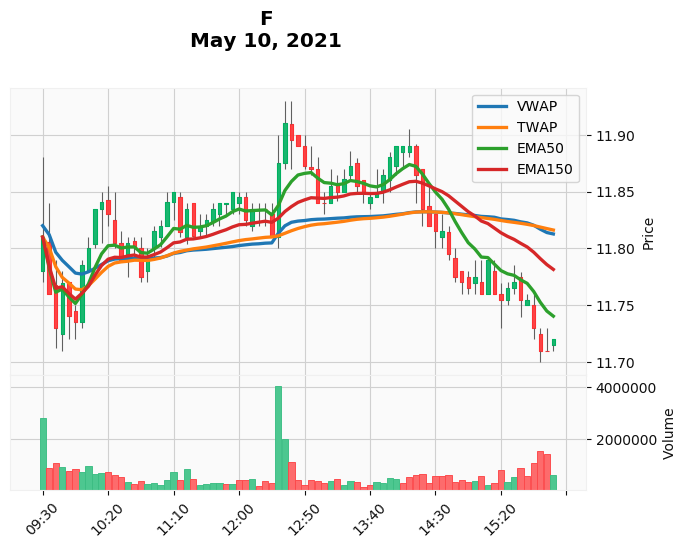

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 70.562 F short contracts at 11.81 per contract
10:05:00: Close 70.562 F short contracts at 11.8 per contract
10:05:00: Buy 70.681 F shares at 11.8 per share
14:30:00: Sell 70.681 F shares at 11.815 per share
14:30:00: Open 70.681 F short contracts at 11.815 per contract
16:00:00: Close 70.681 F short contracts at 11.72 per contract
Cash: $841.81 USD
Return: 1.02%
Transactions: 6
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 70.562 F shares at 11.81 per share
16:00:00: Sell 70.562 F shares at 11.72 per share
Cash: $826.98 USD
Return: -0.76%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
14:30:00: Buy 70.532 F shares at 11.815 per share
16:00:00: Sell 70.532 F shares at 11.72 per share
Cash: $826.63 USD
Return: -0.80%
Transac

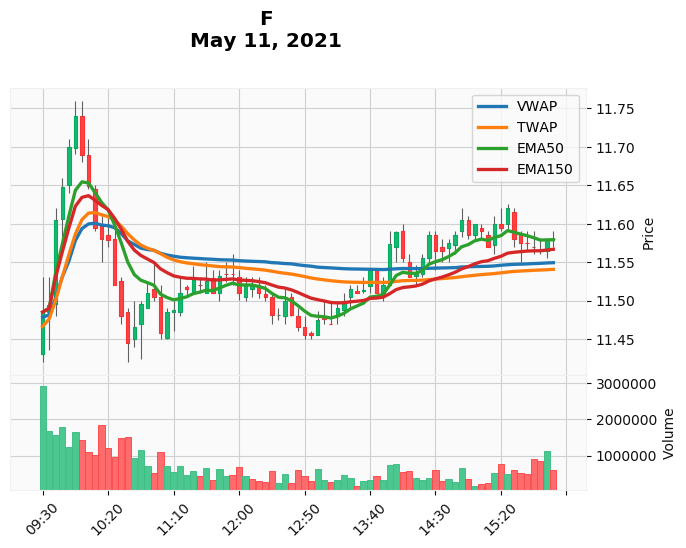

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 72.558 F shares at 11.485 per share
10:20:00: Sell 72.558 F shares at 11.5791 per share
10:20:00: Open 72.558 F short contracts at 11.5791 per contract
14:00:00: Close 72.558 F short contracts at 11.5896 per contract
14:00:00: Buy 72.427 F shares at 11.5896 per share
14:15:00: Sell 72.427 F shares at 11.535 per share
14:15:00: Open 72.427 F short contracts at 11.535 per contract
14:25:00: Close 72.427 F short contracts at 11.585 per contract
14:25:00: Buy 71.802 F shares at 11.585 per share
16:00:00: Sell 71.802 F shares at 11.58 per share
Cash: $831.46 USD
Return: -0.22%
Transactions: 10
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 72.558 F short contracts at 11.485 per contract
10:35:00: Close 72.558 F short contracts at 11.445 per contract
10:35:00: Buy 73.066 F shares at 11.445 per share
16:00:00: Sell 73.066 F sh

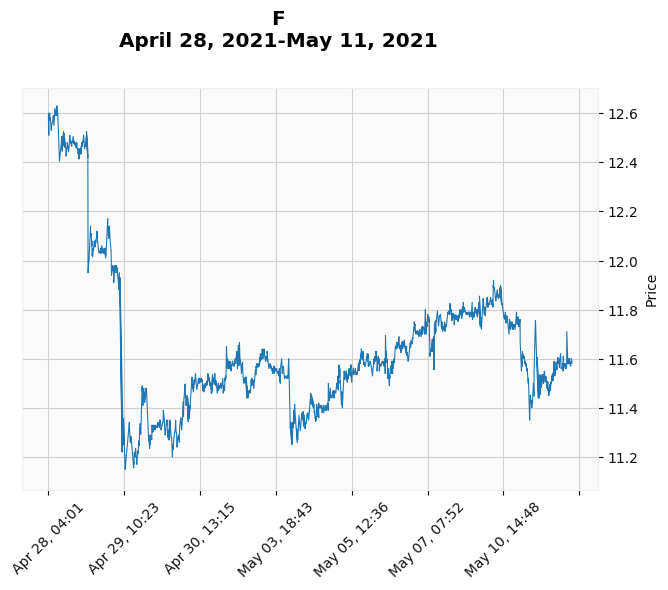

F Returns
Strategy 1: -0.649%
Strategy 2:  0.312%
Strategy 3:  0.337%
Strategy 4: -0.300%
Market    : -0.163%
----------------------------------------------------------------------


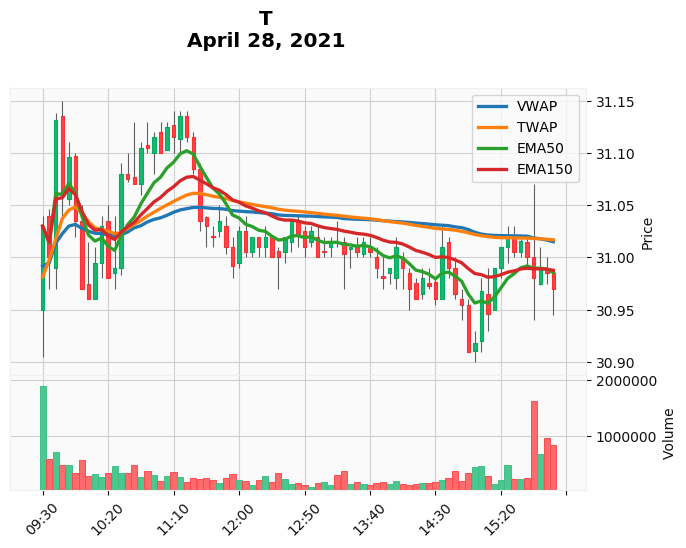

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 26.856 T shares at 31.0301 per share
10:05:00: Sell 26.856 T shares at 30.9601 per share
10:05:00: Open 26.856 T short contracts at 30.9601 per contract
10:35:00: Close 26.856 T short contracts at 31.075 per contract
10:35:00: Buy 26.657 T shares at 31.075 per share
11:35:00: Sell 26.657 T shares at 31.03 per share
11:35:00: Open 26.657 T short contracts at 31.03 per contract
16:00:00: Close 26.657 T short contracts at 30.97 per contract
Cash: $828.77 USD
Return: -0.55%
Transactions: 8
----------------------------------------------------------------------
2021-04-28: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 26.856 T short contracts at 31.0301 per contract
16:00:00: Close 26.856 T short contracts at 30.97 per contract
Cash: $834.95 USD
Return: 0.19%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting EMA Cross strategy with $833.33 USD
11:50

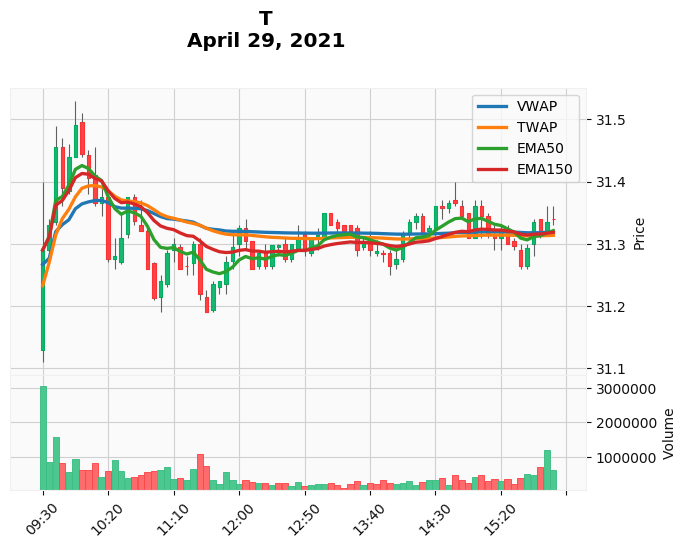

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 26.633 T shares at 31.29 per share
10:25:00: Sell 26.633 T shares at 31.28 per share
10:25:00: Open 26.633 T short contracts at 31.28 per contract
13:10:00: Close 26.633 T short contracts at 31.33 per contract
13:10:00: Buy 26.548 T shares at 31.33 per share
13:35:00: Sell 26.548 T shares at 31.305 per share
13:35:00: Open 26.548 T short contracts at 31.305 per contract
14:15:00: Close 26.548 T short contracts at 31.345 per contract
14:15:00: Buy 26.480 T shares at 31.345 per share
15:15:00: Sell 26.480 T shares at 31.31 per share
15:15:00: Open 26.480 T short contracts at 31.31 per contract
15:50:00: Close 26.480 T short contracts at 31.32 per contract
15:50:00: Buy 26.463 T shares at 31.32 per share
16:00:00: Sell 26.463 T shares at 31.34 per share
Cash: $829.35 USD
Return: -0.48%
Transactions: 14
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with 

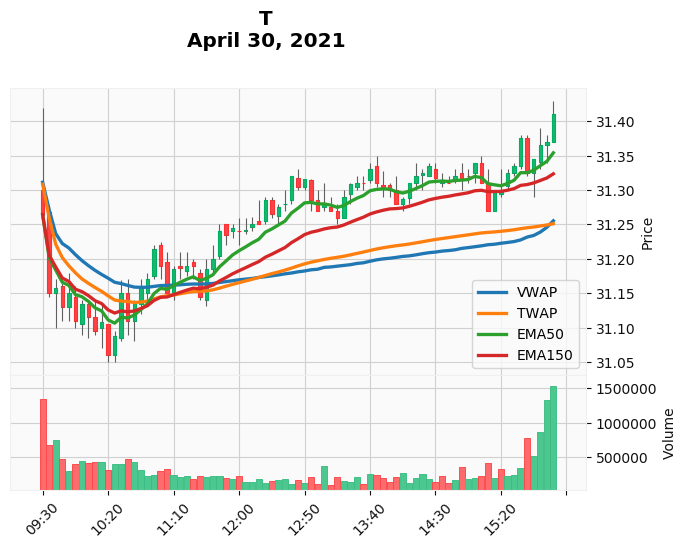

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 26.655 T short contracts at 31.2641 per contract
10:55:00: Close 26.655 T short contracts at 31.215 per contract
10:55:00: Buy 26.738 T shares at 31.215 per share
16:00:00: Sell 26.738 T shares at 31.41 per share
Cash: $839.86 USD
Return: 0.78%
Transactions: 4
----------------------------------------------------------------------
2021-04-30: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 26.655 T shares at 31.2641 per share
16:00:00: Sell 26.655 T shares at 31.41 per share
Cash: $837.22 USD
Return: 0.47%
Transactions: 2
----------------------------------------------------------------------
2021-04-30: Starting EMA Cross strategy with $833.33 USD
Cash: $833.33 USD
Return: 0.00%
Transactions: 0
----------------------------------------------------------------------
2021-04-30: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Open 26.655 T short contracts at 31.2641 per contract
10:55:00: Close 26

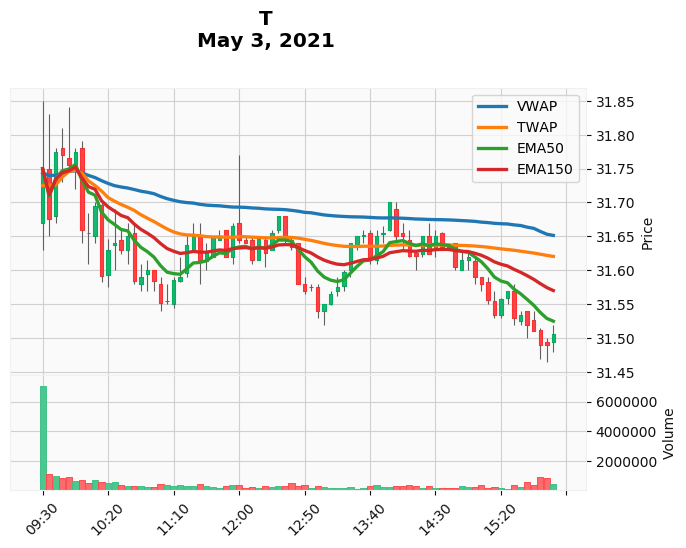

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 26.247 T shares at 31.75 per share
10:05:00: Sell 26.247 T shares at 31.655 per share
10:05:00: Open 26.247 T short contracts at 31.655 per contract
16:00:00: Close 26.247 T short contracts at 31.5066 per contract
Cash: $834.73 USD
Return: 0.17%
Transactions: 4
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 26.247 T short contracts at 31.75 per contract
16:00:00: Close 26.247 T short contracts at 31.5066 per contract
Cash: $839.72 USD
Return: 0.77%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 26.355 T shares at 31.62 per share
11:55:00: Sell 26.355 T shares at 31.665 per share
12:10:00: Buy 26.396 T shares at 31.615 per share
12:15:00: Sell 26.396 T shares at 31.6465 per share
12:45:00: Buy 26.452 T shares at

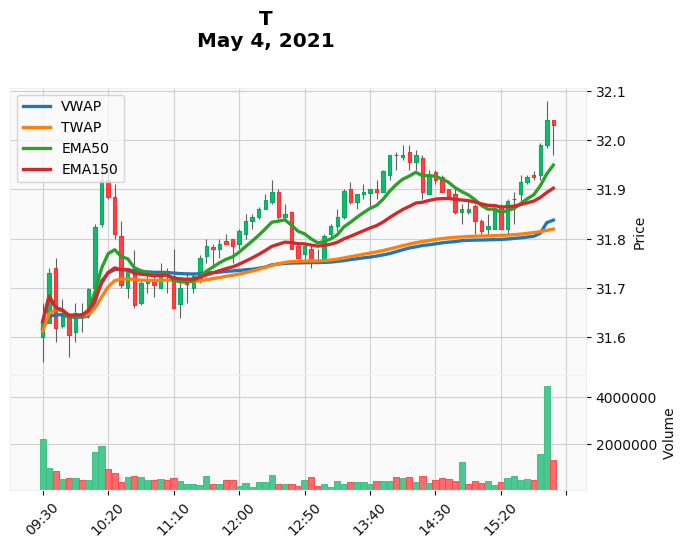

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 26.345 T shares at 31.6319 per share
09:45:00: Sell 26.345 T shares at 31.645 per share
09:45:00: Open 26.345 T short contracts at 31.645 per contract
10:00:00: Close 26.345 T short contracts at 31.645 per contract
10:00:00: Buy 26.345 T shares at 31.645 per share
10:45:00: Sell 26.345 T shares at 31.71 per share
10:45:00: Open 26.345 T short contracts at 31.71 per contract
11:35:00: Close 26.345 T short contracts at 31.785 per contract
11:35:00: Buy 26.220 T shares at 31.785 per share
16:00:00: Sell 26.220 T shares at 32.03 per share
Cash: $839.84 USD
Return: 0.78%
Transactions: 10
----------------------------------------------------------------------
2021-05-04: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 26.345 T short contracts at 31.6319 per contract
16:00:00: Close 26.345 T short contracts at 32.03 per contract
Cash: $822.85 USD
Return: -1.26%
Transactions: 2
---------------------------------

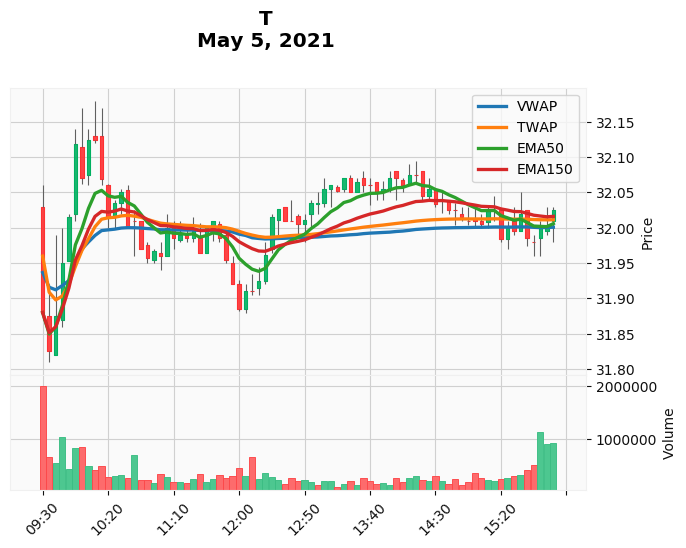

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 26.140 T short contracts at 31.88 per contract
09:50:00: Close 26.140 T short contracts at 32.015 per contract
09:50:00: Buy 25.919 T shares at 32.015 per share
10:50:00: Sell 25.919 T shares at 31.9577 per share
10:50:00: Open 25.919 T short contracts at 31.9577 per contract
11:40:00: Close 25.919 T short contracts at 32.01 per contract
11:40:00: Buy 25.835 T shares at 32.01 per share
11:50:00: Sell 25.835 T shares at 31.955 per share
11:50:00: Open 25.835 T short contracts at 31.955 per contract
12:30:00: Close 25.835 T short contracts at 32.0273 per contract
12:30:00: Buy 25.718 T shares at 32.0273 per share
15:25:00: Sell 25.718 T shares at 32.0 per share
15:25:00: Open 25.718 T short contracts at 32.0 per contract
16:00:00: Close 25.718 T short contracts at 32.025 per contract
16:00:00: Buy 25.678 T shares at 32.025 per share
16:00:00: Sell 25.678 T shares at 32.025 per share
Cash: $822.33 USD
Return: -1.32%


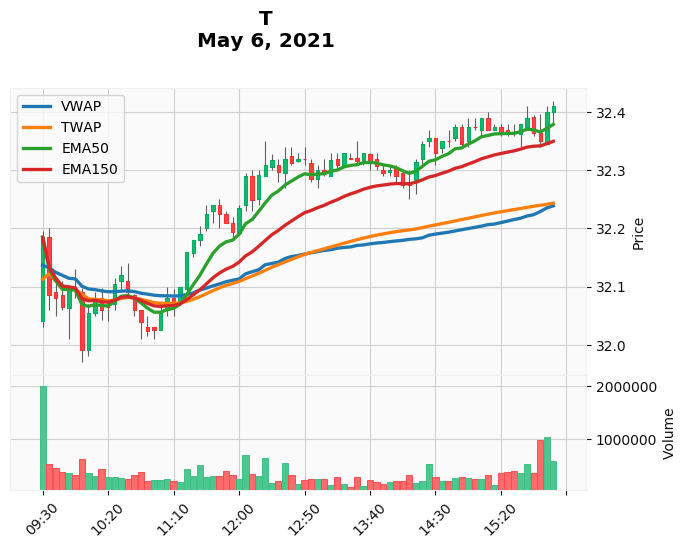

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 25.892 T shares at 32.185 per share
09:40:00: Sell 25.892 T shares at 32.08 per share
09:40:00: Open 25.892 T short contracts at 32.08 per contract
10:30:00: Close 25.892 T short contracts at 32.12 per contract
10:30:00: Buy 25.827 T shares at 32.12 per share
10:40:00: Sell 25.827 T shares at 32.06 per share
10:40:00: Open 25.827 T short contracts at 32.06 per contract
11:20:00: Close 25.827 T short contracts at 32.16 per contract
11:20:00: Buy 25.667 T shares at 32.16 per share
16:00:00: Sell 25.667 T shares at 32.41 per share
Cash: $831.86 USD
Return: -0.18%
Transactions: 10
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 25.892 T short contracts at 32.185 per contract
16:00:00: Close 25.892 T short contracts at 32.41 per contract
Cash: $827.51 USD
Return: -0.70%
Transactions: 2
----------------------------------------

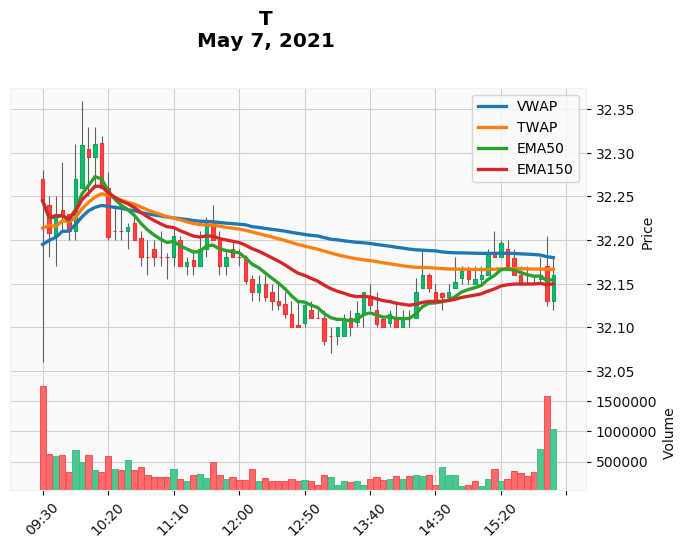

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 25.844 T shares at 32.245 per share
10:25:00: Sell 25.844 T shares at 32.21 per share
10:25:00: Open 25.844 T short contracts at 32.21 per contract
16:00:00: Close 25.844 T short contracts at 32.16 per contract
Cash: $833.72 USD
Return: 0.05%
Transactions: 4
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 25.844 T short contracts at 32.245 per contract
16:00:00: Close 25.844 T short contracts at 32.16 per contract
Cash: $835.53 USD
Return: 0.26%
Transactions: 2
----------------------------------------------------------------------
2021-05-07: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 25.896 T shares at 32.18 per share
14:40:00: Sell 25.896 T shares at 32.1401 per share
Cash: $832.30 USD
Return: -0.12%
Transactions: 2
----------------------------------------------------------------------
2021-05-07: Start

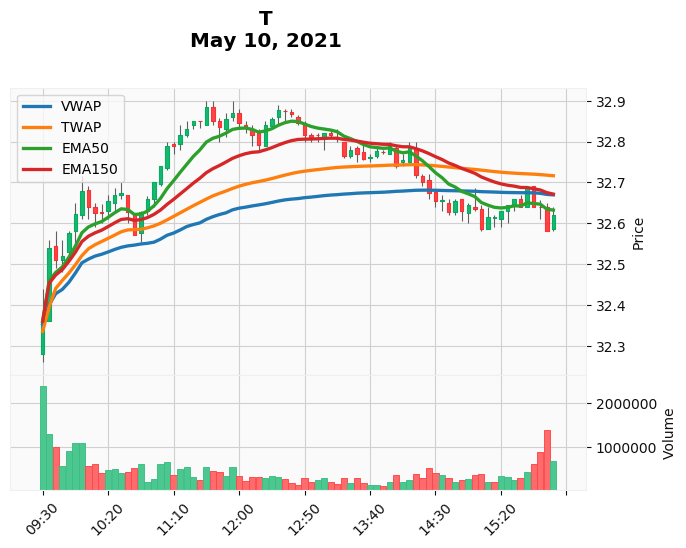

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 25.752 T shares at 32.36 per share
14:30:00: Sell 25.752 T shares at 32.655 per share
14:30:00: Open 25.752 T short contracts at 32.655 per contract
16:00:00: Close 25.752 T short contracts at 32.62 per contract
Cash: $841.83 USD
Return: 1.02%
Transactions: 4
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 25.752 T short contracts at 32.36 per contract
16:00:00: Close 25.752 T short contracts at 32.62 per contract
Cash: $826.64 USD
Return: -0.80%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
13:30:00: Buy 25.430 T shares at 32.77 per share
16:00:00: Sell 25.430 T shares at 32.62 per share
Cash: $829.52 USD
Return: -0.46%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starti

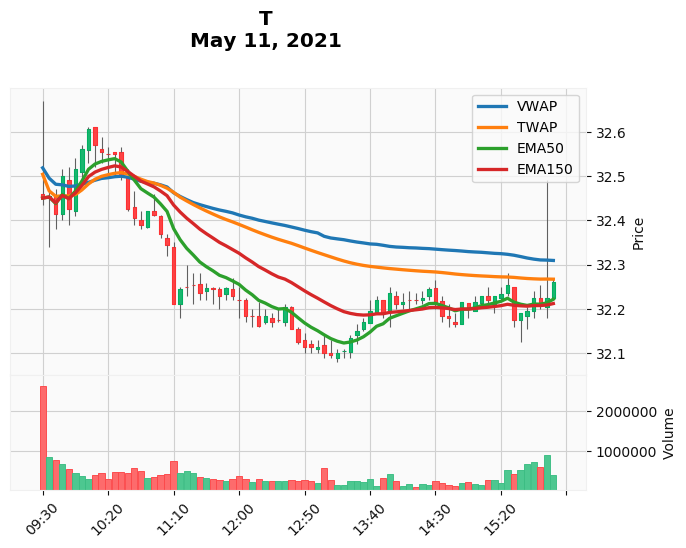

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 25.681 T short contracts at 32.45 per contract
10:00:00: Close 25.681 T short contracts at 32.56 per contract
10:00:00: Buy 25.507 T shares at 32.56 per share
10:40:00: Sell 25.507 T shares at 32.405 per share
10:40:00: Open 25.507 T short contracts at 32.405 per contract
16:00:00: Close 25.507 T short contracts at 32.26 per contract
Cash: $830.25 USD
Return: -0.37%
Transactions: 6
----------------------------------------------------------------------
2021-05-11: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 25.681 T shares at 32.45 per share
16:00:00: Sell 25.681 T shares at 32.26 per share
Cash: $828.45 USD
Return: -0.59%
Transactions: 2
----------------------------------------------------------------------
2021-05-11: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 25.842 T shares at 32.2468 per share
14:15:00: Sell 25.842 T shares at 32.22 per share
14:45:00: Buy 25.887 T shares at 32.

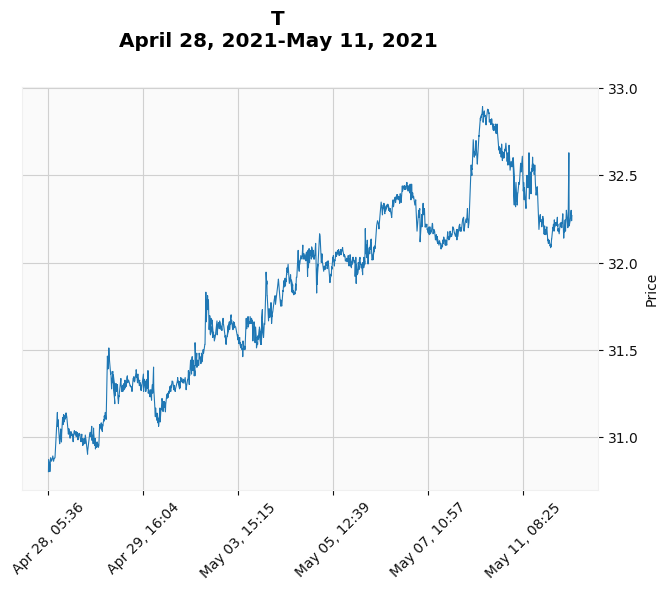

T Returns
Strategy 1: -0.009%
Strategy 2: -0.136%
Strategy 3:  0.058%
Strategy 4:  0.031%
Market    :  0.317%
----------------------------------------------------------------------


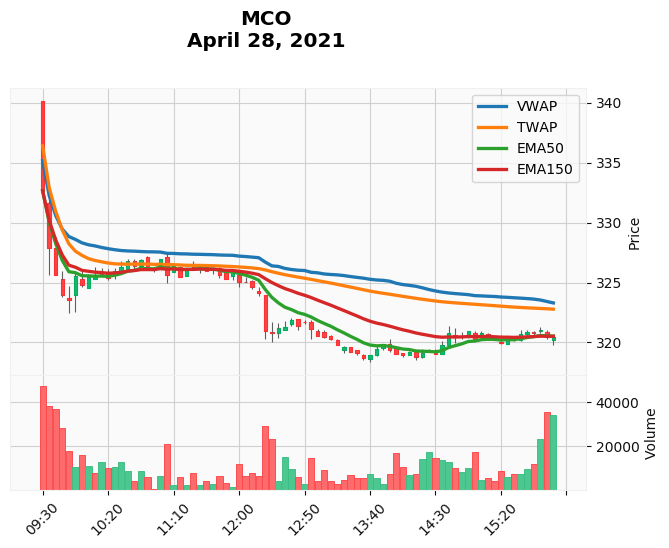

2021-04-28: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 2.505 MCO short contracts at 332.64 per contract
16:00:00: Close 2.505 MCO short contracts at 320.44 per contract
Cash: $863.90 USD
Return: 3.67%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 2.505 MCO shares at 332.64 per share
16:00:00: Sell 2.505 MCO shares at 320.44 per share
Cash: $802.77 USD
Return: -3.67%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 2.562 MCO shares at 325.3075 per share
15:50:00: Sell 2.562 MCO shares at 321.01 per share
Cash: $822.32 USD
Return: -1.32%
Transactions: 2
----------------------------------------------------------------------
2021-04-28: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Open 2.505 MCO short contracts at 332.64 per contract
16:00:00

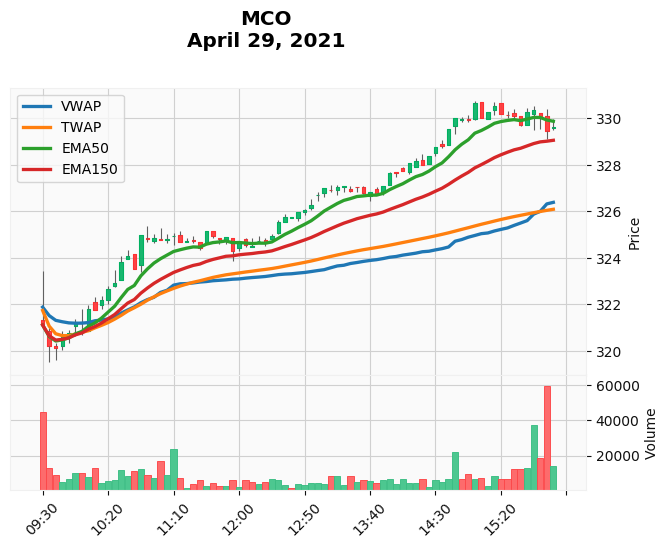

2021-04-29: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 2.595 MCO short contracts at 321.1 per contract
10:10:00: Close 2.595 MCO short contracts at 321.73 per contract
10:10:00: Buy 2.585 MCO shares at 321.73 per share
16:00:00: Sell 2.585 MCO shares at 329.61 per share
Cash: $852.07 USD
Return: 2.25%
Transactions: 4
----------------------------------------------------------------------
2021-04-29: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 2.595 MCO shares at 321.1 per share
13:00:00: Sell 2.595 MCO shares at 326.6999 per share
13:00:00: Open 2.595 MCO short contracts at 326.6999 per contract
16:00:00: Close 2.595 MCO short contracts at 329.61 per contract
Cash: $840.31 USD
Return: 0.84%
Transactions: 4
----------------------------------------------------------------------
2021-04-29: Starting EMA Cross strategy with $833.33 USD
Cash: $833.33 USD
Return: 0.00%
Transactions: 0
----------------------------------------------------------------------
2021

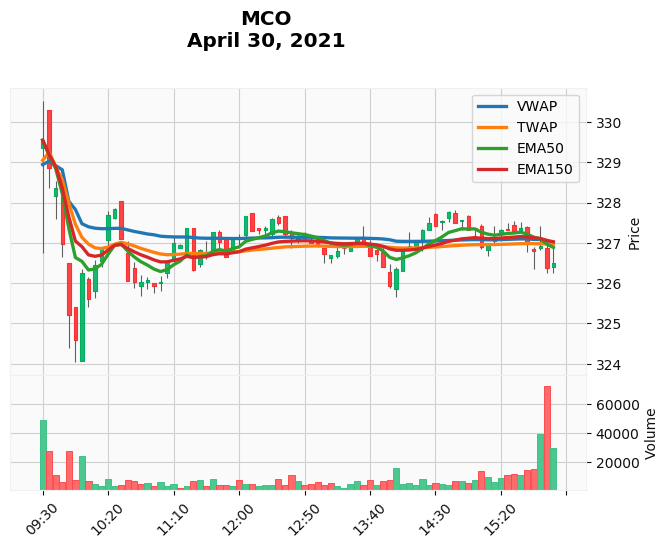

2021-04-30: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 2.529 MCO shares at 329.55 per share
09:40:00: Sell 2.529 MCO shares at 328.35 per share
09:40:00: Open 2.529 MCO short contracts at 328.35 per contract
10:25:00: Close 2.529 MCO short contracts at 327.83 per contract
10:25:00: Buy 2.537 MCO shares at 327.83 per share
10:35:00: Sell 2.537 MCO shares at 326.06 per share
10:35:00: Open 2.537 MCO short contracts at 326.06 per contract
12:05:00: Close 2.537 MCO short contracts at 327.655 per contract
12:05:00: Buy 2.512 MCO shares at 327.655 per share
12:45:00: Sell 2.512 MCO shares at 327.13 per share
12:45:00: Open 2.512 MCO short contracts at 327.13 per contract
14:20:00: Close 2.512 MCO short contracts at 327.33 per contract
14:20:00: Buy 2.509 MCO shares at 327.33 per share
15:10:00: Sell 2.509 MCO shares at 327.0025 per share
15:10:00: Open 2.509 MCO short contracts at 327.0025 per contract
15:20:00: Close 2.509 MCO short contracts at 327.32 per contract
15:20:00

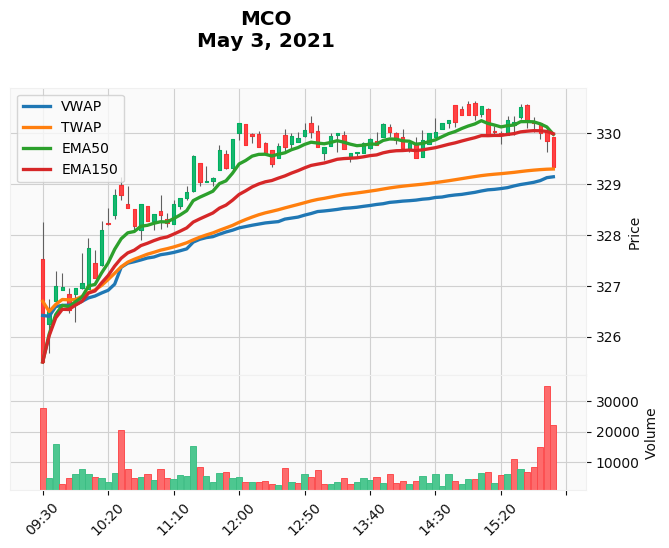

2021-05-03: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 2.560 MCO short contracts at 325.5 per contract
09:40:00: Close 2.560 MCO short contracts at 327.0 per contract
09:40:00: Buy 2.537 MCO shares at 327.0 per share
16:00:00: Sell 2.537 MCO shares at 329.32 per share
Cash: $835.38 USD
Return: 0.25%
Transactions: 4
----------------------------------------------------------------------
2021-05-03: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 2.560 MCO shares at 325.5 per share
16:00:00: Sell 2.560 MCO shares at 329.32 per share
Cash: $843.11 USD
Return: 1.17%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting EMA Cross strategy with $833.33 USD
16:00:00: Buy 2.530 MCO shares at 329.32 per share
16:00:00: Sell 2.530 MCO shares at 329.32 per share
Cash: $833.33 USD
Return: 0.00%
Transactions: 2
----------------------------------------------------------------------
2021-05-03: Starting VWAP + TWAP str

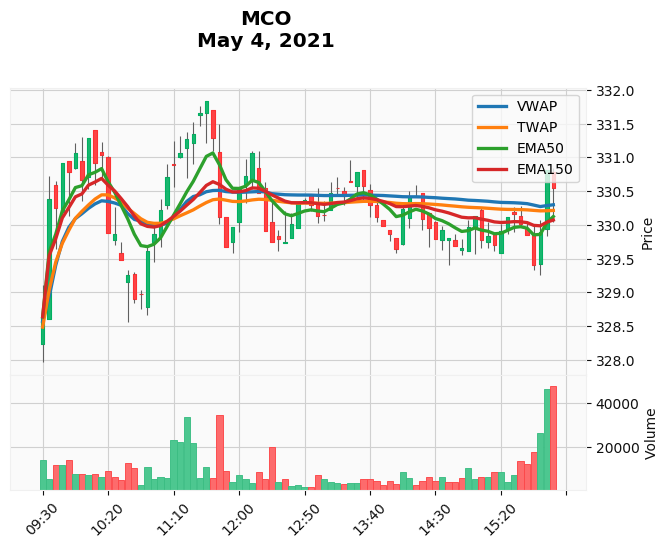

2021-05-04: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 2.536 MCO shares at 328.64 per share
10:25:00: Sell 2.536 MCO shares at 329.86 per share
10:25:00: Open 2.536 MCO short contracts at 329.86 per contract
11:05:00: Close 2.536 MCO short contracts at 330.715 per contract
11:05:00: Buy 2.523 MCO shares at 330.715 per share
11:50:00: Sell 2.523 MCO shares at 329.67 per share
11:50:00: Open 2.523 MCO short contracts at 329.67 per contract
12:05:00: Close 2.523 MCO short contracts at 330.72 per contract
12:05:00: Buy 2.507 MCO shares at 330.72 per share
12:25:00: Sell 2.507 MCO shares at 329.75 per share
12:25:00: Open 2.507 MCO short contracts at 329.75 per contract
13:15:00: Close 2.507 MCO short contracts at 330.55 per contract
13:15:00: Buy 2.494 MCO shares at 330.55 per share
13:45:00: Sell 2.494 MCO shares at 330.11 per share
13:45:00: Open 2.494 MCO short contracts at 330.11 per contract
16:00:00: Close 2.494 MCO short contracts at 330.54 per contract
16:00:00: Bu

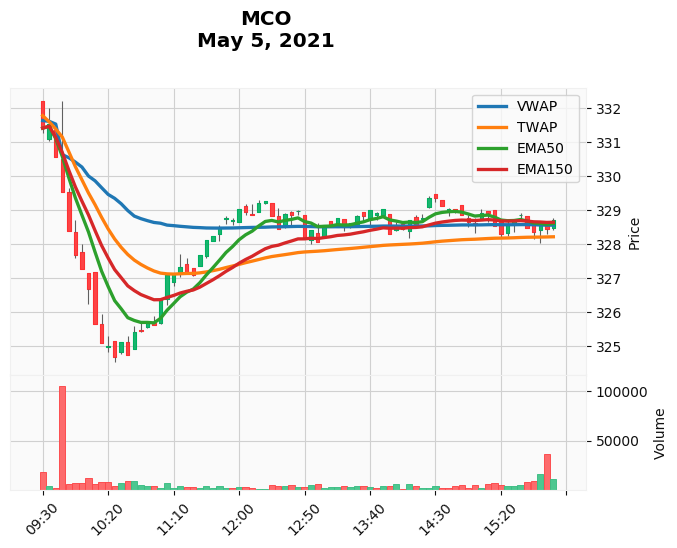

2021-05-05: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 2.515 MCO short contracts at 331.41 per contract
11:50:00: Close 2.515 MCO short contracts at 328.775 per contract
11:50:00: Buy 2.555 MCO shares at 328.775 per share
12:55:00: Sell 2.555 MCO shares at 328.42 per share
12:55:00: Open 2.555 MCO short contracts at 328.42 per contract
13:10:00: Close 2.555 MCO short contracts at 328.57 per contract
13:10:00: Buy 2.552 MCO shares at 328.57 per share
14:00:00: Sell 2.552 MCO shares at 328.52 per share
14:00:00: Open 2.552 MCO short contracts at 328.52 per contract
14:15:00: Close 2.552 MCO short contracts at 328.57 per contract
14:15:00: Buy 2.552 MCO shares at 328.57 per share
16:00:00: Sell 2.552 MCO shares at 328.72 per share
Cash: $838.80 USD
Return: 0.66%
Transactions: 12
----------------------------------------------------------------------
2021-05-05: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 2.515 MCO shares at 331.41 per share
16:00:00: Sell 

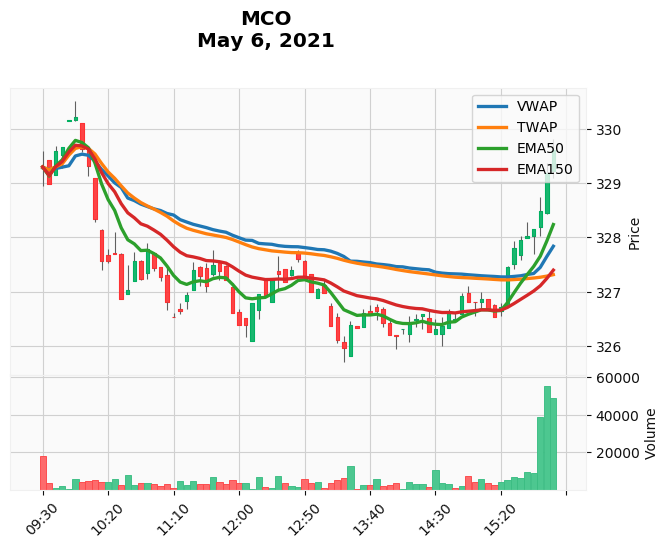

2021-05-06: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 2.531 MCO shares at 329.3 per share
10:10:00: Sell 2.531 MCO shares at 328.34 per share
10:10:00: Open 2.531 MCO short contracts at 328.34 per contract
15:30:00: Close 2.531 MCO short contracts at 327.8 per contract
15:30:00: Buy 2.539 MCO shares at 327.8 per share
16:00:00: Sell 2.539 MCO shares at 329.61 per share
Cash: $836.87 USD
Return: 0.42%
Transactions: 6
----------------------------------------------------------------------
2021-05-06: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 2.531 MCO short contracts at 329.3 per contract
16:00:00: Close 2.531 MCO short contracts at 329.61 per contract
Cash: $832.55 USD
Return: -0.09%
Transactions: 2
----------------------------------------------------------------------
2021-05-06: Starting EMA Cross strategy with $833.33 USD
11:50:00: Buy 2.547 MCO shares at 327.21 per share
15:05:00: Sell 2.547 MCO shares at 326.86 per share
15:15:00: Buy 2.549 MCO s

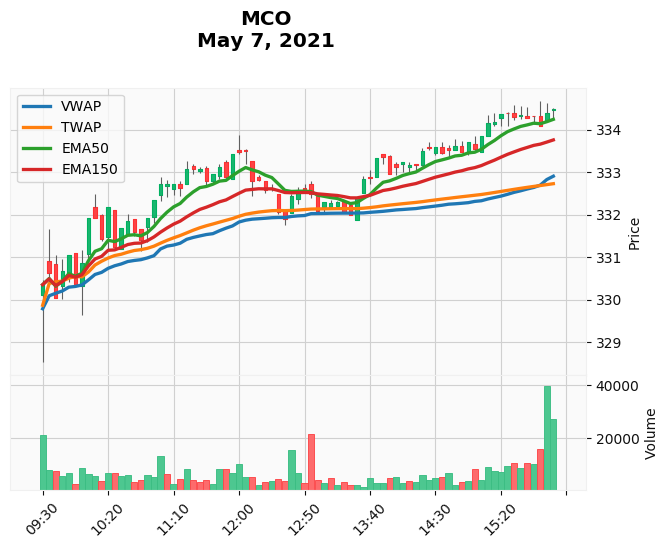

2021-05-07: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Buy 2.523 MCO shares at 330.35 per share
16:00:00: Sell 2.523 MCO shares at 334.49 per share
Cash: $843.78 USD
Return: 1.25%
Transactions: 2
----------------------------------------------------------------------
2021-05-07: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Open 2.523 MCO short contracts at 330.35 per contract
16:00:00: Close 2.523 MCO short contracts at 334.49 per contract
Cash: $822.89 USD
Return: -1.25%
Transactions: 2
----------------------------------------------------------------------
2021-05-07: Starting EMA Cross strategy with $833.33 USD
13:00:00: Buy 2.509 MCO shares at 332.08 per share
13:40:00: Sell 2.509 MCO shares at 332.87 per share
Cash: $835.32 USD
Return: 0.24%
Transactions: 2
----------------------------------------------------------------------
2021-05-07: Starting VWAP + TWAP strategy with $833.33 USD
09:30:00: Buy 2.523 MCO shares at 330.35 per share
16:00:00: Sell 2.523 MCO

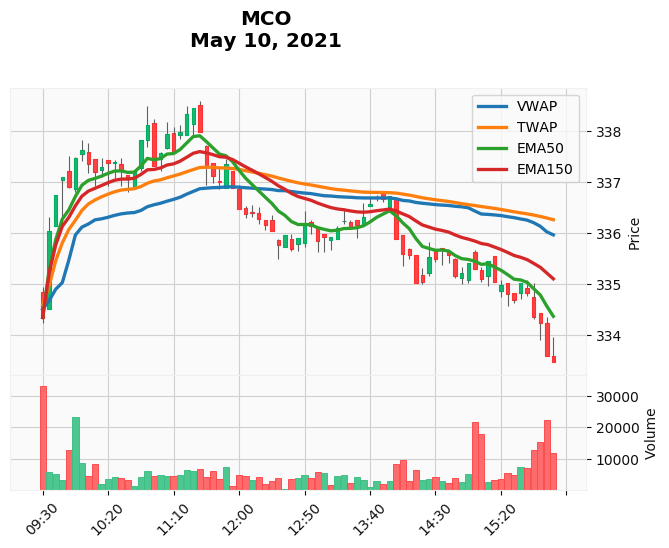

2021-05-10: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 2.492 MCO short contracts at 334.35 per contract
09:40:00: Close 2.492 MCO short contracts at 336.7475 per contract
09:40:00: Buy 2.457 MCO shares at 336.7475 per share
12:00:00: Sell 2.457 MCO shares at 336.47 per share
12:00:00: Open 2.457 MCO short contracts at 336.47 per contract
16:00:00: Close 2.457 MCO short contracts at 333.48 per contract
Cash: $834.02 USD
Return: 0.08%
Transactions: 6
----------------------------------------------------------------------
2021-05-10: Starting VWAP Mean reversion with $833.33 USD
09:30:00: Buy 2.492 MCO shares at 334.35 per share
16:00:00: Sell 2.492 MCO shares at 333.48 per share
Cash: $831.16 USD
Return: -0.26%
Transactions: 2
----------------------------------------------------------------------
2021-05-10: Starting EMA Cross strategy with $833.33 USD
11:55:00: Buy 2.474 MCO shares at 336.88 per share
16:00:00: Sell 2.474 MCO shares at 333.48 per share
Cash: $824.92 USD

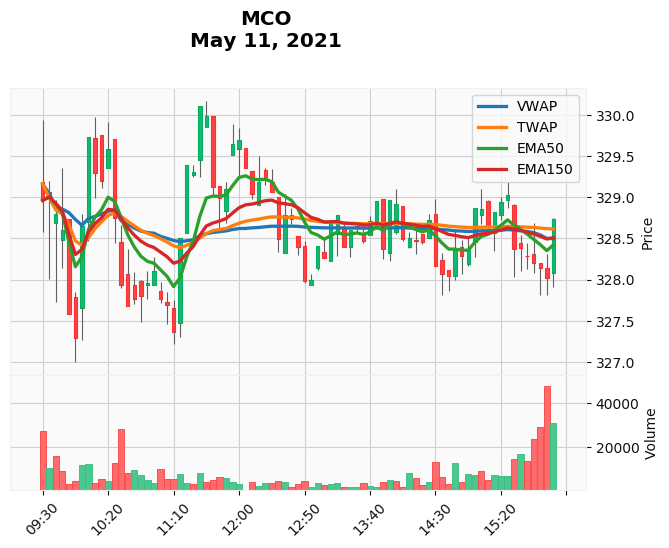

2021-05-11: Starting VWAP Cross strategy with $833.33 USD
09:30:00: Open 2.533 MCO short contracts at 328.96 per contract
10:10:00: Close 2.533 MCO short contracts at 329.29 per contract
10:10:00: Buy 2.528 MCO shares at 329.29 per share
10:30:00: Sell 2.528 MCO shares at 327.93 per share
10:30:00: Open 2.528 MCO short contracts at 327.93 per contract
11:20:00: Close 2.528 MCO short contracts at 329.385 per contract
11:20:00: Buy 2.506 MCO shares at 329.385 per share
12:45:00: Sell 2.506 MCO shares at 328.39 per share
12:45:00: Open 2.506 MCO short contracts at 328.39 per contract
13:45:00: Close 2.506 MCO short contracts at 328.95 per contract
13:45:00: Buy 2.497 MCO shares at 328.95 per share
14:10:00: Sell 2.497 MCO shares at 328.5 per share
14:10:00: Open 2.497 MCO short contracts at 328.5 per contract
15:05:00: Close 2.497 MCO short contracts at 328.85 per contract
15:05:00: Buy 2.492 MCO shares at 328.85 per share
15:35:00: Sell 2.492 MCO shares at 328.38 per share
15:35:00: Open

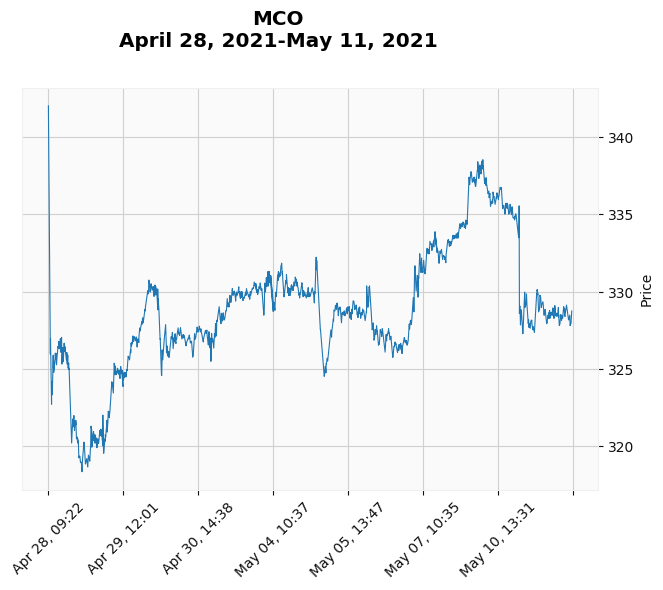

MCO Returns
Strategy 1:  0.364%
Strategy 2: -0.380%
Strategy 3: -0.086%
Strategy 4:  0.513%
Market    : -0.301%
----------------------------------------------------------------------
Portfolio Returns
Strategy 1:  0.208%
Strategy 2: -0.111%
Strategy 3: -0.037%
Strategy 4:  0.198%
Market    : -0.262%
----------------------------------------------------------------------


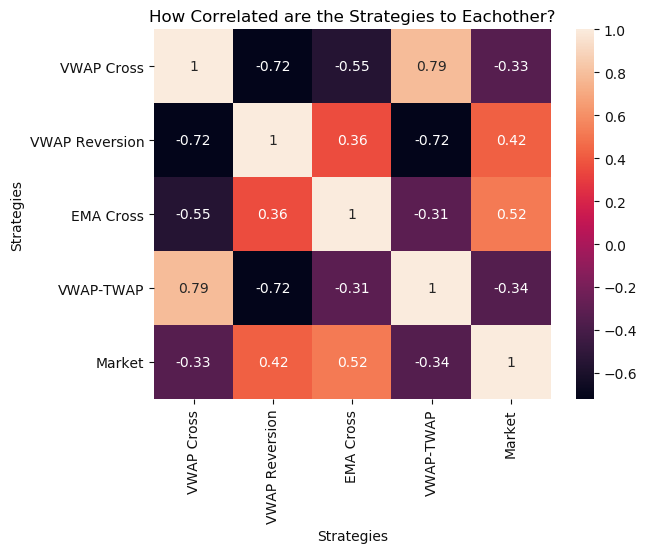

Program time: 178.45 seconds


In [11]:
portfolio = ['V','JNJ','PG', 'KO', 'GME','TSLA','AAPL','AMD','GL','F','T','MCO'] 
cash = 100000 
show_transactions = True
show_graphs       = True
main(portfolio,cash,show_transactions,show_graphs) 